# **Comprehensive Weather Data Analysis and Predictive Modeling: A Case Study of Mansoura, Egypt (1994–2024)**

## **Introduction**

### **Problem Statement**  
"Weather patterns have a significant impact on various sectors, including agriculture, energy, and public safety. In Mansoura, Egypt, a region with diverse weather conditions, understanding long-term trends and making accurate predictions is critical for effective planning and decision-making. This project aims to analyze 30 years of detailed weather data to uncover trends, predict temperatures, and classify weather conditions, providing actionable insights for improved forecasting and resource management."

### **Objectives**  
- To analyze historical weather data from Mansoura, Egypt, spanning August 1994 to June 2024, and identify key trends and patterns.  
- To develop predictive models for accurately forecasting daily temperatures based on historical data.  
- To classify temperature changes by creating a new feature that indicates whether a day’s temperature is higher, lower, or normal compared to the same day in the previous year.  
- To extract actionable insights from weather patterns, contributing to better decision-making in agriculture, energy management, and public safety.

---

## **Dataset Overview**  
"This project utilizes a comprehensive weather dataset for Mansoura, Egypt, covering the period from August 1994 to June 2024. The dataset consolidates daily weather observations, including temperature, humidity, wind speed, solar radiation, and other environmental factors. A new classification column was also added, indicating whether a day’s temperature was higher, lower, or normal compared to the same day in the previous year. This enriched dataset forms the basis for analysis and modeling. The dataset includes the following features:"

---

### **Dataset Columns**  

#### **Temperature-Related Columns**  
- **tempmax:** Maximum temperature recorded on the given day (°C).  
- **tempmin:** Minimum temperature recorded on the given day (°C).  
- **temp:** Average temperature recorded on the given day (°C).  
- **feelslikemax:** Maximum "feels like" temperature based on heat index or wind chill (°C).  
- **feelslikemin:** Minimum "feels like" temperature based on heat index or wind chill (°C).  
- **feelslike:** Average "feels like" temperature (°C).  

#### **Humidity and Precipitation-Related Columns**  
- **dew:** Dew point temperature, indicating the temperature at which water vapor condenses into liquid (°C).  
- **humidity:** Average relative humidity as a percentage (%).  
- **precip:** Total precipitation recorded on the given day (mm).  
- **precipprob:** Probability of precipitation as a percentage (%).  
- **precipcover:** Percentage of the day covered by precipitation.  
- **preciptype:** Type of precipitation (e.g., rain, snow); contains many missing values.

#### **Wind and Visibility-Related Columns**  
- **windgust:** Maximum wind gust speed on the given day (km/h).  
- **windspeed:** Average wind speed on the given day (km/h).  
- **winddir:** Average wind direction in degrees (0° = North, 90° = East, etc.).  
- **visibility:** Average visibility distance (km).

#### **Solar and Atmospheric Columns**  
- **sealevelpressure:** Atmospheric pressure at sea level (hPa).  
- **cloudcover:** Percentage of cloud cover during the day (%).  
- **solarradiation:** Average solar radiation during the day (W/m²).  
- **solarenergy:** Total solar energy received during the day (MJ/m²).  
- **uvindex:** Maximum ultraviolet index on the given day.

#### **Temporal and Categorical Columns**  
- **sunrise:** Time of sunrise in HH:MM:SS format.  
- **sunset:** Time of sunset in HH:MM:SS format.  
- **moonphase:** Numeric value representing the phase of the moon (0 = New Moon, 1 = Full Moon).  
- **conditions:** General weather conditions (e.g., clear, cloudy, rainy).  
- **description:** A descriptive summary of the day's weather conditions.  
- **icon:** Visual representation of the weather (e.g., clear-day, cloudy).  
- **stations:** Weather stations contributing to the data for this observation.

---

## **Library Imports**

Before we begin the analysis, we need to import the essential libraries required for data manipulation, visualization, and modeling:

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib import cm
import seaborn as sns

# Scikit-learn for machine learning models and metrics
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error, classification_report,r2_score
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from datetime import datetime, timedelta

import os
import calendar



## **Data Preprocessing**

### **Data Loading and Merging**  
"The weather data was stored across multiple CSV files in a designated directory, representing different time periods. To streamline the process of gathering and combining these files, the `os` library was utilized to iterate through the directory and identify all relevant files."

"Using the `pandas` library, the CSV files were programmatically loaded and concatenated into a single, unified dataset. This approach ensured consistency and facilitated seamless analysis of the complete data spanning 30 years."

In [ ]:
# Define the city
city = "Mansoura"  # Can easily switch to "Cairo" or another city

# Set the directory path based on the city
data_dir = rf'E:\\project for data in innovadigit\\Comprehensive-Weather-Analytics-ML-Mansoura-1994-2024-\\data\\Mansoura\\{city}'

# List all CSV files for that city
files = [file for file in os.listdir(data_dir) if file.endswith('.csv')]

# Merge all CSV files into one DataFrame
df = pd.concat([pd.read_csv(os.path.join(data_dir, file)) for file in files], ignore_index=True)


df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11111 entries, 0 to 11110
Data columns (total 33 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              11054 non-null  object 
 1   datetime          11054 non-null  object 
 2   tempmax           10967 non-null  float64
 3   tempmin           10967 non-null  float64
 4   temp              10967 non-null  float64
 5   feelslikemax      10967 non-null  float64
 6   feelslikemin      10967 non-null  float64
 7   feelslike         10967 non-null  float64
 8   dew               10967 non-null  float64
 9   humidity          10967 non-null  float64
 10  precip            5422 non-null   float64
 11  precipprob        10967 non-null  float64
 12  precipcover       11054 non-null  float64
 13  preciptype        555 non-null    object 
 14  snow              1030 non-null   float64
 15  snowdepth         1030 non-null   float64
 16  windgust          1030 non-null   float6

In [6]:
df

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
0,"Mansoura, Egypt",1994-08-01,28.2,22.7,26.5,29.5,22.7,27.3,20.0,68.3,...,NaN,NaN,NaN,1994-08-01T06:11:15,1994-08-01T19:49:57,0.81,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,62325099999
1,"Mansoura, Egypt",1994-08-02,28.2,23.4,25.6,30.3,23.4,26.2,20.4,73.3,...,NaN,NaN,NaN,1994-08-02T06:11:53,1994-08-02T19:49:11,0.84,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,62325099999
2,"Mansoura, Egypt",1994-08-03,29.9,23.4,26.2,31.9,23.4,27.0,21.6,77.1,...,NaN,NaN,NaN,1994-08-03T06:12:30,1994-08-03T19:48:24,0.87,Clear,Partly cloudy throughout the day.,clear-day,62325099999
3,"Mansoura, Egypt",1994-08-04,31.4,22.7,26.5,32.0,22.7,27.0,19.8,68.8,...,NaN,NaN,NaN,1994-08-04T06:13:08,1994-08-04T19:47:36,0.90,Clear,Clear conditions throughout the day.,clear-day,62325099999
4,"Mansoura, Egypt",1994-08-05,29.9,23.2,26.0,32.8,23.2,27.0,21.3,76.1,...,NaN,NaN,NaN,1994-08-05T06:13:46,1994-08-05T19:46:46,0.94,Clear,Clear conditions throughout the day.,clear-day,62325099999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [73]:
%%time
df.isna().any(axis=1).sum()

CPU times: total: 0 ns
Wall time: 3.83 ms


np.int64(10955)

In [65]:
%%time
df[df.isna().any(axis=1)].shape[0]

CPU times: total: 0 ns
Wall time: 12.4 ms


10955

In [74]:
df

array([['Mansoura, Egypt', '1994-08-01', 28.2, ...,
        'Partly cloudy throughout the day.', 'partly-cloudy-day',
        62325099999],
       ['Mansoura, Egypt', '1994-08-02', 28.2, ...,
        'Partly cloudy throughout the day.', 'partly-cloudy-day',
        62325099999],
       ['Mansoura, Egypt', '1994-08-03', 29.9, ...,
        'Partly cloudy throughout the day.', 'clear-day', 62325099999],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=object)

In [253]:
df.index+2


RangeIndex(start=2, stop=11113, step=1)

In [245]:
%time
df.columns.values[::-1]

CPU times: total: 0 ns
Wall time: 0 ns


array(['stations', 'icon', 'description', 'conditions', 'moonphase',
       'sunset', 'sunrise', 'severerisk', 'uvindex', 'solarenergy',
       'solarradiation', 'visibility', 'cloudcover', 'sealevelpressure',
       'winddir', 'windspeed', 'windgust', 'snowdepth', 'snow',
       'preciptype', 'precipcover', 'precipprob', 'precip', 'humidity',
       'dew', 'feelslike', 'feelslikemin', 'feelslikemax', 'temp',
       'tempmin', 'tempmax', 'datetime', 'name'], dtype=object)

In [194]:
%%time 
df.isna().values.sum()

CPU times: total: 0 ns
Wall time: 7.23 ms


np.int64(79664)

In [227]:
%%time
df.isna().sum().sum()

CPU times: total: 15.6 ms
Wall time: 8.05 ms


np.int64(79664)

In [3]:
# List of all expected columns based on the data you provided
expected_columns = [
    'name', 'datetime', 'tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike', 
    'dew', 'humidity', 'precip', 'precipprob', 'precipcover', 'preciptype', 'snow', 'snowdepth', 
    'windgust', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation', 
    'solarenergy', 'uvindex', 'severerisk', 'sunrise', 'sunset', 'moonphase', 'conditions', 'description', 
    'icon', 'stations'
]

# Check if all expected columns are present in the new city's dataset
missing_columns = [col for col in expected_columns if col not in df.columns]
if missing_columns:
    print(f"Warning: Missing columns in the dataset: {', '.join(missing_columns)}")
else:
    print("All expected columns are present.")

All expected columns are present.




### **Handling Missing Values**  
The dataset contained missing values across several columns, which were addressed using a structured approach to ensure the quality and integrity of the data while retaining as much information as possible. The following strategies were applied:

1. **Identifying Missing Data:**  
   The dataset was initially examined for missing values using `isnull().sum()`, which provided a summary of the missing data in each column. The `describe()` method was also used to analyze the statistical details of the columns.

2. **Columns with High Missing Values:**  
   Columns like `preciptype`, `snow`, `snowdepth`, `windgust`, `severerisk`, `description`, `icon`, and `stations` had high percentages of missing data (over 90%) and were excluded from the dataset to simplify further analysis.

3. **Imputation for Categorical Features:**  
   Missing values in the categorical column `conditions` were imputed with the **most frequent value (mode)**. This was done since `conditions` represents categorical data and filling it with the mode ensures it retains the most common value.

4. **Imputation for Numerical Features:**  
   Missing values in numerical features such as `sealevelpressure` and `visibility` were imputed using the **median**. The median is used instead of the mean to avoid skewing the data due to outliers.

5. **Imputation for Numerical Features Grouped by 'Conditions':**  
   For columns like `precip`, `solarradiation`, `solarenergy`, and `uvindex`, missing values were filled within each group (defined by the `conditions` column). The missing values were filled using the **mode** of the group, and if no mode was available, the **mean** of the group was used as a fallback.

6. **Linear Interpolation for Remaining Missing Values:**  
   Any remaining missing values were handled using **linear interpolation**. This method was applied with a backward direction to estimate values based on the surrounding data.

7. **Final Check for Missing Values:**  
   After the imputation process, a final check for any remaining missing values was performed using `isnull().sum()`. Any rows with still-missing values were dropped using `dropna(axis=0)` to ensure the dataset is complete.




In [4]:
# Check for missing values
missing_summary = df.isnull().sum()
columns_description = df.describe().T
print(f'missing_summary :\n {missing_summary}')
print(f'columns_description :\n {columns_description}')
df.info()
df.describe().T

missing_summary :
 name                   57
datetime               57
tempmax               144
tempmin               144
temp                  144
feelslikemax          144
feelslikemin          144
feelslike             144
dew                   144
humidity              144
precip               5689
precipprob            144
precipcover            57
preciptype          10556
snow                10081
snowdepth           10081
windgust            10081
windspeed              57
winddir               181
sealevelpressure     1709
cloudcover            144
visibility           1709
solarradiation       5689
solarenergy          5689
uvindex              5689
severerisk          10081
sunrise                57
sunset                 57
moonphase              57
conditions            144
description           144
icon                  144
stations              158
dtype: int64
columns_description :
                     count         mean         std    min      25%      50%  \
tempmax 

,count,mean,std,min,25%,50%,75%,max
tempmax,10967.0,27.494374,7.208044,9.7,21.50,27.40,32.10,46.40
tempmin,10967.0,16.821410,5.509450,1.6,12.20,17.10,21.70,29.40
temp,10967.0,21.619112,5.739006,8.0,16.40,21.90,26.70,34.90
feelslikemax,10967.0,27.574214,7.143799,9.7,21.50,27.00,33.40,54.20
feelslikemin,10967.0,16.610322,5.910107,-3.9,12.20,17.10,21.70,32.60
feelslike,10967.0,21.753752,6.098754,5.5,16.40,21.70,27.20,36.50
dew,10967.0,13.739756,5.211510,-4.0,9.70,13.70,17.80,25.70
humidity,10967.0,65.557172,10.723507,15.3,58.40,67.30,73.30,96.80
precip,5422.0,0.193028,1.699910,0.0,0.00,0.00,0.00,64.40
precipprob,10967.0,4.546394,20.820998,0.0,0.00,0.00,0.00,100.00


In [5]:
# Drop columns with high missing data to simplify the dataset.
df.drop(['preciptype', 'snow', 'snowdepth', 'windgust', 'severerisk', 'description', 'icon', 'stations'], axis=1, inplace=True)

# Fill missing values in 'conditions' with the most frequent value (mode) since it's categorical.
df['conditions'].fillna(df['conditions'].mode()[0], inplace=True)

# Impute missing numerical values with the median to avoid skewing by outliers.
df['sealevelpressure'].fillna(df['sealevelpressure'].median(), inplace=True)
df['visibility'].fillna(df['visibility'].median(), inplace=True)

# Fill missing numerical values grouped by 'conditions' using the mode for each group, fallback to mean if mode is missing.
df['precip'] = df.groupby('conditions')['precip'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else x.mean()))
df['solarradiation'] = df.groupby('conditions')['solarradiation'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else x.mean()))
df['solarenergy'] = df.groupby('conditions')['solarenergy'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else x.mean()))
df['uvindex'] = df.groupby('conditions')['uvindex'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else x.mean()))

# Interpolate any remaining missing values.
df.interpolate(method='linear', limit_direction='backward', inplace=True)

# Check for any remaining missing values in the dataset.
missing_summary = df.isnull().sum()
print("Missing values summary after handling:")
print(missing_summary)
df.info()

Missing values summary after handling:
name                57
datetime            57
tempmax             57
tempmin             57
temp                57
feelslikemax        57
feelslikemin        57
feelslike           57
dew                 57
humidity            57
precip               0
precipprob          57
precipcover         57
windspeed           57
winddir             57
sealevelpressure     0
cloudcover          57
visibility           0
solarradiation       0
solarenergy          0
uvindex              0
sunrise             57
sunset              57
moonphase           57
conditions           0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11111 entries, 0 to 11110
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              11054 non-null  object 
 1   datetime          11054 non-null  object 
 2   tempmax           11054 non-null  float64
 3   tempmin           11054 

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\3052722840.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['conditions'].fillna(df['conditions'].mode()[0], inplace=True)
C:\Users\awint\AppData\Local\Temp\ipykernel_23848\3052722840.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as

In [6]:
df.dropna(axis=0,inplace=True)

# Check for missing values
missing_summary = df.isnull().sum()
columns_description = df.describe().T
print(f'missing_summary :\n {missing_summary}')
print(f'columns_description :\n {columns_description}')
df.info()
df.describe().T


missing_summary :
 name                0
datetime            0
tempmax             0
tempmin             0
temp                0
feelslikemax        0
feelslikemin        0
feelslike           0
dew                 0
humidity            0
precip              0
precipprob          0
precipcover         0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
sunrise             0
sunset              0
moonphase           0
conditions          0
dtype: int64
columns_description :
                     count         mean         std    min       25%     50%  \
tempmax           11054.0    27.470237    7.198154    9.7    21.500    27.3   
tempmin           11054.0    16.848806    5.511819    1.6    12.200    17.1   
temp              11054.0    21.624032    5.732076    8.0    16.400    21.9   
feelslikemax      11054.0    27.561163    7.145089    9.7    21.500    27.0   


,count,mean,std,min,25%,50%,75%,max
tempmax,11054.0,27.470237,7.198154,9.7,21.500,27.3,32.075,46.40
tempmin,11054.0,16.848806,5.511819,1.6,12.200,17.1,21.700,29.40
temp,11054.0,21.624032,5.732076,8.0,16.400,21.9,26.700,34.90
feelslikemax,11054.0,27.561163,7.145089,9.7,21.500,27.0,33.300,54.20
feelslikemin,11054.0,16.641030,5.913317,-3.9,12.200,17.1,21.700,32.60
feelslike,11054.0,21.763574,6.097027,5.5,16.400,21.7,27.200,36.50
dew,11054.0,13.760372,5.217906,-4.0,9.700,13.7,17.800,25.70
humidity,11054.0,65.596413,10.713513,15.3,58.500,67.4,73.300,96.80
precip,11054.0,0.094681,1.194394,0.0,0.000,0.0,0.000,64.40
precipprob,11054.0,4.510612,20.742785,0.0,0.000,0.0,0.000,100.00


## **Data Preprocessing (Continued)**



### **Data Cleaning**  
After handling missing values, additional steps were undertaken to ensure the dataset's consistency and usability. These steps included addressing data type inconsistencies, and removing duplicates. The following cleaning procedures were applied:

1. **Fixing Data Types:**  
   - Converted date-related columns (e.g., `datetime`) to the proper `datetime` format for temporal analysis.  
   - Addressed inconsistencies in date formats using a custom parser to standardize all dates.  

2. **Removing Duplicates:**  
   - Checked for duplicate rows in the `datetime` column and removed them to ensure data integrity.

3. **Handling Missing and Mismatched Dates:**  
   - Created a complete date range from `1994-08-01` to `2024-11-04`.  
   - Compared this range with the `datetime` column to identify mismatches caused by standardizing date formats.  
   - Replaced mismatched dates with the correct values from the generated range.  

4. **Validation:**  
   - A validation function was used to ensure all `datetime` values were correct, duplicates were removed, and missing periods were identified and resolved.

### **Visualization of Temperature Over Time**

A line plot was created to visualize the `temp` values over time after ensuring the dataset was complete and consistent.





In [7]:
# Check for missing values
missing_summary = df.isnull().sum()
columns_description = df.describe().T
print(f'missing_summary :\n {missing_summary}')
print(f'columns_description :\n {columns_description}')
df.info()
# df.describe().T

missing_summary :
 name                0
datetime            0
tempmax             0
tempmin             0
temp                0
feelslikemax        0
feelslikemin        0
feelslike           0
dew                 0
humidity            0
precip              0
precipprob          0
precipcover         0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
sunrise             0
sunset              0
moonphase           0
conditions          0
dtype: int64
columns_description :
                     count         mean         std    min       25%     50%  \
tempmax           11054.0    27.470237    7.198154    9.7    21.500    27.3   
tempmin           11054.0    16.848806    5.511819    1.6    12.200    17.1   
temp              11054.0    21.624032    5.732076    8.0    16.400    21.9   
feelslikemax      11054.0    27.561163    7.145089    9.7    21.500    27.0   


In [8]:
# Check for duplicate rows and drop them to ensure data integrity
df.drop_duplicates(inplace=True)

In [9]:
def unified_date_parser(date_str):
    if pd.isna(date_str):
        return pd.NaT
    
    date_formats = [
        '%Y-%m-%d', '%d-%m-%Y', '%m-%d-%Y',
        '%Y/%m/%d', '%d/%m/%Y', '%m/%d/%Y',
        '%Y.%m.%d', '%d.%m.%Y', '%m.%d.%Y',
        '%d %b %Y', '%d %B %Y',
        '%b %d %Y', '%B %d %Y',
        '%Y%m%d'
    ]
    
    for date_format in date_formats:
        try:
            return pd.to_datetime(date_str, format=date_format)
        except:
            pass
    
    try:
        return pd.to_datetime(date_str)
    except:
        return date_str
    
date_column = 'datetime'

df['Original_Date'] = df[date_column]

df[date_column] = df[date_column].apply(unified_date_parser)

failed_dates = df[pd.to_datetime(df[date_column], errors='coerce').isna() & df['Original_Date'].notna()]

if not failed_dates.empty:
    print(f"We couldn't convert {len(failed_dates)} date(s). Here are some examples:")
    print(failed_dates['Original_Date'].head())
    print("\nPlease review these dates manually.")

df.loc[pd.to_datetime(df[date_column], errors='coerce').notna(), date_column] = pd.to_datetime(df.loc[pd.to_datetime(df[date_column], errors='coerce').notna(), date_column]).dt.strftime('%Y-%m-%d')

# df['datetime'].duplicated().sum()
# [df[df['datetime']!=df['Original_Date']][['datetime','Original_Date']]]


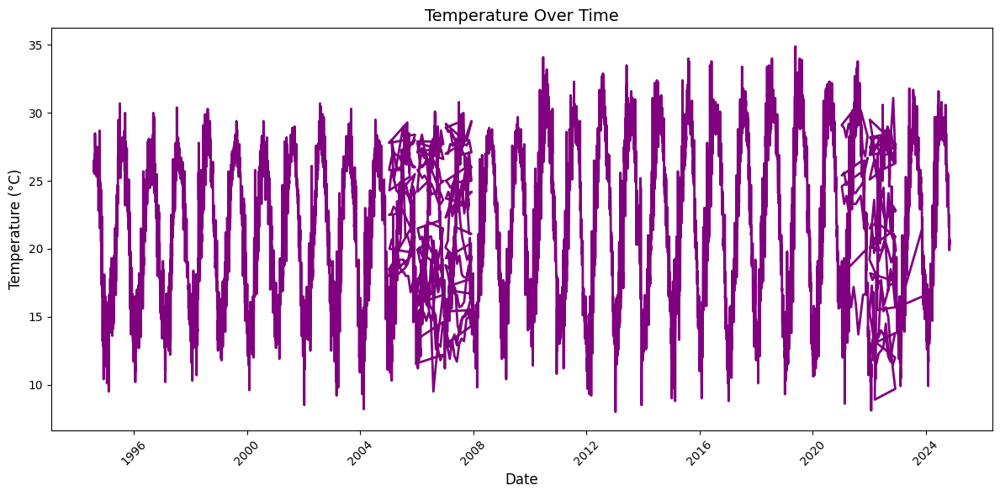

In [10]:
# df = df.sort_values('datetime')
# Plotting the 'temp' values over 'datetime'
plt.figure(figsize=(12, 6))  # Set the figure size

# Plot the temperature ('temp') against the datetime
plt.plot(df['datetime'], df['temp'], color='purple', linewidth=2)

# Adding title and labels
plt.title('Temperature Over Time', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

In [11]:
def validate_weather_data(df):
    """
    Validate weather data to check completeness, detect duplicates, and identify missing values.
    
    Parameters:
    df: DataFrame with two columns - datetime and values.
    
    Returns:
    dict: Dictionary containing the analysis results.
    """
    # Ensure the datetime column is of type datetime
    df['datetime'] = pd.to_datetime(df['datetime'])
    
    # Sort the data by datetime
    df = df.sort_values('datetime').reset_index(drop=True)
    
    # Create a complete date range
    date_range = pd.date_range(start=df['datetime'].min(), 
                               end=df['datetime'].max(), 
                               freq='D')
    complete_df = pd.DataFrame({'datetime': date_range})
    
    # Identify duplicates
    duplicates = df[df.duplicated(['datetime'], keep='first')]
    
    # Merge actual data with the complete range to find missing dates
    merged_df = complete_df.merge(df, on='datetime', how='left', indicator=True)
    missing_dates = merged_df[merged_df['_merge'] == 'left_only']['datetime']
    
    # Analyze time gaps
    gaps = []
    if len(missing_dates) > 0:
        current_gap = {'start': missing_dates.iloc[0], 'end': missing_dates.iloc[0]}
        
        for i in range(1, len(missing_dates)):
            if missing_dates.iloc[i] - missing_dates.iloc[i-1] == timedelta(days=1):
                current_gap['end'] = missing_dates.iloc[i]
            else:
                gaps.append(current_gap)
                current_gap = {'start': missing_dates.iloc[i], 'end': missing_dates.iloc[i]}
        gaps.append(current_gap)
    
    # Prepare the report
    report = {
        'total_records': len(df),
        'expected_records': len(date_range),
        'duplicate_dates': duplicates,
        'missing_dates': missing_dates,
        'gaps': gaps,
        'date_range': {
            'start': df['datetime'].min(),
            'end': df['datetime'].max()
        }
    }
    
    return report

def print_validation_report(report):
    """
    Print the validation report in a structured format.
    """
    print("=== Weather Data Validation Report ===\n")
    
    print(f"Date Range: From {report['date_range']['start']} to {report['date_range']['end']}")
    print(f"Total Records: {report['total_records']}")
    print(f"Expected Records: {report['expected_records']}")
    
    print("\n=== Duplicates ===")
    if len(report['duplicate_dates']) > 0:
        print("\nDuplicate Dates:")
        for idx, row in report['duplicate_dates'].iterrows():
            print(f"Date: {row['datetime']}, Index: {idx}")
    else:
        print("No duplicates found")
    
    print("\n=== Missing Days ===")
    if len(report['missing_dates']) > 0:
        print(f"\nNumber of Missing Days: {len(report['missing_dates'])}")
        print("\nMissing Periods:")
        for gap in report['gaps']:
            if gap['start'] == gap['end']:
                print(f"Missing Day: {gap['start']}")
            else:
                print(f"Missing Period: From {gap['start']} to {gap['end']}")
    else:
        print("No missing days")

In [12]:
df['datetime'].duplicated().sum()

61

In [13]:
report = validate_weather_data(df)
print_validation_report(report)

=== Weather Data Validation Report ===

Date Range: From 1994-08-01 00:00:00 to 2024-11-04 00:00:00
Total Records: 11054
Expected Records: 11054

=== Duplicates ===

Duplicate Dates:
Date: 2005-01-05 00:00:00, Index: 3811
Date: 2005-01-06 00:00:00, Index: 3813
Date: 2005-01-07 00:00:00, Index: 3815
Date: 2005-01-08 00:00:00, Index: 3817
Date: 2005-01-09 00:00:00, Index: 3819
Date: 2005-01-10 00:00:00, Index: 3821
Date: 2005-01-11 00:00:00, Index: 3823
Date: 2005-01-12 00:00:00, Index: 3825
Date: 2005-02-05 00:00:00, Index: 3850
Date: 2005-02-06 00:00:00, Index: 3852
Date: 2005-02-07 00:00:00, Index: 3854
Date: 2005-02-08 00:00:00, Index: 3856
Date: 2005-02-09 00:00:00, Index: 3858
Date: 2005-02-10 00:00:00, Index: 3860
Date: 2005-02-11 00:00:00, Index: 3862
Date: 2005-02-12 00:00:00, Index: 3864
Date: 2005-03-05 00:00:00, Index: 3886
Date: 2005-03-06 00:00:00, Index: 3888
Date: 2005-03-07 00:00:00, Index: 3890
Date: 2005-03-08 00:00:00, Index: 3892
Date: 2005-03-09 00:00:00, Index: 389

In [14]:
# for i in report['duplicate_dates']['datetime']:
#     print(df[df['datetime'] == i])
# df['datetime'].min(),df['datetime'].max()
df[(df['datetime'] >= '2021-10-01') & (df['datetime'] <= '2021-10-10')]
df[(df.index >= df.index[9902])&(df.index <= df.index[9932])]
df.iloc[9902:9932]


,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,cloudcover,visibility,solarradiation,solarenergy,uvindex,sunrise,sunset,moonphase,conditions,Original_Date
9902,"Mansoura, Egypt",2021-10-09,35.2,21.4,27.3,34.6,21.4,27.2,17.4,59.2,...,2.6,10.0,286.8,24.6,9.0,2021-09-10T05:35:48,2021-09-10T18:06:41,0.12,Clear,9/10/2021
9903,"Mansoura, Egypt",2021-11-09,35.3,21.2,26.8,34.6,21.2,26.8,16.9,58.6,...,9.2,10.0,285.8,24.7,9.0,2021-09-11T05:36:22,2021-09-11T18:05:24,0.16,Clear,9/11/2021
9904,"Mansoura, Egypt",2021-12-09,37.3,20.7,28.3,36.3,20.7,28.0,15.5,50.7,...,1.3,10.0,282.5,24.5,9.0,2021-09-12T05:36:57,2021-09-12T18:04:07,0.19,Clear,9/12/2021
9905,"Mansoura, Egypt",2021-09-13,40.8,24.1,30.2,40.3,24.1,30.5,16.0,47.1,...,5.0,10.0,263.6,22.8,9.0,2021-09-13T05:37:31,2021-09-13T18:02:51,0.25,Clear,9/13/2021
9906,"Mansoura, Egypt",2021-09-14,37.9,22.4,28.9,36.9,22.4,29.1,17.8,57.1,...,0.7,10.0,279.3,24.2,9.0,2021-09-14T05:38:05,2021-09-14T18:01:33,0.26,Clear,9/14/2021
9907,"Mansoura, Egypt",2021-09-15,35.6,23.5,28.1,34.6,23.5,28.3,17.7,56.8,...,1.7,10.0,274.9,23.7,9.0,2021-09-15T05:38:40,2021-09-15T18:00:16,0.30,Clear,9/15/2021
9908,"Mansoura, Egypt",2021-09-16,34.5,21.3,26.8,33.0,21.3,26.7,16.0,55.1,...,1.6,10.0,277.9,24.0,9.0,2021-09-16T05:39:14,2021-09-16T17:58:59,0.34,Clear,9/16/2021
9909,"Mansoura, Egypt",2021-09-17,36.0,21.8,28.1,34.9,21.8,27.8,15.5,50.2,...,7.1,10.0,272.7,23.6,9.0,2021-09-17T05:39:49,2021-09-17T17:57:42,0.37,Clear,9/17/2021
9910,"Mansoura, Egypt",2021-09-18,37.5,22.5,29.2,37.1,22.5,29.2,17.3,54.0,...,0.0,10.0,276.2,23.8,9.0,2021-09-18T05:40:24,2021-09-18T17:56:24,0.41,Clear,9/18/2021
9911,"Mansoura, Egypt",2021-09-19,39.0,21.6,28.7,37.0,21.6,28.2,15.5,53.6,...,0.0,10.0,276.7,23.9,9.0,2021-09-19T05:40:58,2021-09-19T17:55:07,0.44,Clear,9/19/2021


In [15]:

# Step 1: Create a date range from '1994-08-01' to '2024-11-04'
date_range = pd.date_range(start= df['datetime'].min(), end= df['datetime'].max(), freq='D')

# Ensure that the length of the date range matches the number of rows in the dataframe
if len(df) < len(date_range):
    print(f"Warning: The dataframe has fewer rows than the date range. Truncating the date range.")
    date_range = date_range[:len(df)]  # Adjust the range to match the dataframe length
elif len(df) > len(date_range):
    print(f"Warning: The dataframe has more rows than the date range. Truncating the dataframe.")
    df = df.head(len(date_range))  # Adjust the dataframe to match the date range length

# Step 2: Create a new column 'new_date' from the generated date range
df['new_date'] = date_range

# Step 3: Compare the 'datetime' column with 'new_date' and replace mismatches
# Initialize a list to record the indices where replacements occurred
replacements = []

# Check where dates differ and replace the original datetime with the new date
for idx, row in df.iterrows():
    if row['datetime'] != row['new_date']:
        df.at[idx, 'datetime'] = row['new_date']  # Replace with the new date
        replacements.append(idx)  # Record the index of replacement

# Step 4: Count the number of replacements
num_replacements = len(replacements)

# Step 5: Print the results
print(f"Total number of replacements: {num_replacements}")
if num_replacements > 0:
    print("Replacements were made at the following indices:")
    print(replacements[:10])  # Print the first 10 replacements (or all if needed)

# Verify if any replacements remain
df['datetime'].duplicated().sum(), df.isnull().sum()


Total number of replacements: 899
Replacements were made at the following indices:
[3903, 3904, 3905, 3906, 3907, 3926, 3927, 3928, 3929, 3931]


(0,
 name                0
 datetime            0
 tempmax             0
 tempmin             0
 temp                0
 feelslikemax        0
 feelslikemin        0
 feelslike           0
 dew                 0
 humidity            0
 precip              0
 precipprob          0
 precipcover         0
 windspeed           0
 winddir             0
 sealevelpressure    0
 cloudcover          0
 visibility          0
 solarradiation      0
 solarenergy         0
 uvindex             0
 sunrise             0
 sunset              0
 moonphase           0
 conditions          0
 Original_Date       0
 new_date            0
 dtype: int64)

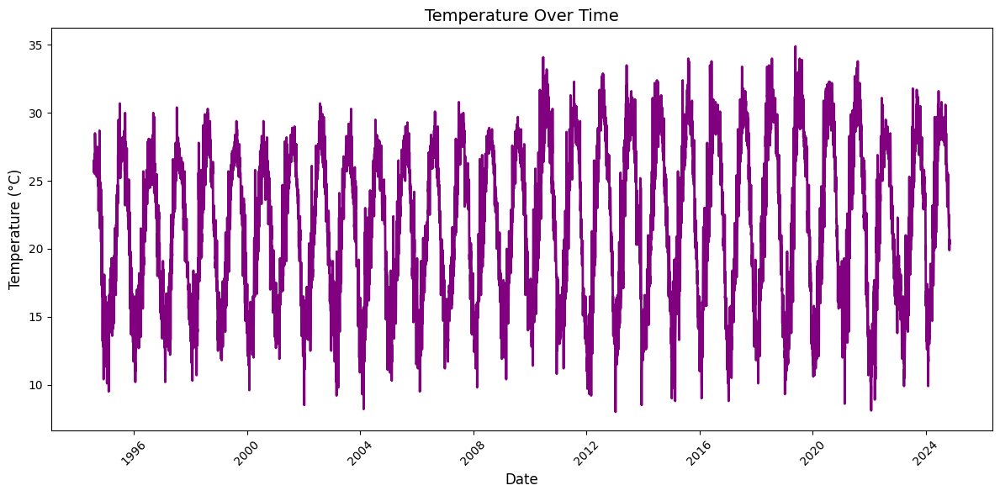

In [16]:
# Plotting the 'temp' values over 'datetime'
plt.figure(figsize=(12, 6))  # Set the figure size

# Plot the temperature ('temp') against the datetime
plt.plot(df['datetime'], df['temp'], color='purple', linewidth=2)

# Adding title and labels
plt.title('Temperature Over Time', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

# df[(df['datetime'] >= '2021-10-01') & (df['datetime'] <= '2021-10-08')]

In [17]:
df[(df['datetime'] >= '2021-10-01') & (df['datetime'] <= '2021-10-08')]

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,visibility,solarradiation,solarenergy,uvindex,sunrise,sunset,moonphase,conditions,Original_Date,new_date
9923,"Mansoura, Egypt",2021-10-01,34.1,19.8,25.4,32.6,19.8,25.2,16.0,60.2,...,10.0,253.1,21.8,9.0,2021-10-01T05:48:06,2021-10-01T17:39:45,0.84,Clear,10/1/2021,2021-10-01
9924,"Mansoura, Egypt",2021-10-02,33.4,19.2,25.6,32.2,19.2,25.3,15.7,58.8,...,10.0,250.9,21.8,8.0,2021-10-02T05:48:42,2021-10-02T17:38:30,0.87,Clear,10/2/2021,2021-10-02
9925,"Mansoura, Egypt",2021-10-03,32.6,19.8,24.7,31.2,19.8,24.6,15.7,60.7,...,10.0,250.3,21.7,9.0,2021-10-03T05:49:20,2021-10-03T17:37:15,0.90,Clear,10/3/2021,2021-10-03
9926,"Mansoura, Egypt",2021-10-04,33.1,18.7,24.9,31.6,18.7,24.5,14.2,56.0,...,10.0,250.0,21.5,8.0,2021-10-04T05:49:57,2021-10-04T17:36:01,0.93,Clear,10/4/2021,2021-10-04
9927,"Mansoura, Egypt",2021-10-05,32.7,18.1,24.1,31.0,18.1,23.7,14.0,58.1,...,10.0,249.4,21.4,8.0,2021-10-05T05:50:35,2021-10-05T17:34:47,0.97,Clear,10/5/2021,2021-10-05
9928,"Mansoura, Egypt",2021-10-06,32.6,19.0,24.2,31.0,19.0,23.9,14.4,58.2,...,10.0,245.0,21.0,8.0,2021-10-06T05:51:12,2021-10-06T17:33:33,0.00,Clear,10/6/2021,2021-10-06
9929,"Mansoura, Egypt",2021-10-07,33.2,17.2,24.1,31.5,17.2,23.8,15.0,62.1,...,10.0,247.8,21.3,8.0,2021-10-07T05:51:51,2021-10-07T17:32:20,0.03,Clear,10/7/2021,2021-10-07
9930,"Mansoura, Egypt",2021-10-08,33.2,18.7,24.4,31.9,18.7,24.2,15.2,60.2,...,10.0,242.6,21.1,8.0,2021-10-08T05:52:29,2021-10-08T17:31:07,0.07,Clear,10/8/2021,2021-10-08


In [18]:
df['sunrise'] = pd.to_datetime(df['sunrise'], format="%Y-%m-%dT%H:%M:%S")
df['sunset'] = pd.to_datetime(df['sunset'], format="%Y-%m-%dT%H:%M:%S")
df['conditions'] = df['conditions'].astype('category')

In [19]:
# Check for missing values
missing_summary = df.isnull().sum()
columns_description = df.describe().T
print(f'missing_summary :\n {missing_summary}')
print(f'columns_description :\n {columns_description}')
df.info()
# df.describe().T

missing_summary :
 name                0
datetime            0
tempmax             0
tempmin             0
temp                0
feelslikemax        0
feelslikemin        0
feelslike           0
dew                 0
humidity            0
precip              0
precipprob          0
precipcover         0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
sunrise             0
sunset              0
moonphase           0
conditions          0
Original_Date       0
new_date            0
dtype: int64
columns_description :
                     count                           mean                  min  \
datetime            11054            2009-09-17 12:00:00  1994-08-01 00:00:00   
tempmax           11054.0                      27.470237                  9.7   
tempmin           11054.0                      16.848806                  1.6   
temp              11054.0  

### **Feature Engineering**  
"Feature engineering was a crucial step in this project, allowing for the extraction of more meaningful insights from the data and improving the performance of predictive and classification models. The following techniques and new features were implemented:"

1. **Creation of the Classification Column:**  
   "A new feature was added to classify each day based on whether its temperature was higher, lower, or normal compared to the same day in the previous year. This was achieved by calculating the temperature difference (`temp`) for each day relative to its counterpart from the previous year and applying predefined thresholds to determine the category. This classification provided a structured way to analyze temperature deviations over time."

2. **Temperature Differences and Ratios:**  
   "Additional features were created to capture the spread between `tempmax` and `tempmin` for each day. Ratios such as `temp/tempmax` were calculated to understand relative temperature patterns."

3. **Rolling Averages:**  
   "Rolling averages of temperature, humidity, and wind speed were calculated over 7-day and 30-day windows to smooth short-term fluctuations and capture seasonal trends. These rolling averages were particularly useful for identifying longer-term trends and variations."

4. **Feature Scaling:**  
   "Continuous variables such as `temp`, `humidity`, and `windgust` were normalized using Min-Max Scaling to bring all features to a common scale, making them more suitable for machine learning algorithms."

5. **Derived Time-Based Features:**  
   "Time-based features such as day of the week, month, and season were derived from the `datetime` column to explore temporal patterns in weather conditions. These features helped identify recurring trends, such as seasonal temperature changes or weekly variations in wind speeds."

6. **Categorical Encoding:**  
   "Categorical variables, such as `conditions`, were encoded using one-hot encoding to transform them into numerical features usable by machine learning models."

---

In [20]:
# Extract day of the week, month, and season
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['week_number'] = df['datetime'].dt.isocalendar().week
df['day'] = df['datetime'].dt.day

# Map months to seasons
df['season'] = df['month'].map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
})

In [21]:
# Calculate the spread between maximum and minimum temperatures
df['temp_range'] = df['tempmax'] - df['tempmin']

# Calculate 7-day and 30-day rolling averages for temperature
df['temp_7d_avg'] = df['temp'].rolling(window=7).mean()
df['temp_30d_avg'] = df['temp'].rolling(window=30).mean()

# Similarly, calculate for humidity and wind speed and precipitation and solar radiation and UV index
df['humidity_7d_avg'] = df['humidity'].rolling(window=7).mean()
df['precip_7d_avg'] = df['precip'].rolling(window=7).mean()
df['solarradiation_7d_avg'] = df['solarradiation'].rolling(window=7).mean()
df['uvindex_7d_avg'] = df['uvindex'].rolling(window=7).mean()
df['wind_30d_avg'] = df['windspeed'].rolling(window=30).mean()


In [22]:
# # sor_df = df.groupby(['month', 'day', 'year']).agg(lambda x: x.iloc[0]).reset_index()
# sorted_df = df.sort_values(by=['month', 'day', 'year'])

# # Calculate the temperature standard deviation for the same month in the previous year
# sorted_df['prev_year_month_temp_std'] = sorted_df.apply(
#     lambda row: sorted_df[
#         (sorted_df['year'] == row['year'] - 1) & (sorted_df['month'] == row['month'])
#     ]['temp'].std(), 
#     axis=1
# )

# # Shift the 'temp' column by one period to get the temperature of the previous year
# sorted_df['previous_temp'] = sorted_df['temp'].shift(periods=1)

# # Calculate the change in temperature to analyze climate change effects
# sorted_df['temp_change'] = sorted_df['temp'] - sorted_df['previous_temp']

# # Define a new column 'temp_category' that classifies the day based on temperature comparisons
# sorted_df['temp_category'] = sorted_df.apply(
#     lambda row:(
#     'high' if row['temp'] > (row['previous_temp'] + row['prev_year_month_temp_std'])
#     else 'low' if row['temp'] < (row['previous_temp'] - row['prev_year_month_temp_std'])
#     else 'normal'
#     ),
#     axis=1
# )
# # Sort the data back by datetime
# df = sorted_df.sort_values(by= ["datetime"])

In [23]:
def find_previous_year_temp(df, current_date):
    """
    Find temperature for the same date in the previous year, handling leap years carefully.
    """
    current_year = current_date.year
    current_month = current_date.month
    current_day = current_date.day

    # Attempt to find the same date in the previous year
    try:
        # Same day and month in the previous year
        prev_date = pd.Timestamp(current_year - 1, current_month, current_day)
    except ValueError:
        # Handle February 29 for non-leap years by falling back to February 28
        prev_date = pd.Timestamp(current_year - 4, 2, 29) if current_month == 2 and current_day == 29 else None

    # If a valid previous date exists, return the temperature
    if prev_date is not None:
        temp = df[df['datetime'] == prev_date]['temp']
        if not temp.empty:
            return temp.values[0]

    # Fallback: Use the average temperature of the same month in the previous year
    previous_year_month_temps = df[
        (df['datetime'].dt.month == current_month) &
        (df['datetime'].dt.year == current_year - 1)
    ]['temp']

    return previous_year_month_temps.mean() if not previous_year_month_temps.empty else None

# Apply the function to find the previous year's temperature
df['previous_year_temp'] = df['datetime'].apply(
    lambda x: find_previous_year_temp(df, x)
)

# Calculate the change in temperature to analyze climate change effects
df['temp_change'] = df['temp'] - df['previous_year_temp']

# Calculate the standard deviation of the previous year's month
df['prev_year_month_temp_std'] = df.groupby(
    df['datetime'].dt.month
)['temp'].transform('std')

# Classify temperatures
def classify_temperature(row):
    if row['temp'] > (row['previous_year_temp'] + row['prev_year_month_temp_std']):
        return 'high'
    elif row['temp'] < (row['previous_year_temp'] - row['prev_year_month_temp_std']):
        return 'low'
    else:
        return 'normal'

df['temp_category'] = df.apply(classify_temperature, axis=1)


In [24]:
df[(df['month']== 8)&(df['day']== 29)]
# df[(df['year']== 1995)&(df['temp_category']== "normal")]

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,temp_30d_avg,humidity_7d_avg,precip_7d_avg,solarradiation_7d_avg,uvindex_7d_avg,wind_30d_avg,previous_year_temp,temp_change,prev_year_month_temp_std,temp_category
28,"Mansoura, Egypt",1994-08-29,29.600000,24.700000,27.500000,31.6,24.700000,28.700000,20.3,65.400000,...,NaN,80.685714,0.0,318.157143,9.428571,NaN,NaN,NaN,1.684401,normal
393,"Mansoura, Egypt",1995-08-29,31.400000,24.900000,27.900000,35.0,24.900000,30.100000,23.1,76.500000,...,27.590000,73.514286,0.0,287.914286,8.857143,20.453333,27.500000,0.400000,1.684401,normal
759,"Mansoura, Egypt",1996-08-29,30.900000,22.200000,26.800000,35.1,22.200000,28.700000,22.5,78.400000,...,26.836667,69.550000,0.0,287.914286,8.857143,18.713333,27.900000,-1.100000,1.684401,normal
1124,"Mansoura, Egypt",1997-08-29,30.100000,23.100000,26.300000,32.2,23.100000,27.000000,20.3,70.700000,...,26.183333,70.900000,0.0,348.400000,10.000000,20.613333,26.800000,-0.500000,1.684401,normal
1489,"Mansoura, Egypt",1998-08-29,31.100000,24.200000,28.100000,34.3,24.200000,30.100000,21.9,70.000000,...,28.200000,74.642857,0.0,257.671429,8.285714,17.060000,26.300000,1.800000,1.684401,high
1854,"Mansoura, Egypt",1999-08-29,30.400000,21.600000,26.400000,29.9,21.600000,26.500000,17.9,61.600000,...,27.896667,67.728571,0.0,287.914286,8.857143,16.280000,28.100000,-1.700000,1.684401,low
2220,"Mansoura, Egypt",2000-08-29,30.600000,24.200000,27.100000,31.8,24.200000,27.800000,20.1,66.900000,...,26.413333,79.300000,0.0,348.400000,10.000000,14.666667,26.400000,0.700000,1.684401,normal
2585,"Mansoura, Egypt",2001-08-29,30.200000,25.100000,27.500000,34.0,25.100000,29.300000,22.5,74.500000,...,28.096667,69.871429,0.0,257.671429,8.285714,14.380000,27.100000,0.400000,1.684401,normal
2950,"Mansoura, Egypt",2002-08-29,29.900000,24.400000,27.000000,32.8,24.400000,28.400000,21.3,71.000000,...,28.285000,71.614286,0.0,318.157143,9.428571,16.096667,27.500000,-0.500000,1.684401,normal
3315,"Mansoura, Egypt",2003-08-29,29.433333,24.533333,26.533333,33.6,24.533333,28.033333,22.6,80.066667,...,27.321111,77.395238,0.0,348.400000,10.000000,13.700000,27.000000,-0.466667,1.684401,normal


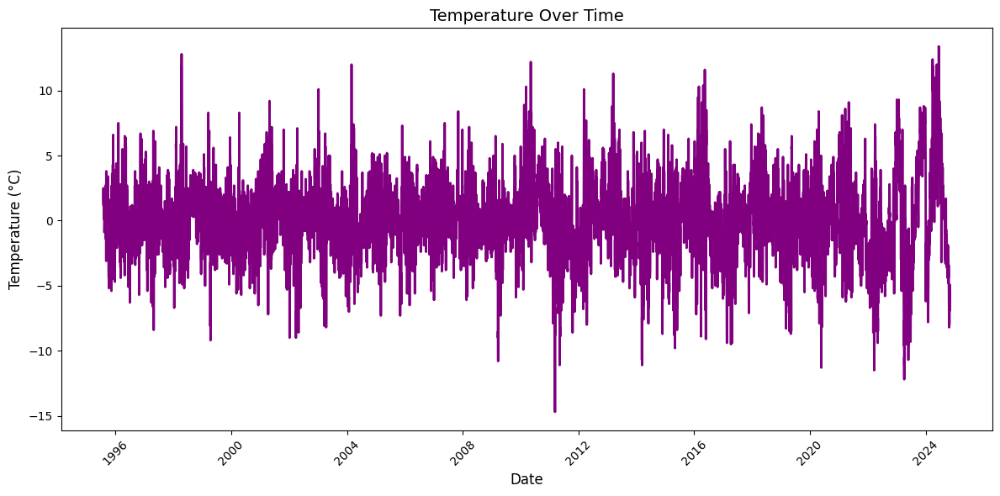

In [25]:
# Plotting the 'temp' values over 'datetime'
plt.figure(figsize=(12, 6))  # Set the figure size

# Plot the temperature ('temp') against the datetime
plt.plot(df['datetime'], df['temp_change'], color='purple', linewidth=2)

# Adding title and labels
plt.title('Temperature Over Time', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()


In [26]:
df['temp_category'].value_counts()

temp_category
normal    7190
high      1986
low       1878
Name: count, dtype: int64

In [27]:
df[(df['temp_change'] <= -2)&(df['temp_category'] == 'low')]
df[df['temp_change'] <= -2]

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,temp_30d_avg,humidity_7d_avg,precip_7d_avg,solarradiation_7d_avg,uvindex_7d_avg,wind_30d_avg,previous_year_temp,temp_change,prev_year_month_temp_std,temp_category
401,"Mansoura, Egypt",1995-09-06,25.9,21.1,23.2,25.9,21.1,23.2,19.7,81.1,...,27.153333,67.728571,0.000000,257.671429,8.285714,18.906667,26.3,-3.1,1.634209,low
427,"Mansoura, Egypt",1995-10-02,27.2,21.1,23.7,28.9,21.1,24.1,17.6,70.3,...,26.130000,71.528571,0.000000,318.157143,9.428571,17.483333,26.7,-3.0,2.014450,low
428,"Mansoura, Egypt",1995-10-03,27.1,21.6,23.8,26.7,21.6,23.7,12.7,50.5,...,26.043333,68.971429,0.000000,287.914286,8.857143,17.233333,26.2,-2.4,2.014450,low
430,"Mansoura, Egypt",1995-10-05,26.1,21.7,23.5,26.1,21.7,23.5,14.7,58.2,...,25.850000,63.742857,0.000000,227.428571,7.714286,16.613333,26.0,-2.5,2.014450,low
431,"Mansoura, Egypt",1995-10-06,25.2,21.6,23.2,25.2,21.6,23.2,15.3,61.3,...,25.850000,63.142857,0.000000,197.185714,7.142857,17.106667,26.0,-2.8,2.014450,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11049,"Mansoura, Egypt",2024-10-31,26.8,14.0,19.9,26.6,14.0,19.9,13.2,69.1,...,23.196667,62.671429,0.000000,198.371429,7.000000,17.166667,25.8,-5.9,2.014450,low
11050,"Mansoura, Egypt",2024-11-01,26.1,14.9,19.9,26.1,14.9,19.9,14.7,74.3,...,23.076667,66.342857,0.057143,185.700000,6.857143,17.036667,26.6,-6.7,2.356186,low
11051,"Mansoura, Egypt",2024-11-02,27.2,14.3,20.2,26.7,14.3,20.2,12.7,67.0,...,22.980000,67.457143,0.057143,183.328571,6.857143,16.890000,27.1,-6.9,2.356186,low
11052,"Mansoura, Egypt",2024-11-03,27.5,14.1,20.7,26.7,14.1,20.6,11.7,61.3,...,22.900000,66.757143,0.057143,180.428571,6.857143,16.723333,26.0,-5.3,2.356186,low


In [28]:
report = validate_weather_data(df)
print_validation_report(report)
df.isna().sum()

=== Weather Data Validation Report ===

Date Range: From 1994-08-01 00:00:00 to 2024-11-04 00:00:00
Total Records: 11054
Expected Records: 11054

=== Duplicates ===
No duplicates found

=== Missing Days ===
No missing days


name                          0
datetime                      0
tempmax                       0
tempmin                       0
temp                          0
feelslikemax                  0
feelslikemin                  0
feelslike                     0
dew                           0
humidity                      0
precip                        0
precipprob                    0
precipcover                   0
windspeed                     0
winddir                       0
sealevelpressure              0
cloudcover                    0
visibility                    0
solarradiation                0
solarenergy                   0
uvindex                       0
sunrise                       0
sunset                        0
moonphase                     0
conditions                    0
Original_Date                 0
new_date                      0
year                          0
month                         0
week_number                   0
day                           0
season  

In [29]:
df.dropna(axis=0, inplace=True)

In [330]:
df.isna().sum()

name                        0
datetime                    0
tempmax                     0
tempmin                     0
temp                        0
feelslikemax                0
feelslikemin                0
feelslike                   0
dew                         0
humidity                    0
precip                      0
precipprob                  0
precipcover                 0
windspeed                   0
winddir                     0
sealevelpressure            0
cloudcover                  0
visibility                  0
solarradiation              0
solarenergy                 0
uvindex                     0
sunrise                     0
sunset                      0
moonphase                   0
conditions                  0
Original_Date               0
new_date                    0
year                        0
month                       0
week_number                 0
day                         0
season                      0
temp_range                  0
temp_7d_av

In [30]:
df['datetime'].min(),df['datetime'].max()

(Timestamp('1995-08-01 00:00:00'), Timestamp('2024-11-04 00:00:00'))

In [332]:
df.tail()

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,season,temp_range,temp_7d_avg,temp_30d_avg,humidity_7d_avg,wind_30d_avg,previous_year_temp,temp_change,prev_year_month_temp_std,temp_category
11049,"Mansoura, Egypt",2024-10-31,26.8,14.0,19.9,26.6,14.0,19.9,13.2,69.1,...,Fall,12.8,21.428571,23.196667,62.671429,17.166667,25.8,-5.9,2.014450,low
11050,"Mansoura, Egypt",2024-11-01,26.1,14.9,19.9,26.1,14.9,19.9,14.7,74.3,...,Fall,11.2,21.185714,23.076667,66.342857,17.036667,26.6,-6.7,2.356186,low
11051,"Mansoura, Egypt",2024-11-02,27.2,14.3,20.2,26.7,14.3,20.2,12.7,67.0,...,Fall,12.9,20.971429,22.980000,67.457143,16.890000,27.1,-6.9,2.356186,low
11052,"Mansoura, Egypt",2024-11-03,27.5,14.1,20.7,26.7,14.1,20.6,11.7,61.3,...,Fall,13.4,20.742857,22.900000,66.757143,16.723333,26.0,-5.3,2.356186,low
11053,"Mansoura, Egypt",2024-11-04,26.2,15.6,20.4,26.2,15.6,20.4,14.4,70.1,...,Fall,10.6,20.442857,22.803333,67.300000,16.653333,26.2,-5.8,2.356186,low


In [31]:
report = validate_weather_data(df)
print_validation_report(report)

=== Weather Data Validation Report ===

Date Range: From 1995-08-01 00:00:00 to 2024-11-04 00:00:00
Total Records: 10689
Expected Records: 10689

=== Duplicates ===
No duplicates found

=== Missing Days ===
No missing days


In [33]:
df = df.sort_values('datetime')
df = df.set_index('datetime')
# Check for missing values
missing_summary = df.isnull().sum()
columns_description = df.describe().T
print(f'missing_summary :\n {missing_summary}')
# print(f'columns_description :\n {columns_description}')
df.info()
df.describe().T

KeyError: "None of ['datetime'] are in the columns"

## **Exploratory Data Analysis (EDA)**

### Step 1: Dataset Overview
**Objective**:
- Gain a comprehensive understanding of the dataset’s structure, quality, and relationships.

**Actions**:
1. Summarize data with descriptive statistics (mean, median, std, min, max, etc.).
2. Visualize missing values and detect duplicates.
3. Generate a correlation heatmap for numerical columns.
4. Explore initial relationships between categorical and numerical columns.

**Key Visualizations**:
- Correlation heatmap.
- Pair plot to explore initial dependencies.
- Summary statistics table with highlighted insights.

---

In [34]:
# Generate descriptive statistics
summary_stats = df.describe(include="all").T
print(summary_stats)

# Check for missing values
missing_values = df.isnull().sum() / len(df) * 100  # Percentage of missing values
print("Missing Values (%):\n", missing_values)

# Check for duplicate records
duplicate_count = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")

                            count unique              top   freq  \
name                        10689      1  Mansoura, Egypt  10689   
tempmax                   10689.0    NaN              NaN    NaN   
tempmin                   10689.0    NaN              NaN    NaN   
temp                      10689.0    NaN              NaN    NaN   
feelslikemax              10689.0    NaN              NaN    NaN   
feelslikemin              10689.0    NaN              NaN    NaN   
feelslike                 10689.0    NaN              NaN    NaN   
dew                       10689.0    NaN              NaN    NaN   
humidity                  10689.0    NaN              NaN    NaN   
precip                    10689.0    NaN              NaN    NaN   
precipprob                10689.0    NaN              NaN    NaN   
precipcover               10689.0    NaN              NaN    NaN   
windspeed                 10689.0    NaN              NaN    NaN   
winddir                   10689.0    NaN        

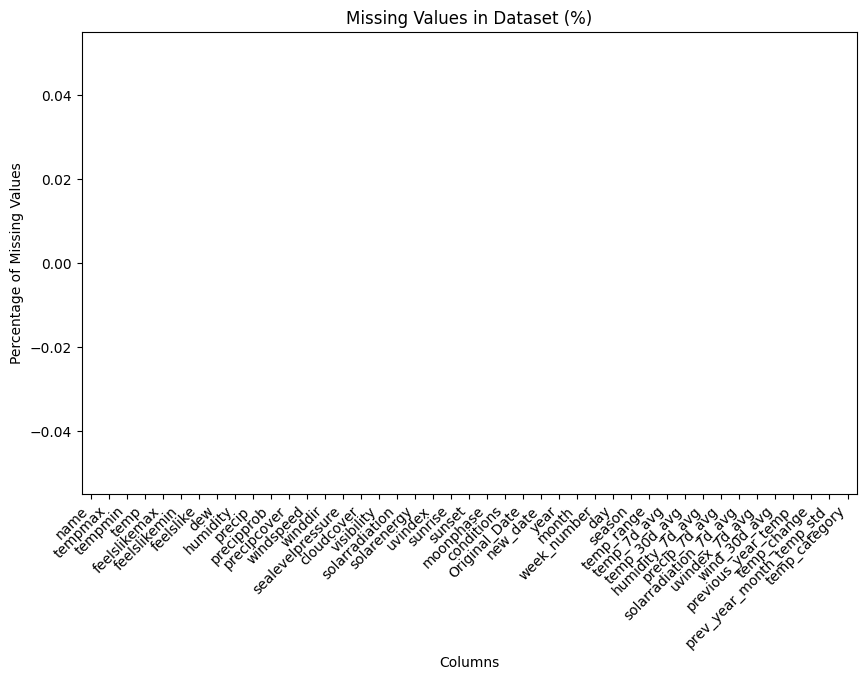

In [35]:
# Plot Missing Values
plt.figure(figsize=(10, 6))
sns.barplot(x=missing_values.index, y=missing_values.values)
plt.xticks(rotation=45, ha="right")
plt.title("Missing Values in Dataset (%)")
plt.ylabel("Percentage of Missing Values")
plt.xlabel("Columns")
plt.show()

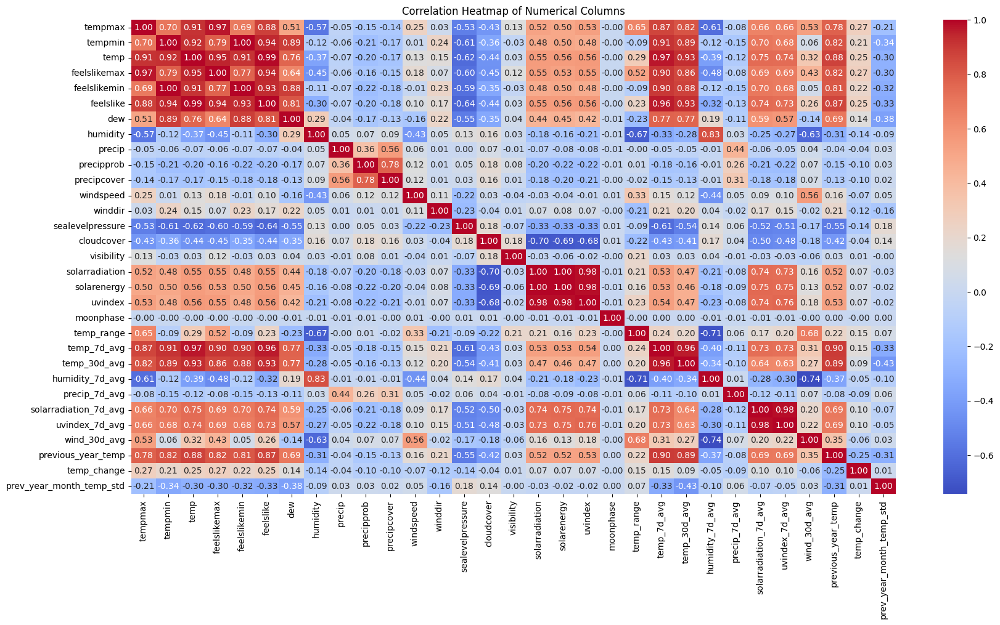

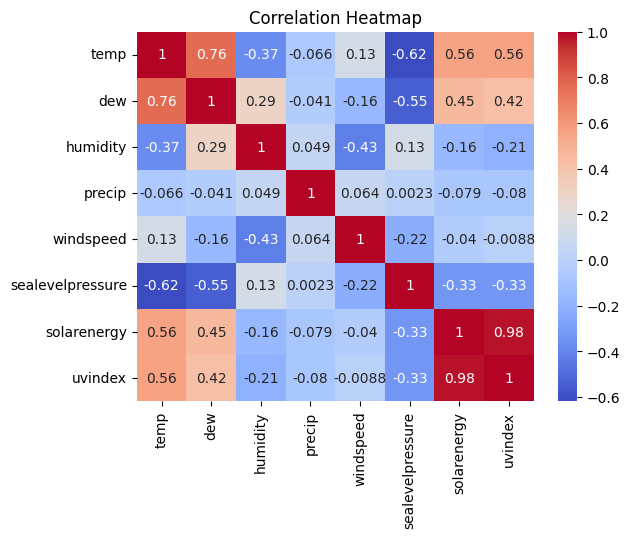

In [36]:
# Select only numerical columns for correlation analysis
numerical_columns = df.select_dtypes(include=["float64", "int64"]).columns

# Compute correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Plot the Correlation Heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap of Numerical Columns")
plt.show()

# Correlation analysis
correlation = df[[ 'temp','dew','humidity', 'precip', 'windspeed', 'sealevelpressure','solarenergy','uvindex']].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

<Figure size 640x480 with 0 Axes>

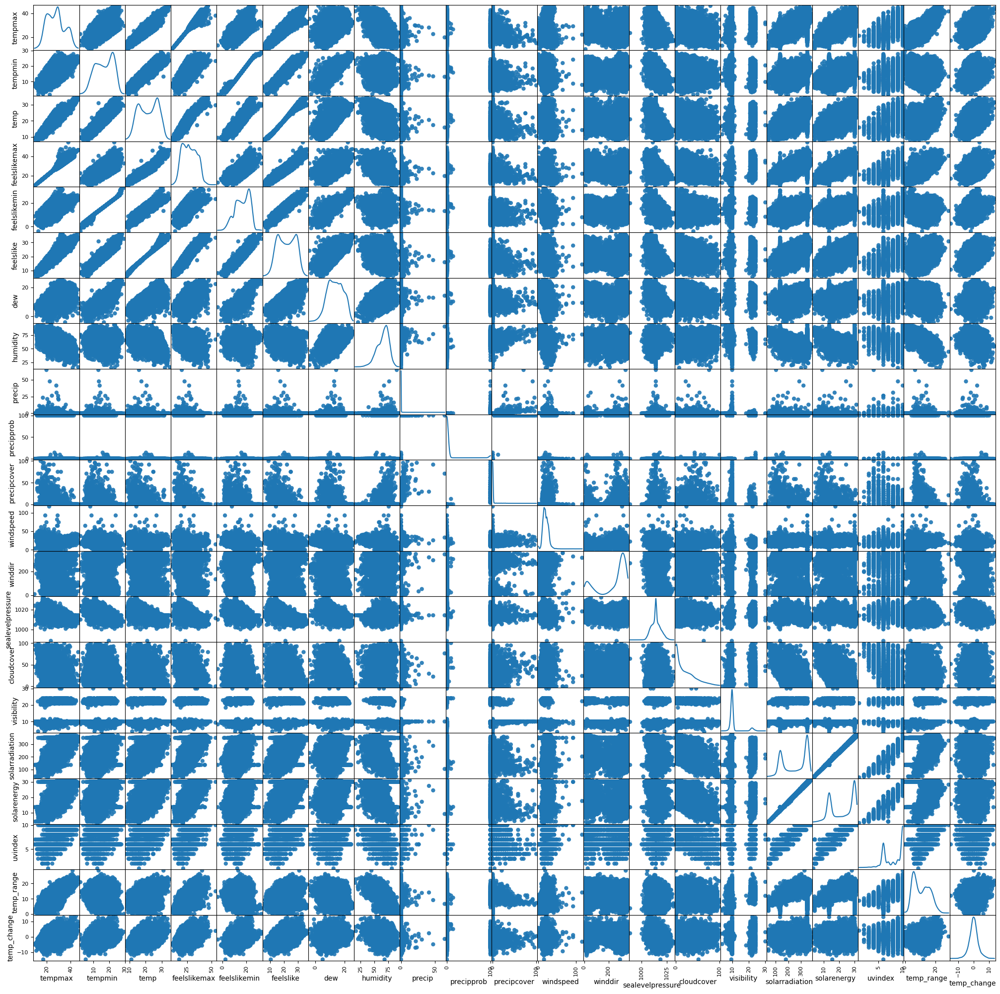

In [37]:
columns= [ 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'precipcover', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover',
       'visibility', 'solarradiation', 'solarenergy', 'uvindex',
        'temp_range', 'temp_change']
#display scatter_matrix also
fig = plt.figure()
pd.plotting.scatter_matrix(df[columns],figsize =(25,25),alpha=0.9,diagonal="kde",marker="o");
# plt.savefig('scatter-matrix.png')

In [38]:
def plot_trends_with_temporal_features(df, groupings, column, plot_type='bar'):
    """
    Plot trends for a specified column based on temporal groupings.

    Parameters:
    df (DataFrame): The dataset containing temporal columns and the target column.
    groupings (dict): A dictionary where keys are grouping labels (e.g., 'Yearly Trends') 
                      and values are temporal columns (e.g., 'year', 'season').
    column (str): The column to analyze and plot (e.g., 'temp', 'humidity').
    plot_type (str): The type of plot to create ('bar' or 'line'). Default is 'bar'.
    """
    plt.figure(figsize=(16, len(groupings) * 4))  # Dynamic figure size based on the number of groupings

    for i, (title, group_col) in enumerate(groupings.items(), 1):
        # Calculate averages for the grouping
        averages = df.groupby(group_col)[column].mean()

        # Create subplot for each grouping
        plt.subplot(len(groupings), 1, i)
        
        if plot_type == 'bar':
            averages.plot(kind='bar', color='purple', alpha=0.7)
        elif plot_type == 'line':
            averages.plot(kind='line', marker='o', color='purple', alpha=0.7)

        plt.title(f'Average {column.capitalize()} by {title}')
        plt.xlabel(title)
        plt.ylabel(f'{column.capitalize()}')

        # Customize x-ticks for specific groupings
        if group_col == 'season':
            plt.xticks(ticks=[0, 1, 2, 3], labels=['Winter', 'Spring', 'Summer', 'Fall'], rotation=0)
        elif group_col in ['day_of_week', 'week_number']:
            plt.xticks(rotation=45)
        else:
            plt.xticks(rotation=0)

    plt.tight_layout()
    plt.show()



### Step 2: Grouped Analysis of Columns
This step focuses on analyzing **groups of related columns**, extracting insights for each group, and linking them to objectives.

---


### Group 1: Temperature-Related Columns
**Columns**: `tempmax`, `tempmin`, `temp`, `feelslikemax`, `feelslikemin`, `feelslike`

#### Actions:
1. **Univariate Analysis**:
   - Analyze distributions and detect outliers using histograms and box plots.
   - Calculate rolling averages (7-day, 30-day) to observe trends.
   - Decompose temperature data into trend, seasonality, and residuals.
2. **Bivariate Analysis**:
   - Compare temperature columns (e.g., `temp` vs. `feelslike`).
   - Explore relationships with humidity, precipitation, and wind.
3. **Time-Series Analysis**:
   - Identify seasonal temperature trends (e.g., summer vs. winter).
   - Highlight extreme temperature days for farmers and the energy sector.

**Key Visualizations**:
- Box plots for `tempmax`, `tempmin`, and `feelslikemax`.
- Rolling averages and seasonal decomposition plots.
- Scatter plots of `temp` vs. `humidity`.

---


count    10689.000000
mean        21.663383
std          5.739164
min          8.000000
25%         16.500000
50%         21.900000
75%         26.800000
max         34.900000
Name: temp, dtype: float64


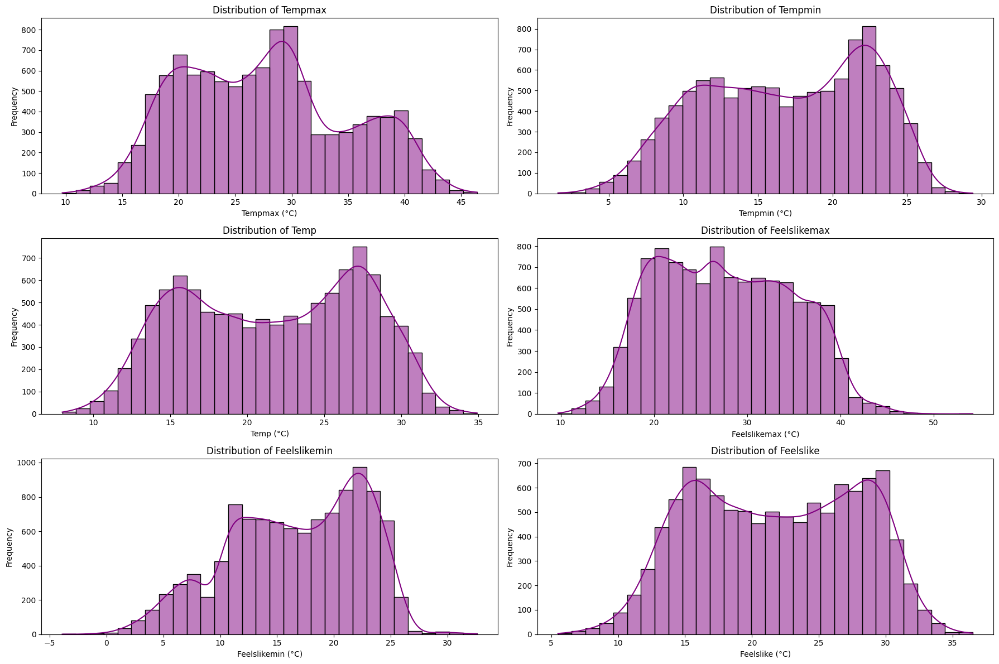

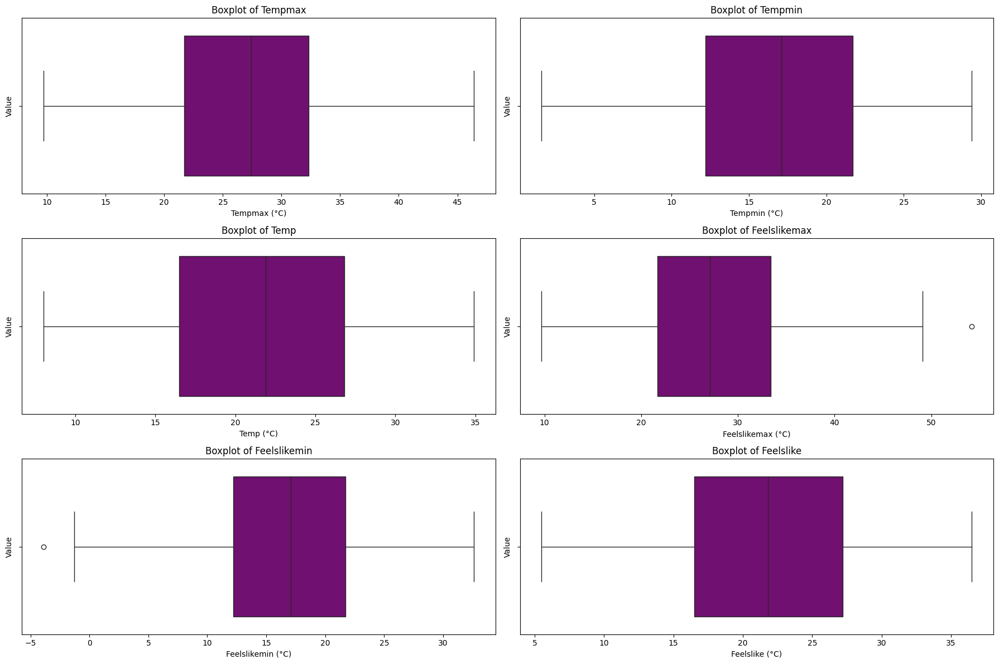

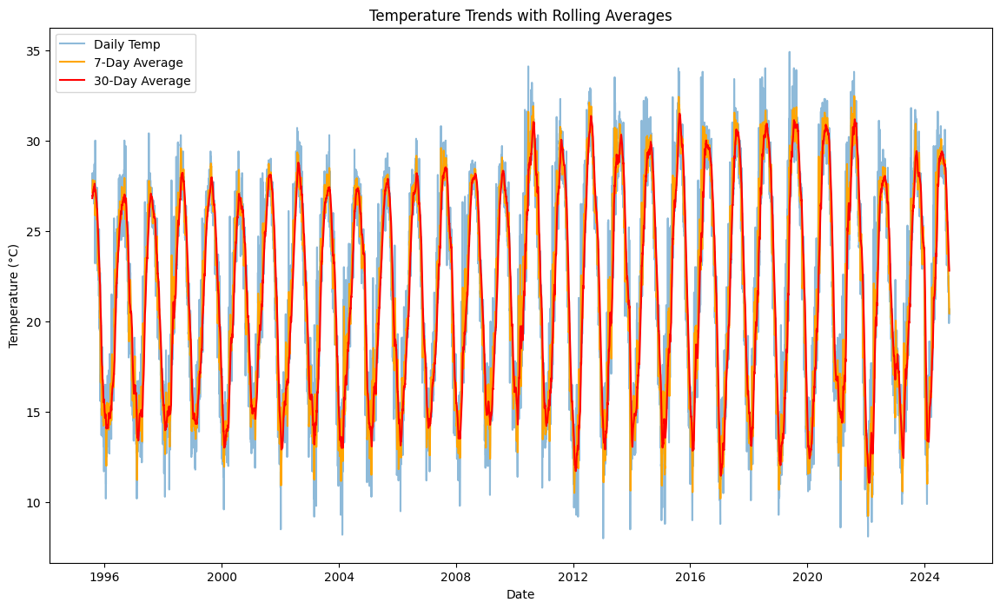

In [39]:
# Descriptive statistics
temperature_stats = df['temp'].describe()
print(temperature_stats)

# Define the temperature columns
temperature_columns = ['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike']

# Create subplots for temperature histograms
plt.figure(figsize=(18, 12))  # Adjust the figure size based on the number of columns

# Loop through the temperature columns and create a histogram for each
for i, col in enumerate(temperature_columns, 1):
    plt.subplot(3, 2, i)  # Arrange in a 3x2 grid (adjust rows/columns as needed)
    sns.histplot(data=df, x=col, kde=True, bins=30, color='purple')
    plt.title(f'Distribution of {col.capitalize()}')
    plt.xlabel(f'{col.capitalize()} (°C)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Create subplots for temperature boxplots
plt.figure(figsize=(18, 12))  # Adjust the figure size based on the number of columns

# Loop through the temperature columns and create a boxplot for each
for i, col in enumerate(temperature_columns, 1):
    plt.subplot(3, 2, i)  # Arrange in a 3x2 grid (adjust rows/columns as needed)
    sns.boxplot(data=df, x=col, color='purple')
    plt.title(f'Boxplot of {col.capitalize()}')
    plt.xlabel(f'{col.capitalize()} (°C)')
    plt.ylabel('Value')

plt.tight_layout()
plt.show()



# Plot Rolling Averages
plt.figure(figsize=(14, 8))
plt.plot(df.index, df['temp'], label='Daily Temp', alpha=0.5)
plt.plot(df.index, df['temp_7d_avg'], label='7-Day Average', color='orange')
plt.plot(df.index, df['temp_30d_avg'], label='30-Day Average', color='red')
plt.legend()
plt.title('Temperature Trends with Rolling Averages')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.show()

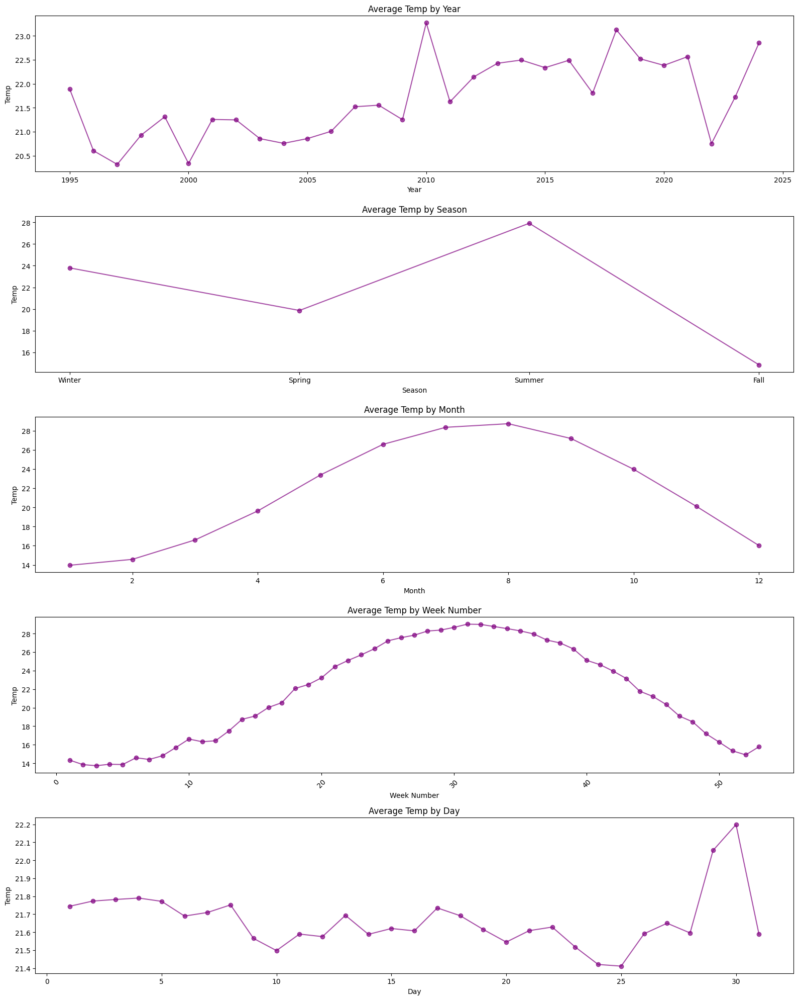

In [40]:
# Define groupings based on the new temporal features
groupings = {
    'Year': 'year',
    'Season': 'season',
    'Month': 'month',
    'Week Number': 'week_number',
    'Day':'day'
}

# Call the function for temperature
plot_trends_with_temporal_features(df, groupings, 'temp',plot_type='line')

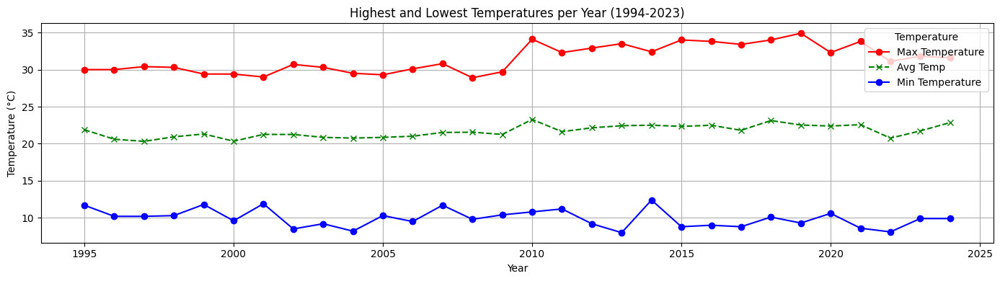

In [41]:
yearly_temp = df.groupby('year')['temp'].agg(['max', 'min', 'mean'])

plt.figure(figsize=(14, 4))

plt.plot(yearly_temp.index, yearly_temp['max'], label='Max Temperature', color='red', marker='o')
plt.plot(yearly_temp.index, yearly_temp['mean'],label='Avg Temp', color='green', linestyle='--', marker='x')
plt.plot(yearly_temp.index, yearly_temp['min'], label='Min Temperature', color='blue', marker='o')

plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.title('Highest and Lowest Temperatures per Year (1994-2023)')
plt.legend(title='Temperature')
plt.grid(True)

plt.tight_layout()
plt.show()

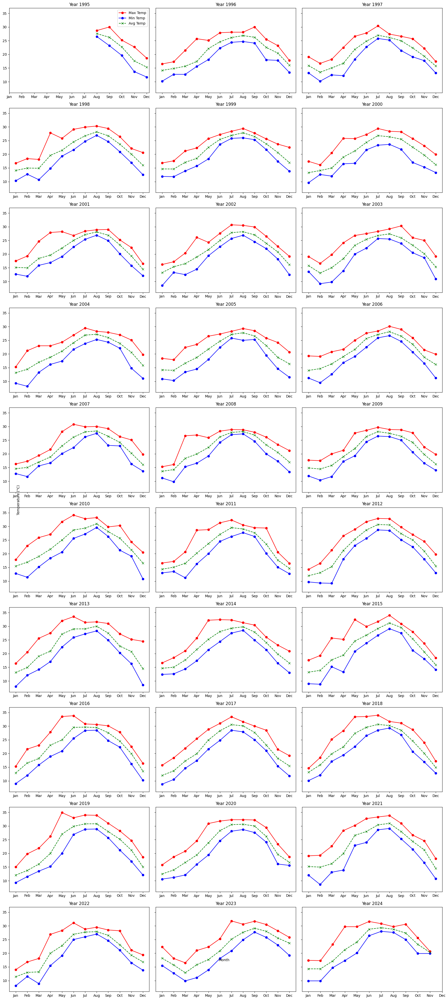

In [42]:
# Get the list of unique years
years = df['year'].unique()

# Calculate the number of rows and columns in the grid
cols = 3  # You can adjust this number based on the available space
rows = int(np.ceil(len(years) / cols))

# Calculate the global minimum, maximum, and average temperatures across all data to fix the Y-axis
global_min_temp = df['temp'].min()
global_max_temp = df['temp'].max()

# Set up the figure to display the grid
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 4), sharey=True)

# Ensure axes is a flattened array even for grids with a single row or column
axes = axes.flatten()

# Plot for each year
for i, year in enumerate(years):
    # Calculate max, min, and mean temperatures for each month in the selected year
    yearly_temp = df[df['year'] == year].groupby('month')['temp'].agg(['max', 'min', 'mean'])

    # Plot the maximum temperatures for each month
    axes[i].plot(yearly_temp.index, yearly_temp['max'], label='Max Temp', color='red', marker='o')

    # Plot the minimum temperatures for each month
    axes[i].plot(yearly_temp.index, yearly_temp['min'], label='Min Temp', color='blue', marker='o')

    # Plot the average temperatures for each month
    axes[i].plot(yearly_temp.index, yearly_temp['mean'], label='Avg Temp', color='green', linestyle='--', marker='x')

    # Add details to each plot
    axes[i].set_title(f'Year {year}')
    axes[i].set_xticks(range(1, 13))
    axes[i].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    axes[i].set_ylim(global_min_temp - 2, global_max_temp + 2)  # Fix the Y-axis for temperature

# Add legend to the first plot only
axes[0].legend(loc='upper right')

# Remove unused subplots if the grid is larger than the number of years
for j in range(len(years), len(axes)):
    fig.delaxes(axes[j])

# Add a label for the X-axis
fig.text(0.5, 0.04, 'Month', ha='center')

# Add a label for the Y-axis
fig.text(0.04, 0.5, 'Temperature (°C)', va='center', rotation='vertical')

# Improve layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()


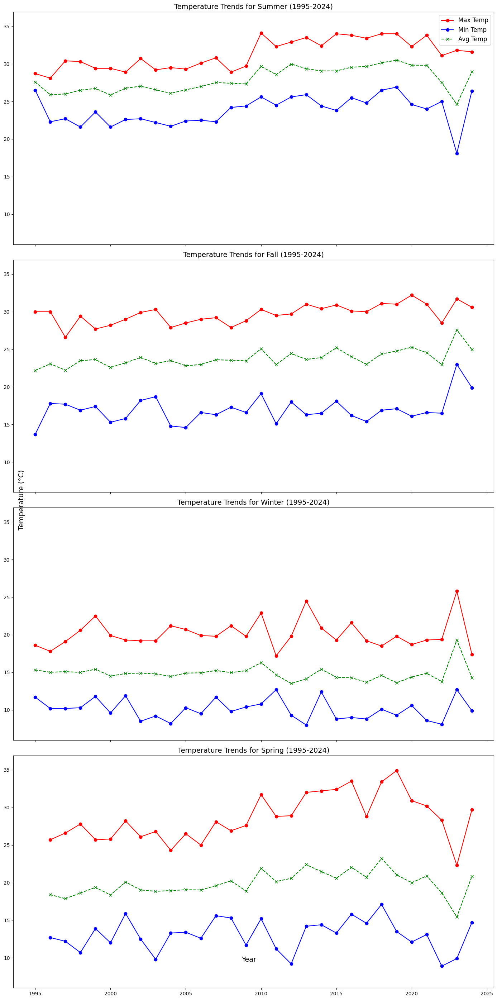

In [43]:
# Filter data for the years 2009 to 2023
filtered_df = df[(df['year'] >= 1994) & (df['year'] <= 2024)]

# Get unique seasons
seasons = filtered_df['season'].unique()

# Create a figure with subplots for each season
fig, axes = plt.subplots(len(seasons), 1, figsize=(14, 28), sharex=True, sharey=True)

# Get global temperature ranges for consistent y-axis scaling
global_min_temp = filtered_df['temp'].min()
global_max_temp = filtered_df['temp'].max()

# Plot temperature trends for each season
for i, season in enumerate(seasons):
    # Filter and aggregate data for the current season
    seasonal_data = (
        filtered_df[filtered_df['season'] == season]
        .groupby('year')['temp']
        .agg(['max', 'min', 'mean'])
    )
    
    # Plot max, min, and average temperatures
    axes[i].plot(
        seasonal_data.index, 
        seasonal_data['max'], 
        label='Max Temp', 
        color='red', 
        marker='o'
    )
    axes[i].plot(
        seasonal_data.index, 
        seasonal_data['min'], 
        label='Min Temp', 
        color='blue', 
        marker='o'
    )
    axes[i].plot(
        seasonal_data.index, 
        seasonal_data['mean'], 
        label='Avg Temp', 
        color='green', 
        linestyle='--', 
        marker='x'
    )
    
    # Set title for each subplot
    axes[i].set_title(f'Temperature Trends for {season} (1995-2024)', fontsize=14)
    
    # Set consistent y-axis limits for all subplots
    axes[i].set_ylim(global_min_temp - 2, global_max_temp + 2)
    
    # Add legend only for the first subplot
    if i == 0:
        axes[i].legend(loc='upper right', fontsize=12)

# Add shared x-axis and y-axis labels
fig.text(0.5, 0.04, 'Year', ha='center', fontsize=14)
fig.text(0.04, 0.5, 'Temperature (°C)', va='center', rotation='vertical', fontsize=14)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

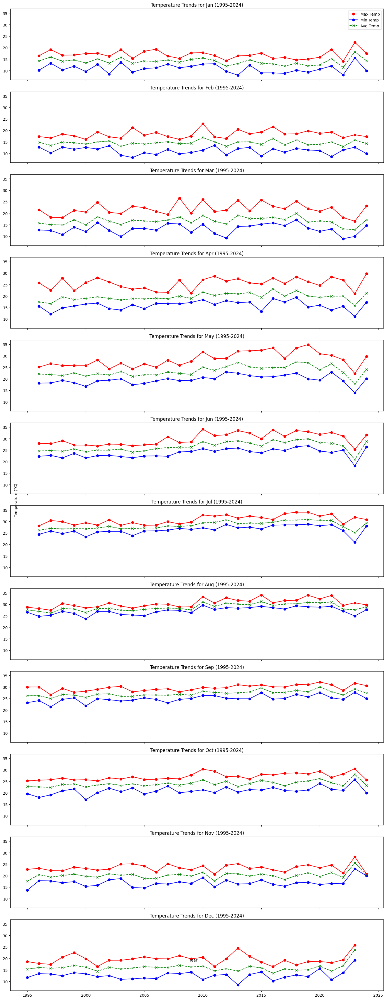

In [44]:
filtered_df = df[(df['year'] >= 1994) & (df['year'] <= 2024)]


months = range(1, 13)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

fig, axes = plt.subplots(12, 1, figsize=(14, 36), sharex=True, sharey=True)

global_min_temp = filtered_df['temp'].min()
global_max_temp = filtered_df['temp'].max()

for i, month in enumerate(months):
    monthly_data = filtered_df[filtered_df['month'] == month].groupby('year')['temp'].agg(['max', 'min', 'mean'])
    
    axes[i].plot(monthly_data.index, monthly_data['max'], label='Max Temp', color='red', marker='o')
    axes[i].plot(monthly_data.index, monthly_data['min'], label='Min Temp', color='blue', marker='o')
    axes[i].plot(monthly_data.index, monthly_data['mean'], label='Avg Temp', color='green', linestyle='--', marker='x')
    
    axes[i].set_title(f'Temperature Trends for {month_names[month - 1]} (1995-2024)')
    axes[i].set_ylim(global_min_temp - 2, global_max_temp + 2)
    
    if i == 0:
        axes[i].legend(loc='upper right')


fig.text(0.5, 0.04, 'Year', ha='center')
fig.text(0.04, 0.5, 'Temperature (°C)', va='center', rotation='vertical')

plt.tight_layout()
plt.show()

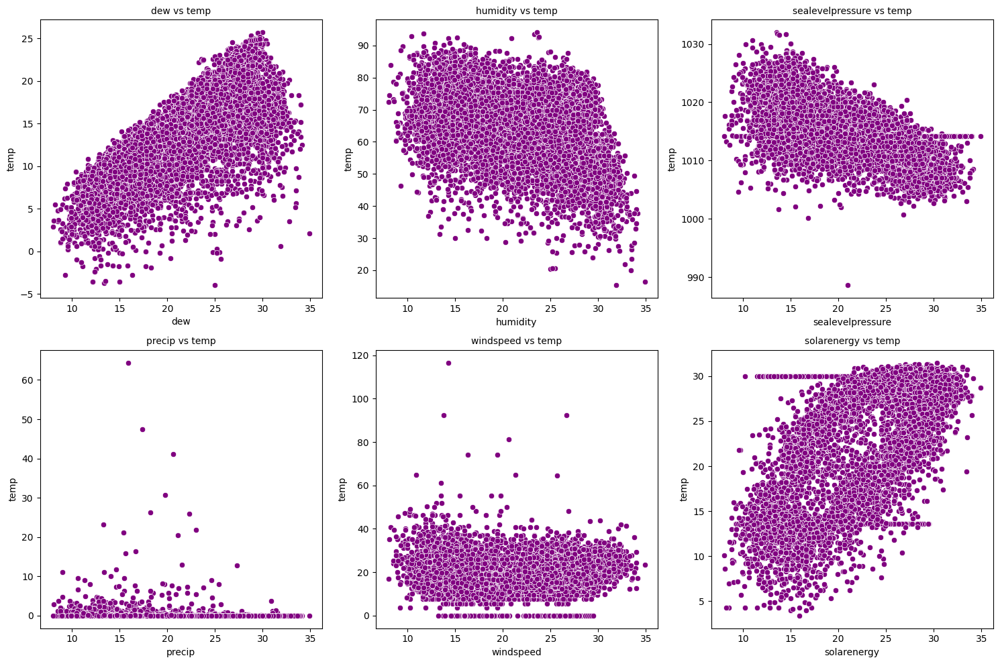

In [45]:
import math

# Define the columns
df_columns1 = ['temp']
df_columns2 = ['dew', 'humidity', 'sealevelpressure', 'precip','windspeed', 'solarenergy']

# Number of subplots per row
plots_per_row = 3

# Calculate total number of subplots
total_plots = len(df_columns1) * len(df_columns2)

# Calculate the number of rows needed
n_rows = math.ceil(total_plots / plots_per_row)

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, plots_per_row, figsize=(15, 5 * n_rows))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Generate scatter plots for each combination of columns
plot_idx = 0
for b in df_columns1:
    for c in df_columns2:
        # Create the scatter plot in the current subplot
        sns.scatterplot(ax=axes[plot_idx], x=b, y=c, data=df, color='purple')
        
        # Add a title and labels
        axes[plot_idx].set_title(f'{c} vs {b}', fontsize=10)
        axes[plot_idx].set_xlabel(c)
        axes[plot_idx].set_ylabel(b)
        
        # Move to the next subplot
        plot_idx += 1

# Hide unused subplots if total_plots < rows * columns
for i in range(plot_idx, len(axes)):
    axes[i].axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the figure
plt.show()

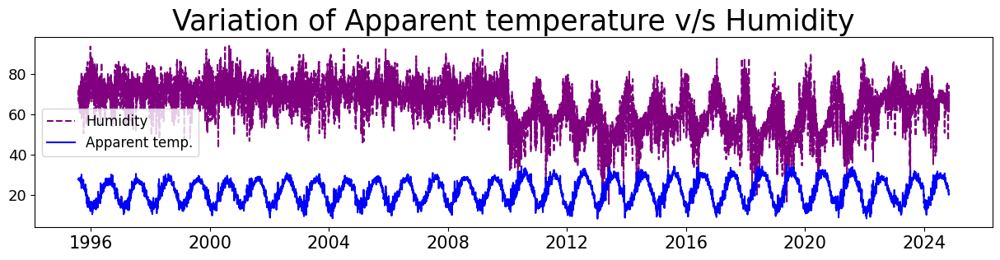

In [46]:
plt.figure(figsize=(15,3));
plt.plot(df['humidity'], label = 'Humidity', color='purple',linestyle='dashed');
plt.plot(df['temp'], label = 'Apparent temp.', color  = 'blue');
plt.title('Variation of Apparent temperature v/s Humidity', fontsize = 25);
plt.legend(loc=0, fontsize =12);
plt.xticks(fontsize = 15);
plt.yticks(fontsize=13);
# plt.savefig('Variation of Apparent temperature VS Humidity.png');

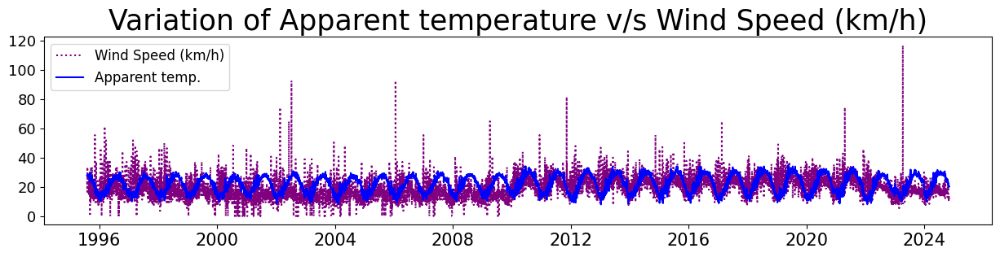

In [47]:
plt.figure(figsize=(15,3));
plt.plot(df['windspeed'], label = 'Wind Speed (km/h)', color='purple',linestyle='dotted');
plt.plot(df['temp'], label = 'Apparent temp.', color  = 'blue');
plt.title('Variation of Apparent temperature v/s Wind Speed (km/h)', fontsize = 25);
plt.legend(loc=0, fontsize =12);
plt.xticks(fontsize = 15);
plt.yticks(fontsize=13);
# plt.savefig('Variation of Apparent temperature VS Wind Speed (km Per h).png')

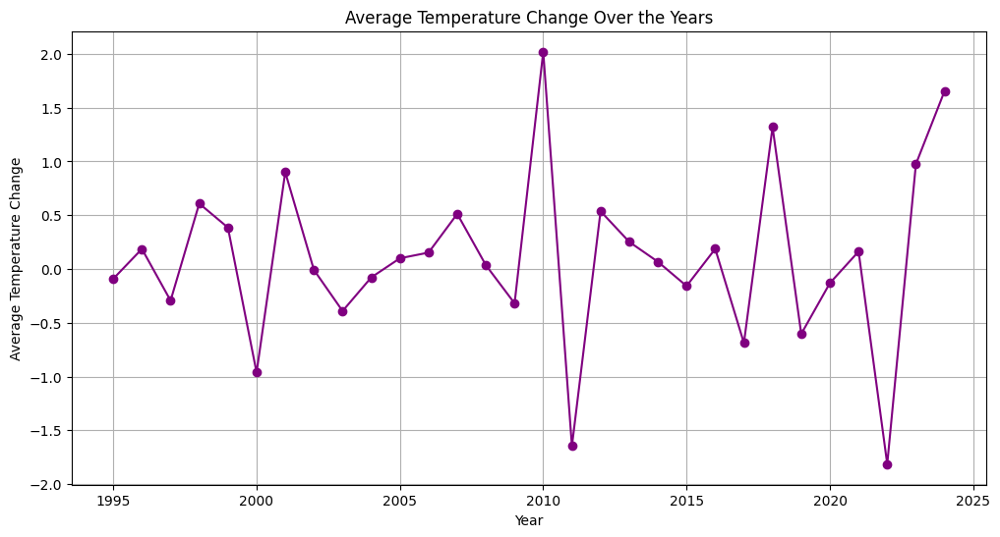

In [48]:
# Group data by year and calculate mean temperature change for each year
yearly_temp_change = df.groupby("year")["temp_change"].mean()

# Plotting the temperature change over years
plt.figure(figsize=(12, 6))
plt.plot(yearly_temp_change.index, yearly_temp_change.values, marker='o', color='purple')
plt.xlabel("Year")
plt.ylabel("Average Temperature Change")
plt.title("Average Temperature Change Over the Years")
plt.grid(True)
plt.show()


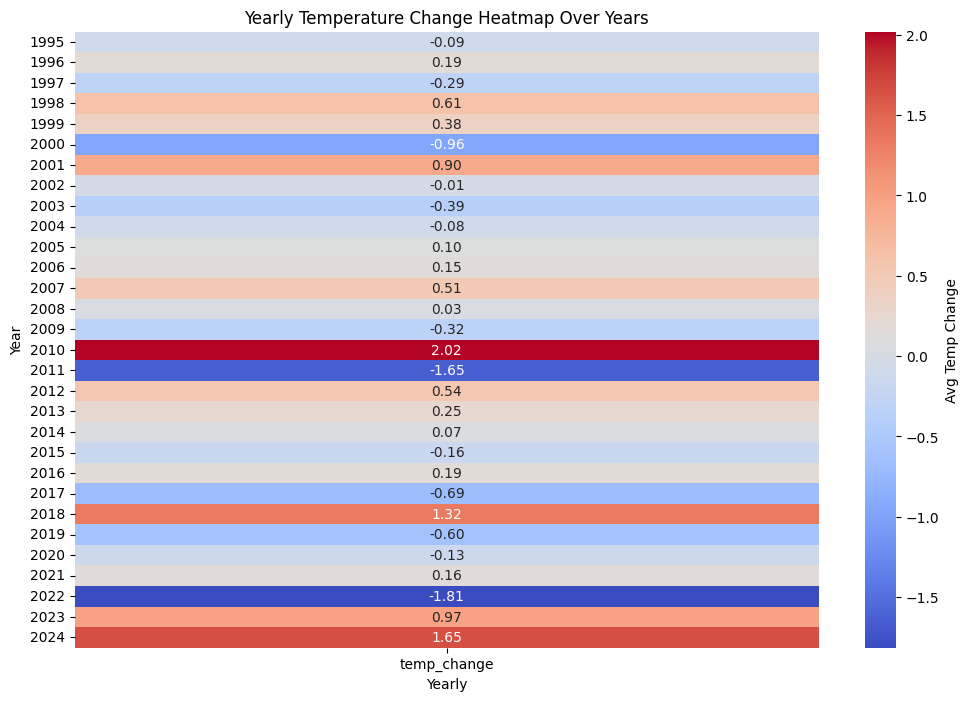

In [49]:
# Create a pivot table for heatmap with years as rows and months as columns
heatmap_data = df.pivot_table(values="temp_change", index="year", aggfunc="mean")

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Avg Temp Change'})
plt.title("Yearly Temperature Change Heatmap Over Years")
plt.xlabel("Yearly")
plt.ylabel("Year")
plt.show()

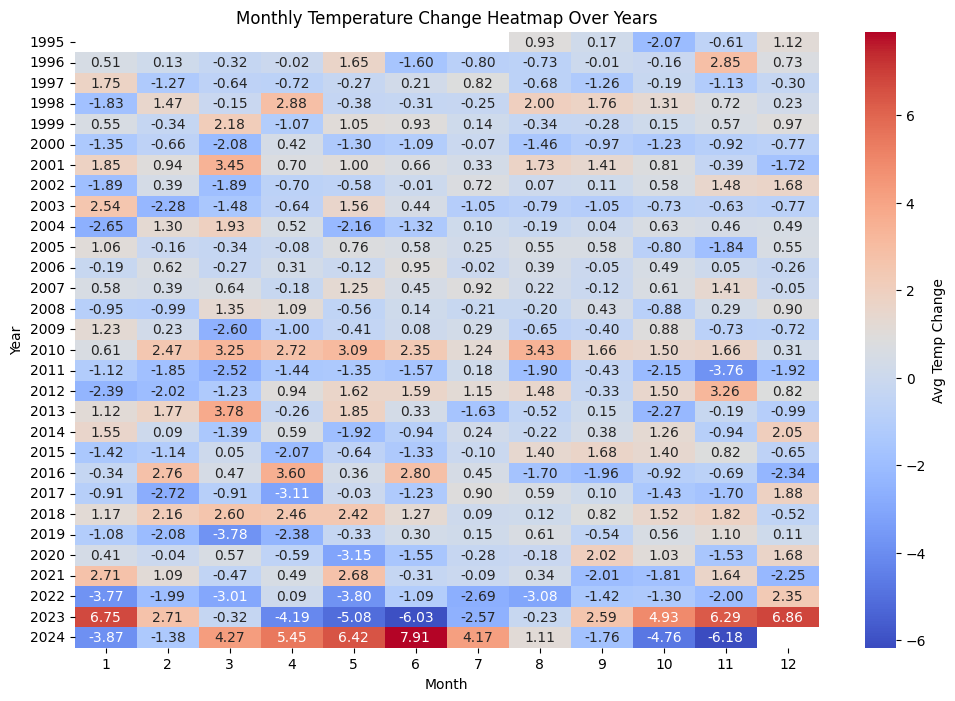

In [50]:
# Create a pivot table for heatmap with years as rows and months as columns
heatmap_data = df.pivot_table(values="temp_change", index="year", columns="month", aggfunc="mean")

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Avg Temp Change'})
plt.title("Monthly Temperature Change Heatmap Over Years")
plt.xlabel("Month")
plt.ylabel("Year")
plt.show()

### Group 2: Humidity and Precipitation-Related Columns
**Columns**: `dew`, `humidity`, `precip`, `precipprob`, `precipcover`, `preciptype`

#### Actions:
1. **Univariate Analysis**:
   - Explore the distribution of humidity and precipitation-related variables.
   - Identify periods with high/low precipitation.
2. **Bivariate Analysis**:
   - Analyze `humidity` vs. `dew` (dew point indicates comfort levels).
   - Explore precipitation coverage by precipitation type.
3. **Time-Series Analysis**:
   - Track humidity and precipitation trends over time.
   - Identify droughts and storms using `precipprob` and `precipcover`.

**Key Visualizations**:
- Bar plots of precipitation type frequencies.
- Line plots for humidity and precipitation trends.
- Box plots for `humidity` by `preciptype`.

---


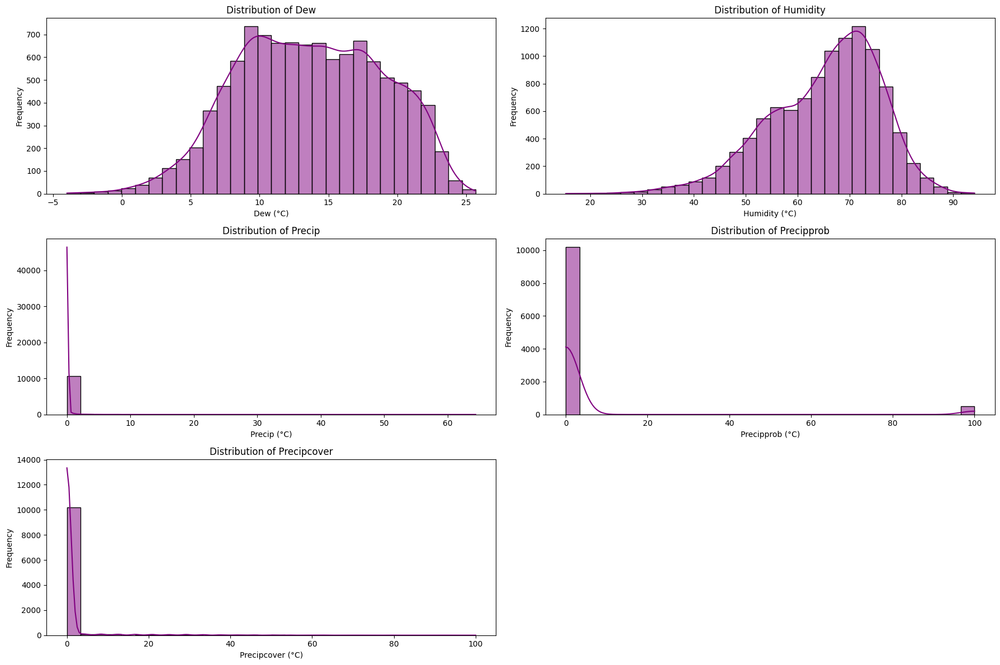

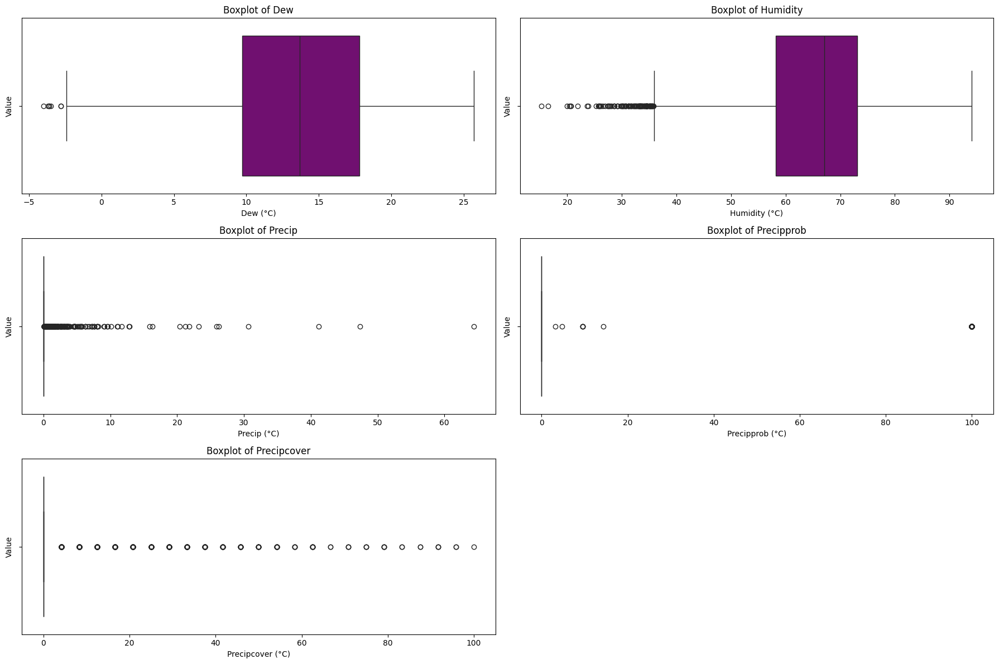

In [51]:
# List of humidity and precipitation-related columns
humidity_precip_columns = ['dew', 'humidity', 'precip', 'precipprob', 'precipcover']

plt.figure(figsize=(18, 12))  # Adjust the figure size based on the number of columns

# Loop through the humidity columns and create a histogram for each
for i, col in enumerate(humidity_precip_columns, 1):
    plt.subplot(3, 2, i)  # Arrange in a 3x2 grid (adjust rows/columns as needed)
    sns.histplot(data=df, x=col, kde=True, bins=30, color='purple')
    plt.title(f'Distribution of {col.capitalize()}')
    plt.xlabel(f'{col.capitalize()} (°C)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Create subplots for # Loop through the humidity columns and create a histogram for each
plt.figure(figsize=(18, 12))  # Adjust the figure size based on the number of columns

# Loop through the humidity columns and create a boxplot for each
for i, col in enumerate(humidity_precip_columns, 1):
    plt.subplot(3, 2, i)  # Arrange in a 3x2 grid (adjust rows/columns as needed)
    sns.boxplot(data=df, x=col, color='purple')
    plt.title(f'Boxplot of {col.capitalize()}')
    plt.xlabel(f'{col.capitalize()} (°C)')
    plt.ylabel('Value')

plt.tight_layout()
plt.show()



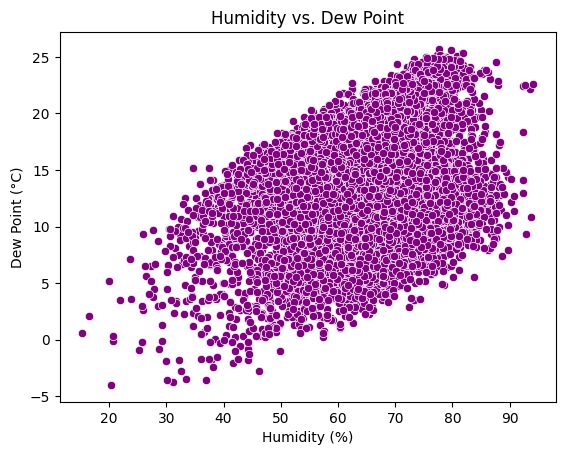

In [52]:
# Scatter plot: Humidity vs. Dew Point
sns.scatterplot(x=df['humidity'], y=df['dew'], color='purple')
plt.title('Humidity vs. Dew Point')
plt.xlabel('Humidity (%)')
plt.ylabel('Dew Point (°C)')
plt.show()



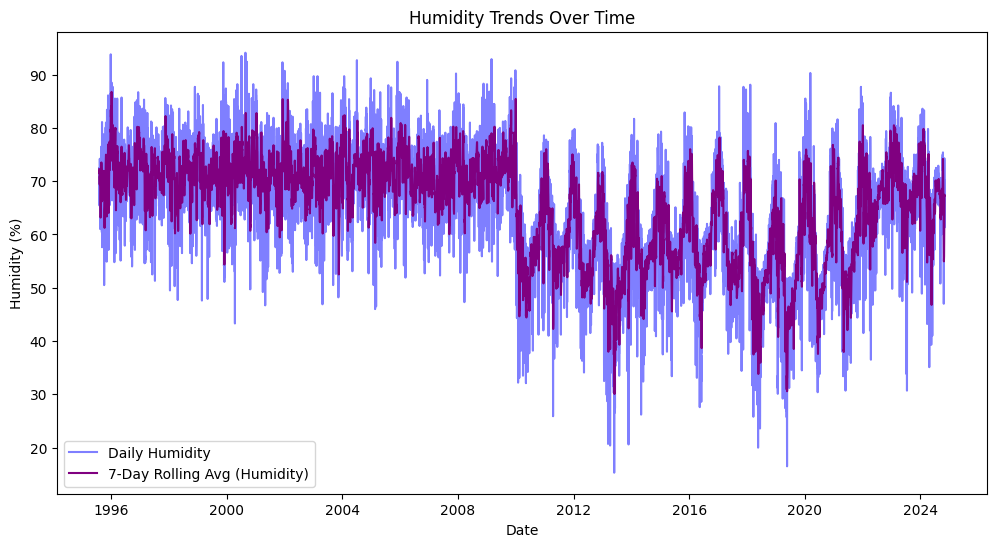

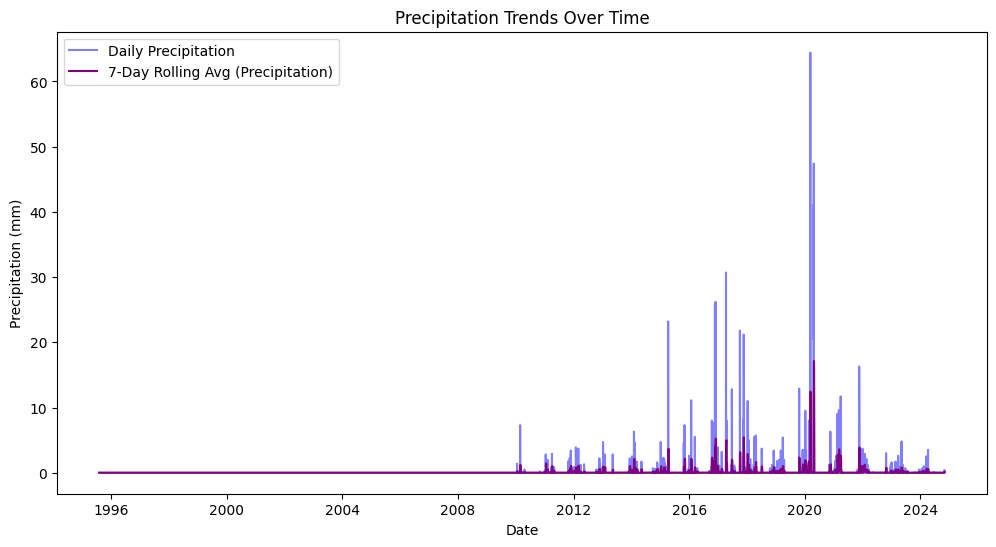

In [53]:


# Line plots for humidity and precipitation trends
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['humidity'], label='Daily Humidity', alpha=0.5, color='blue')
plt.plot(df.index, df['humidity_7d_avg'], label='7-Day Rolling Avg (Humidity)', color='purple')
plt.legend()
plt.title('Humidity Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Humidity (%)')
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(df.index, df['precip'], label='Daily Precipitation', alpha=0.5, color='blue')
plt.plot(df.index, df['precip_7d_avg'], label='7-Day Rolling Avg (Precipitation)', color='purple')
plt.legend()
plt.title('Precipitation Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Precipitation (mm)')
plt.show()

# Identify drought and storm periods
high_precipprob = df[df['precipprob'] > 80]  # Example threshold for storms
low_precipcover = df[df['precipcover'] < 10]  # Example threshold for droughts


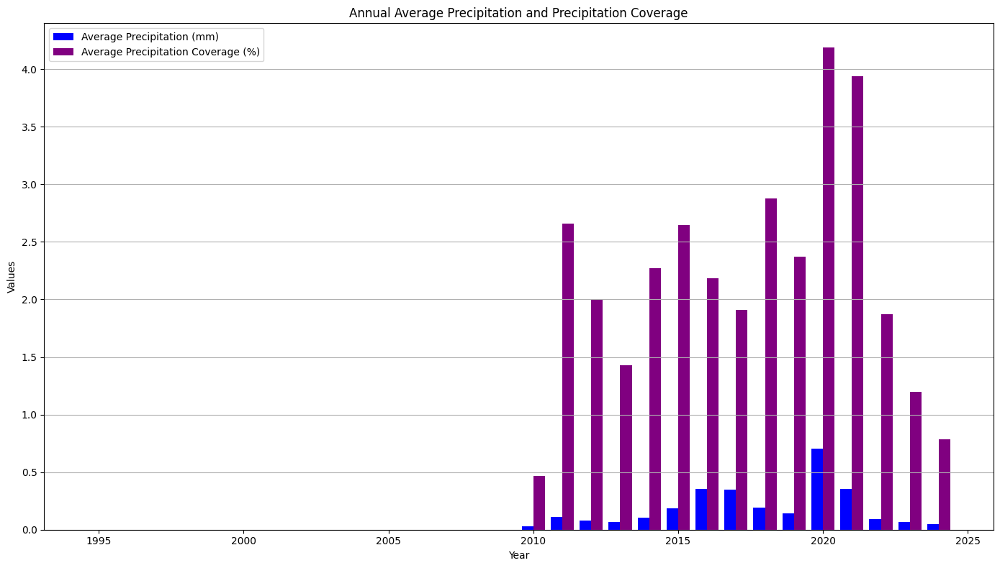

In [54]:
annual_data = df.groupby(df.index.year).agg({
    'precip': 'mean',
    'precipcover': 'mean'
}).reset_index()
annual_data.columns = ['Year', 'Average Precipitation (mm)', 'Average Precipitation Coverage (%)']

plt.figure(figsize=(14, 8))

plt.bar(annual_data['Year'] - 0.2, annual_data['Average Precipitation (mm)'], width=0.4, label='Average Precipitation (mm)', color='blue')
plt.bar(annual_data['Year'] + 0.2, annual_data['Average Precipitation Coverage (%)'], width=0.4, label='Average Precipitation Coverage (%)', color='purple')

plt.title('Annual Average Precipitation and Precipitation Coverage')
plt.xlabel('Year')
plt.ylabel('Values')
plt.legend()
plt.grid(axis='y')

# تحسين العرض
plt.tight_layout()

# عرض الرسم
plt.show()

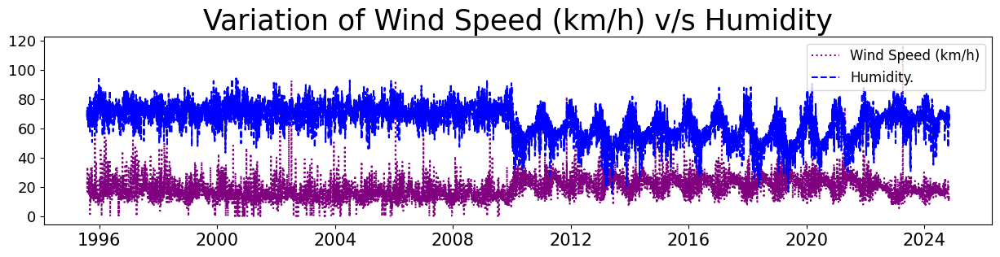

In [55]:
plt.figure(figsize=(15,3));
plt.plot(df['windspeed'], label = 'Wind Speed (km/h)', color='purple',linestyle='dotted');
plt.plot(df['humidity'], label = 'Humidity.', color  = 'blue', linestyle='dashed');
plt.title('Variation of Wind Speed (km/h) v/s Humidity', fontsize = 25);
plt.legend(loc=0, fontsize =12);
plt.xticks(fontsize = 15);
plt.yticks(fontsize=13);
# plt.savefig('Variation of Wind Speed (km Per h) VS Humidity.png')

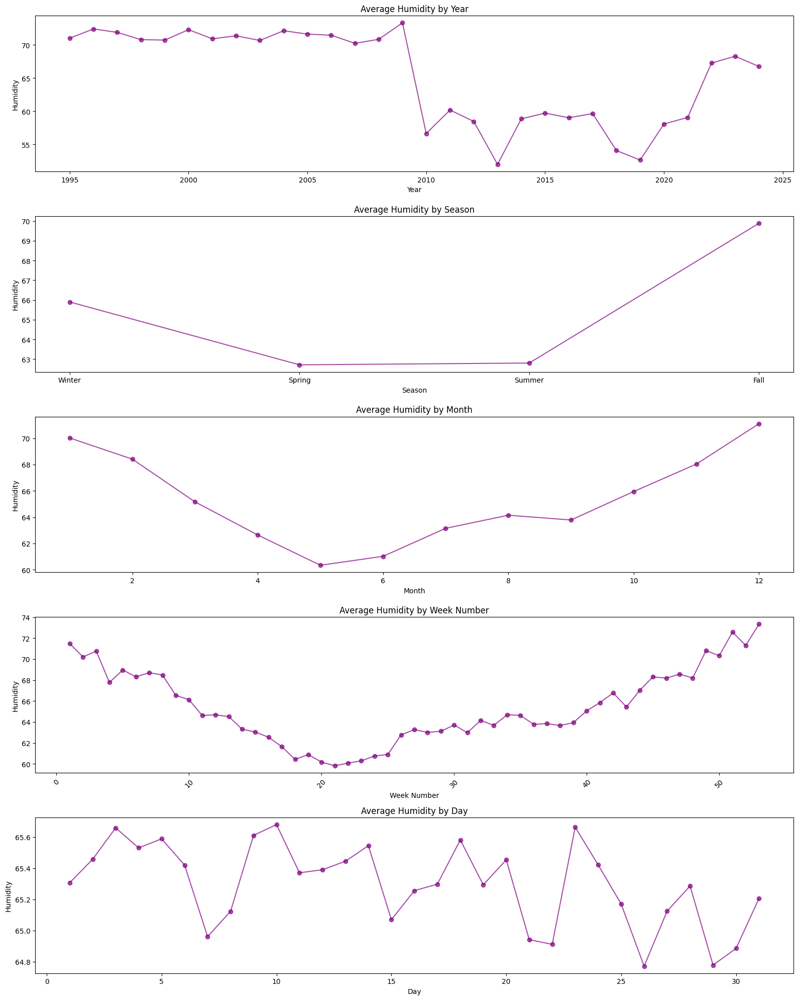

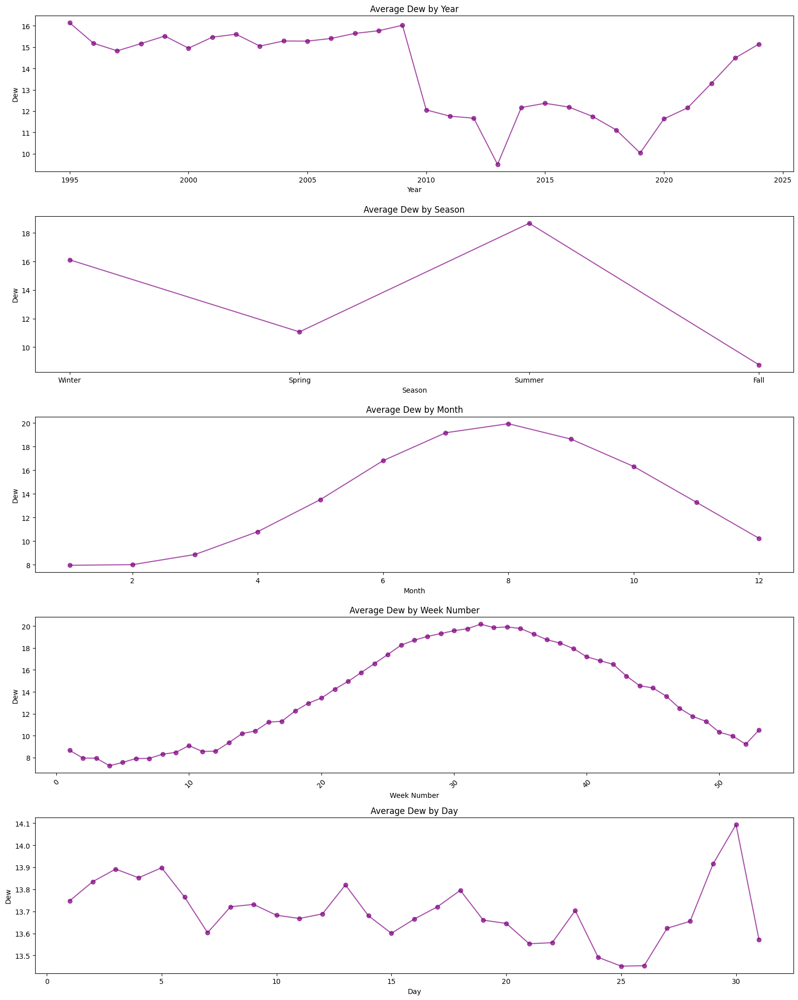

In [56]:
# Define groupings based on the new temporal features
groupings = {
    'Year': 'year',
    'Season': 'season',
    'Month': 'month',
    'Week Number': 'week_number',
    'Day':'day'
}

plot_trends_with_temporal_features(df, groupings, 'humidity',plot_type='line')
plot_trends_with_temporal_features(df, groupings, 'dew',plot_type='line')

### Group 3: Wind and Visibility-Related Columns
**Columns**: `windgust`, `windspeed`, `winddir`, `visibility`

#### Actions:
1. **Univariate Analysis**:
   - Detect high wind speed events using histograms and box plots.
   - Explore visibility data for foggy or clear conditions.
2. **Bivariate Analysis**:
   - Compare `windgust` and `windspeed` to identify gust-heavy periods.
   - Explore the relationship between visibility and weather conditions.
3. **Time-Series Analysis**:
   - Highlight wind and visibility trends over time.
   - Detect storm periods with extreme wind gusts.

**Key Visualizations**:
- Windrose plots for `winddir` and `windspeed`.
- Line plots of wind gust trends over time.
- Scatter plots of `visibility` vs. `cloudcover`.

---

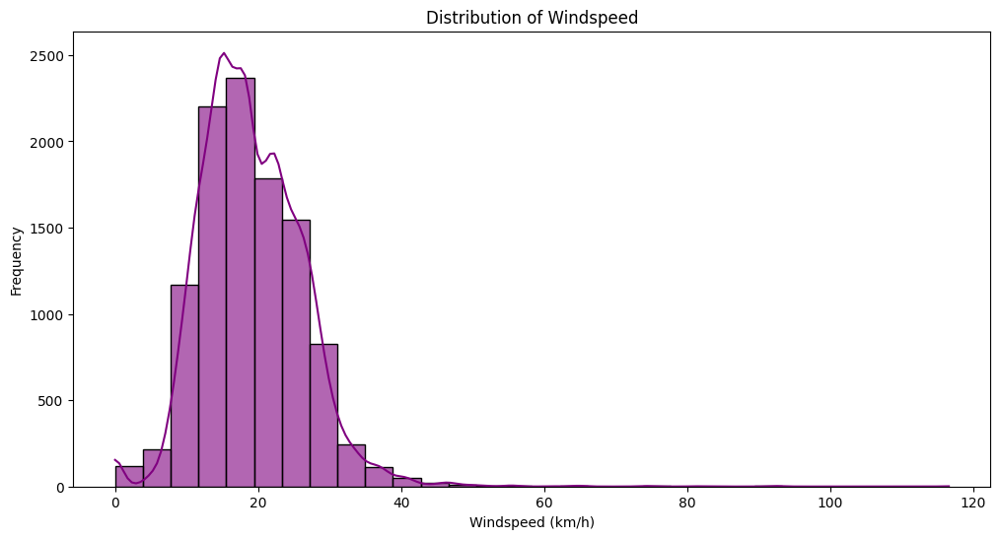

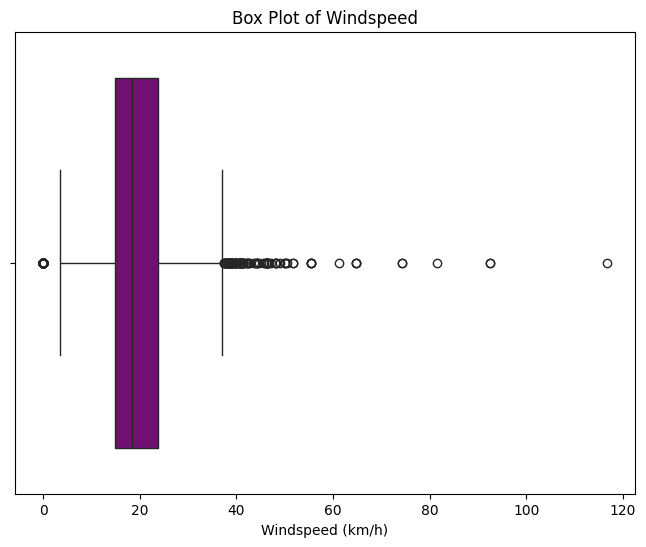

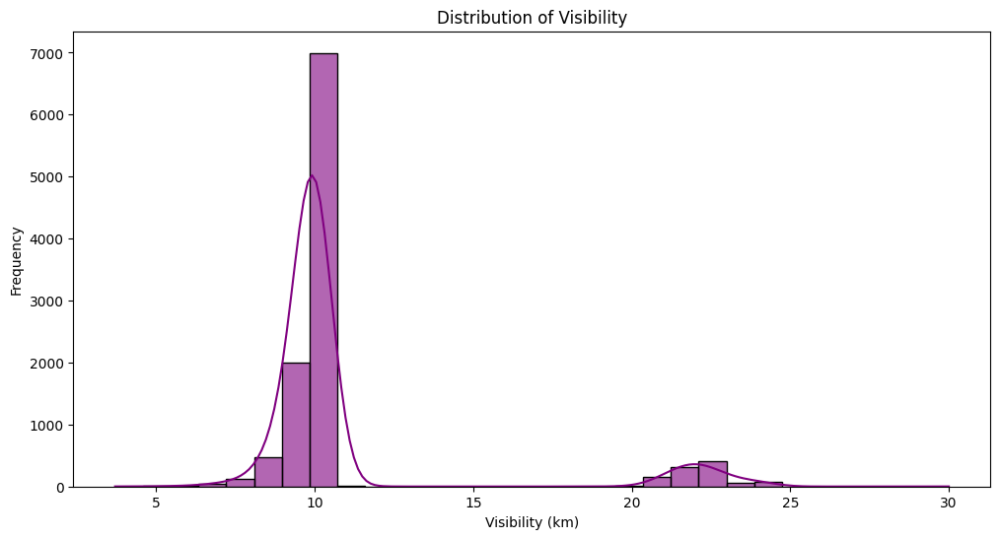

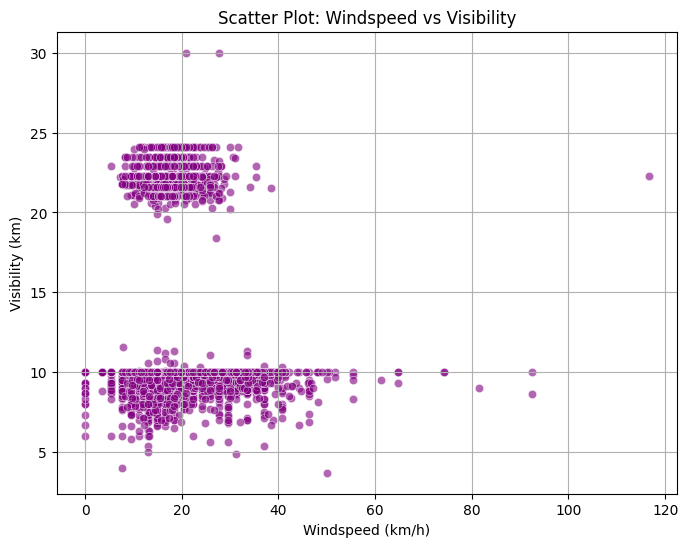

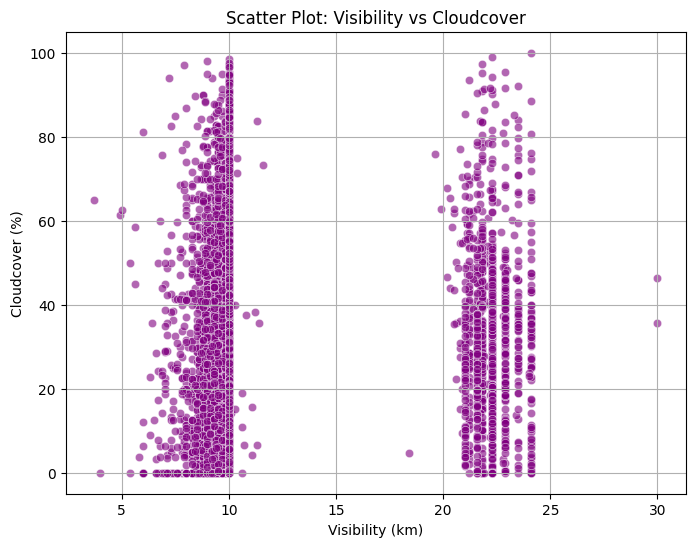

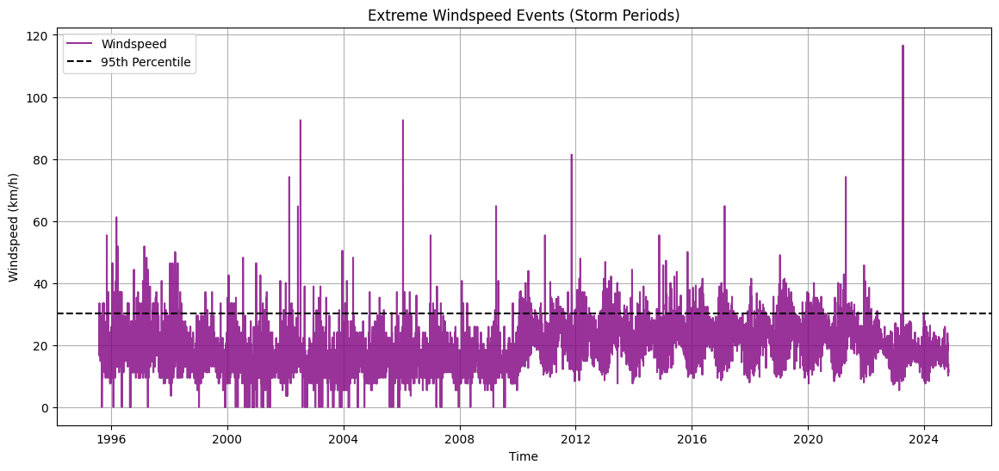

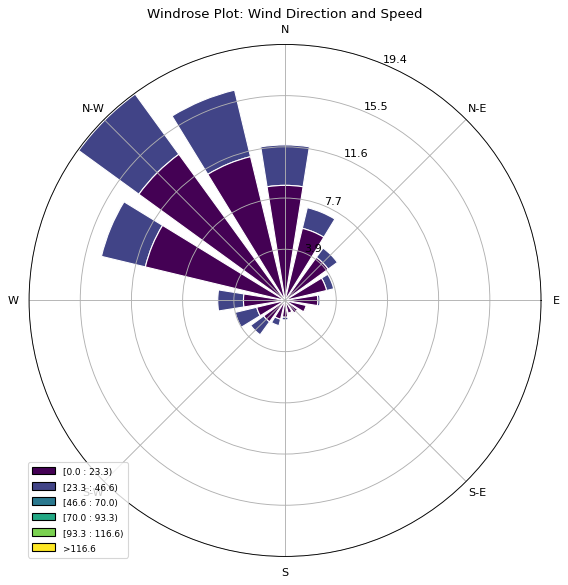

In [57]:
# Columns: 'windspeed', 'winddir', 'visibility', 'cloudcover'

# 1. Univariate Analysis
# a. Detect high windspeed events using histograms and box plots
plt.figure(figsize=(12, 6))
sns.histplot(df['windspeed'], kde=True, bins=30, color='purple', alpha=0.6)
plt.title('Distribution of Windspeed')
plt.xlabel('Windspeed (km/h)')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(8, 6))
sns.boxplot(x='windspeed', data=df, color='purple')
plt.title('Box Plot of Windspeed')
plt.xlabel('Windspeed (km/h)')
plt.show()

# b. Explore visibility data for foggy or clear conditions
plt.figure(figsize=(12, 6))
sns.histplot(df['visibility'], kde=True, bins=30, color='purple', alpha=0.6)
plt.title('Distribution of Visibility')
plt.xlabel('Visibility (km)')
plt.ylabel('Frequency')
plt.show()

# 2. Bivariate Analysis
# a. Compare windspeed and visibility
plt.figure(figsize=(8, 6))
sns.scatterplot(x='windspeed', y='visibility', data=df, color='purple', alpha=0.6)
plt.title('Scatter Plot: Windspeed vs Visibility')
plt.xlabel('Windspeed (km/h)')
plt.ylabel('Visibility (km)')
plt.grid(True)
plt.show()

# b. Explore visibility vs. weather conditions (cloudcover)
if 'cloudcover' in df.columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='visibility', y='cloudcover', data=df, color='purple', alpha=0.6)
    plt.title('Scatter Plot: Visibility vs Cloudcover')
    plt.xlabel('Visibility (km)')
    plt.ylabel('Cloudcover (%)')
    plt.grid(True)
    plt.show()

# 3. Time-Series Analysis
# a. Highlight windspeed and visibility trends over time
if 'datetime' in df.columns:
    df['datetime'] = pd.to_datetime(df['datetime'])
    plt.figure(figsize=(14, 6))
    sns.lineplot(x=df.index, y='windspeed', data=df, label='Windspeed', color='blue', alpha=0.7)
    sns.lineplot(x=df.index, y='visibility', data=df, label='Visibility', color='purple', alpha=0.7)
    plt.title('Windspeed and Visibility Trends Over Time')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# b. Detect storm periods with extreme windspeed
plt.figure(figsize=(14, 6))
sns.lineplot(x=df.index, y='windspeed', data=df, label='Windspeed', color='purple', alpha=0.8)
plt.axhline(df['windspeed'].quantile(0.95), color='black', linestyle='--', label='95th Percentile')
plt.title('Extreme Windspeed Events (Storm Periods)')
plt.xlabel('Time')
plt.ylabel('Windspeed (km/h)')
plt.legend()
plt.grid(True)
plt.show()

# 4. Windrose Plot (if winddir and windspeed columns are available)
try:
    from windrose import WindroseAxes
    if 'winddir' in df.columns and 'windspeed' in df.columns:
        ax = WindroseAxes.from_ax()
        ax.bar(df['winddir'], df['windspeed'], normed=True, opening=0.8, edgecolor='white')
        ax.set_title('Windrose Plot: Wind Direction and Speed')
        ax.set_legend()
        plt.show()
except ImportError:
    print("Windrose library is not installed. Please install it using `pip install windrose` to generate windrose plots.")


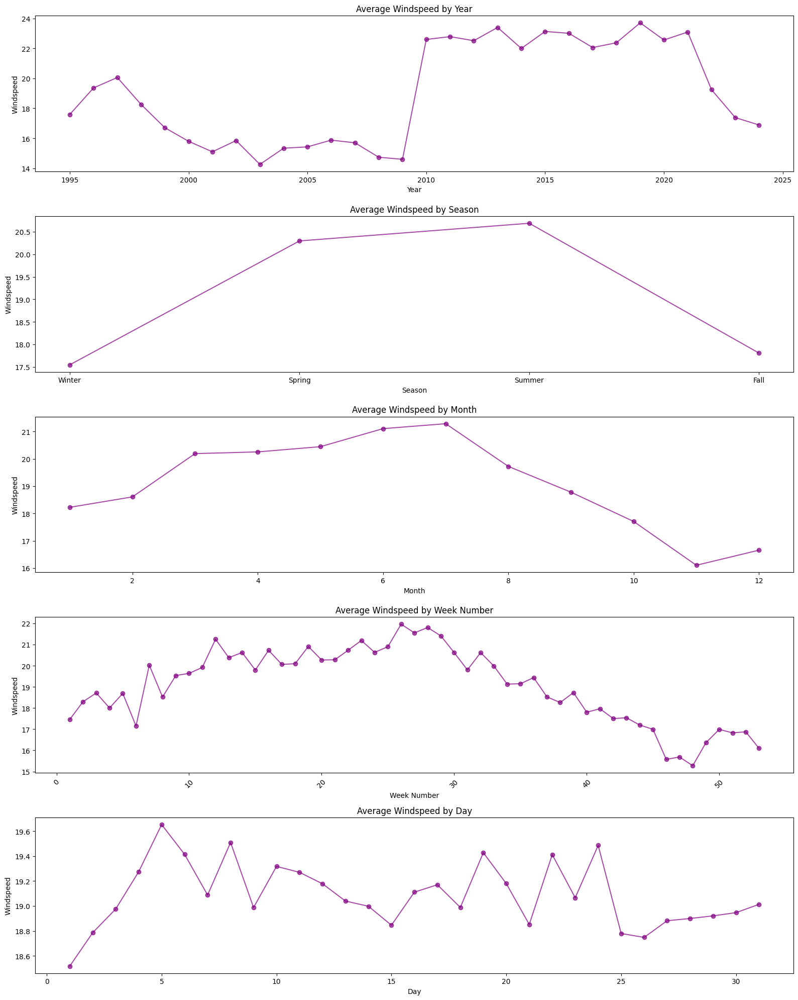

In [58]:
plot_trends_with_temporal_features(df, groupings, 'windspeed',plot_type='line')

### Group 4: Solar and Atmospheric Columns
**Columns**: `solarradiation`, `solarenergy`, `cloudcover`, `sealevelpressure`, `uvindex`

#### Actions:
1. **Univariate Analysis**:
   - Explore distributions of solar and atmospheric variables.
   - Identify days with high/low solar radiation or cloud cover.
2. **Bivariate Analysis**:
   - Compare `solarenergy` with `solarradiation` and `cloudcover`.
   - Explore the relationship between `sealevelpressure` and wind speed.
3. **Time-Series Analysis**:
   - Highlight seasonal solar energy and radiation patterns.
   - Detect extreme UV index periods.

**Key Visualizations**:
- Heatmaps for `solarenergy` vs. `cloudcover`.
- Seasonal decomposition of solar radiation.
- Line plots of `uvindex` trends over time.

---

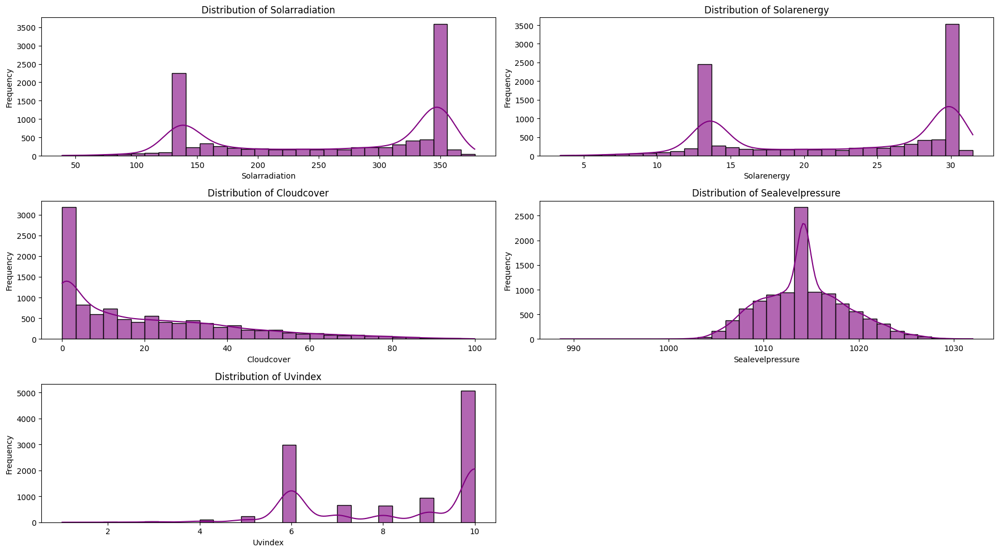

In [59]:
# 1. Univariate Analysis
# a. Distributions of solar and atmospheric variables
plt.figure(figsize=(18, 10))
columns = ['solarradiation', 'solarenergy', 'cloudcover', 'sealevelpressure', 'uvindex']
for i, col in enumerate(columns, 1):
    plt.subplot(3, 2, i)
    sns.histplot(df[col], kde=True, bins=30, color='purple', alpha=0.6)
    plt.title(f'Distribution of {col.capitalize()}')
    plt.xlabel(col.capitalize())
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2696655410.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='season', y='solarradiation', data=df, palette='coolwarm', color='purple')


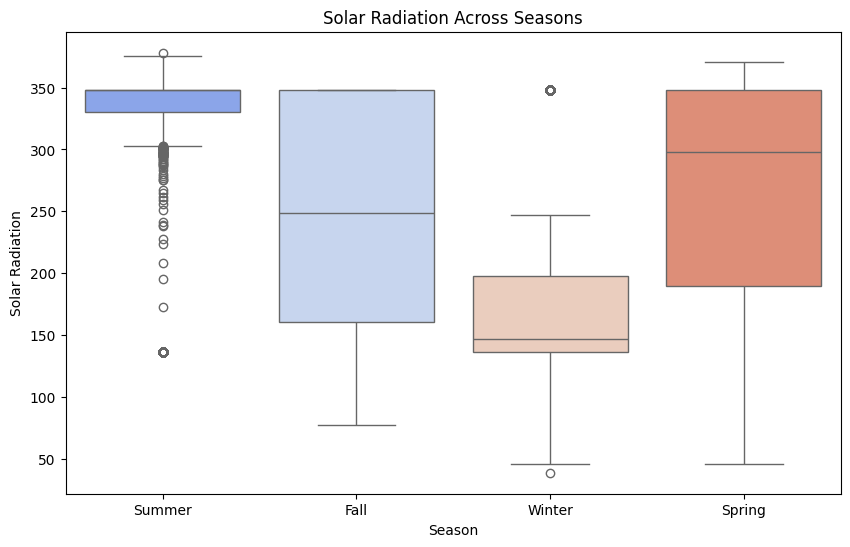

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2696655410.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='season', y='cloudcover', data=df, palette='viridis', color='purple')


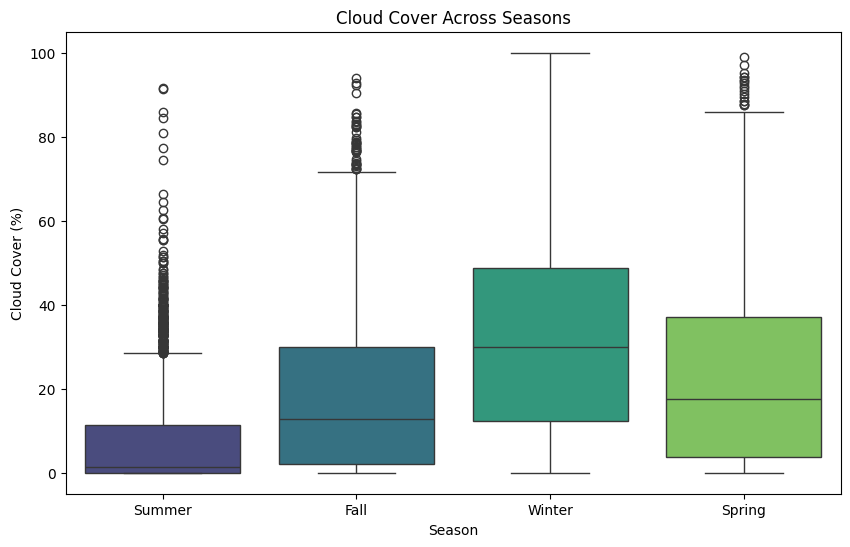

In [60]:
# b. Identify days with high/low solar radiation or cloud cover
plt.figure(figsize=(10, 6))
sns.boxplot(x='season', y='solarradiation', data=df, palette='coolwarm', color='purple')
plt.title('Solar Radiation Across Seasons')
plt.xlabel('Season')
plt.ylabel('Solar Radiation')
plt.show()



plt.figure(figsize=(10, 6))
sns.boxplot(x='season', y='cloudcover', data=df, palette='viridis', color='purple')
plt.title('Cloud Cover Across Seasons')
plt.xlabel('Season')
plt.ylabel('Cloud Cover (%)')
plt.show()


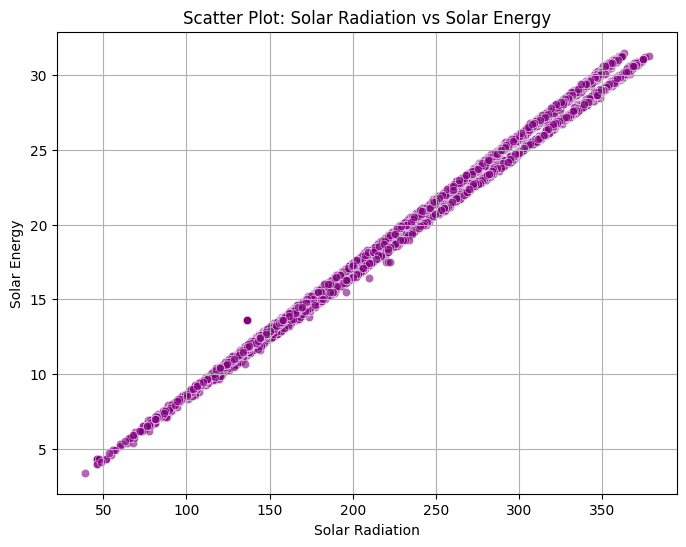

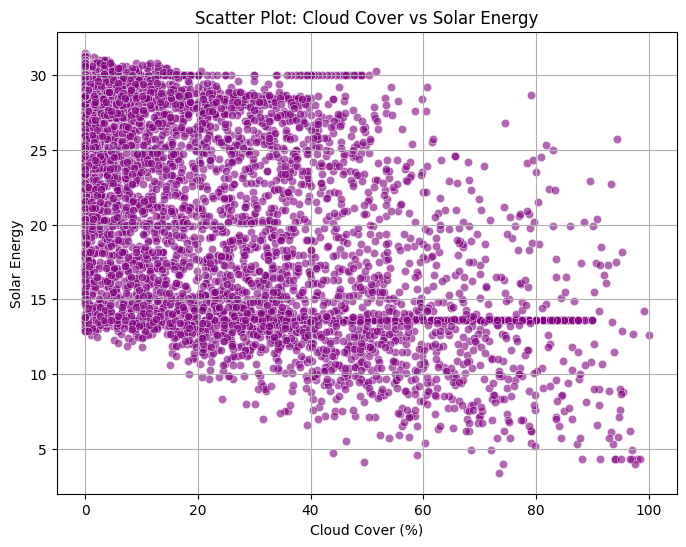

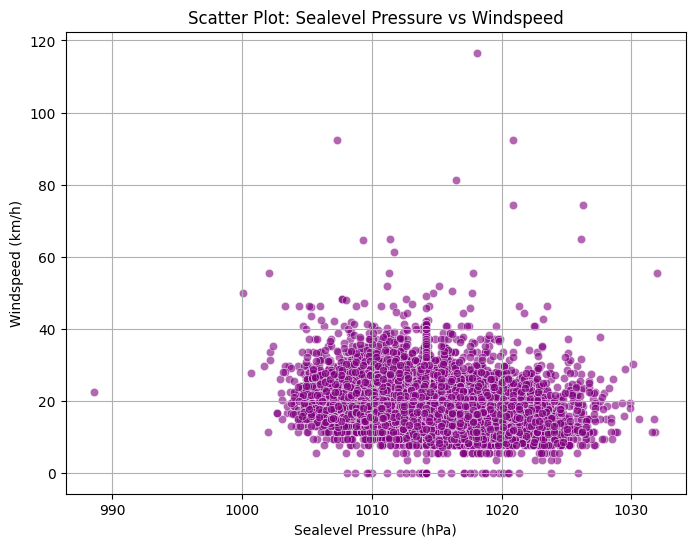

In [61]:
# 2. Bivariate Analysis
# a. Solar energy vs. solar radiation and cloud cover
plt.figure(figsize=(8, 6))
sns.scatterplot(x='solarradiation', y='solarenergy', data=df, color='purple', alpha=0.6)
plt.title('Scatter Plot: Solar Radiation vs Solar Energy')
plt.xlabel('Solar Radiation')
plt.ylabel('Solar Energy')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='cloudcover', y='solarenergy', data=df, color='purple', alpha=0.6)
plt.title('Scatter Plot: Cloud Cover vs Solar Energy')
plt.xlabel('Cloud Cover (%)')
plt.ylabel('Solar Energy')
plt.grid(True)
plt.show()

# b. Sealevelpressure vs. wind speed (assuming windspeed column exists)
if 'windspeed' in df.columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='sealevelpressure', y='windspeed', data=df, color='purple', alpha=0.6)
    plt.title('Scatter Plot: Sealevel Pressure vs Windspeed')
    plt.xlabel('Sealevel Pressure (hPa)')
    plt.ylabel('Windspeed (km/h)')
    plt.grid(True)
    plt.show()


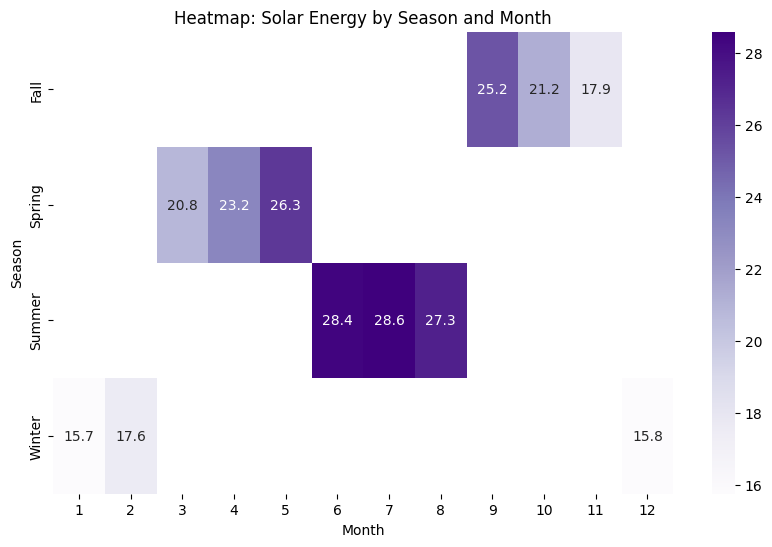

In [62]:

# 4. Heatmap for Solar Energy vs. Cloud Cover
# Create a pivot table for the heatmap
heatmap_data = df.pivot_table(index='season', columns='month', values='solarenergy', aggfunc='mean')
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='Purples', annot=True, fmt=".1f")
plt.title('Heatmap: Solar Energy by Season and Month')
plt.xlabel('Month')
plt.ylabel('Season')
plt.show()

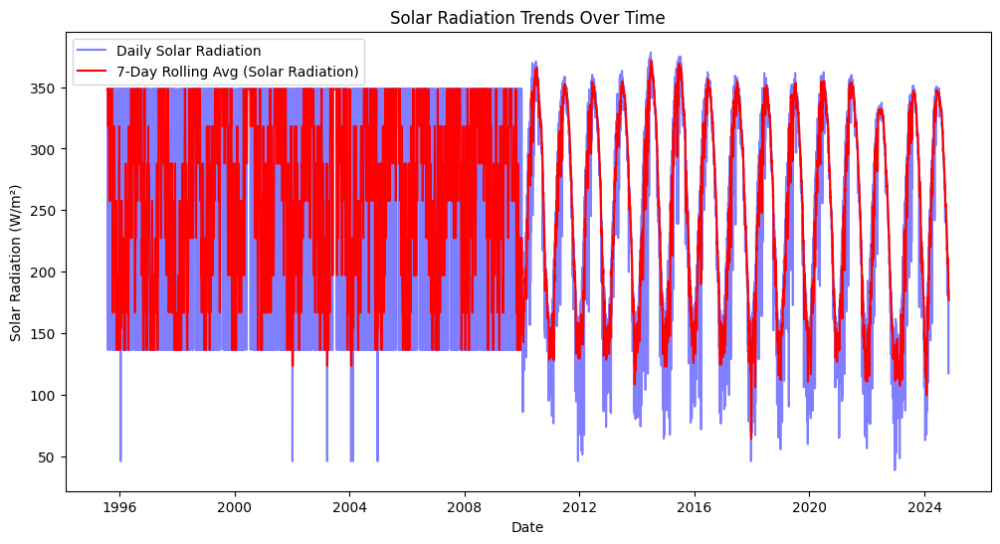

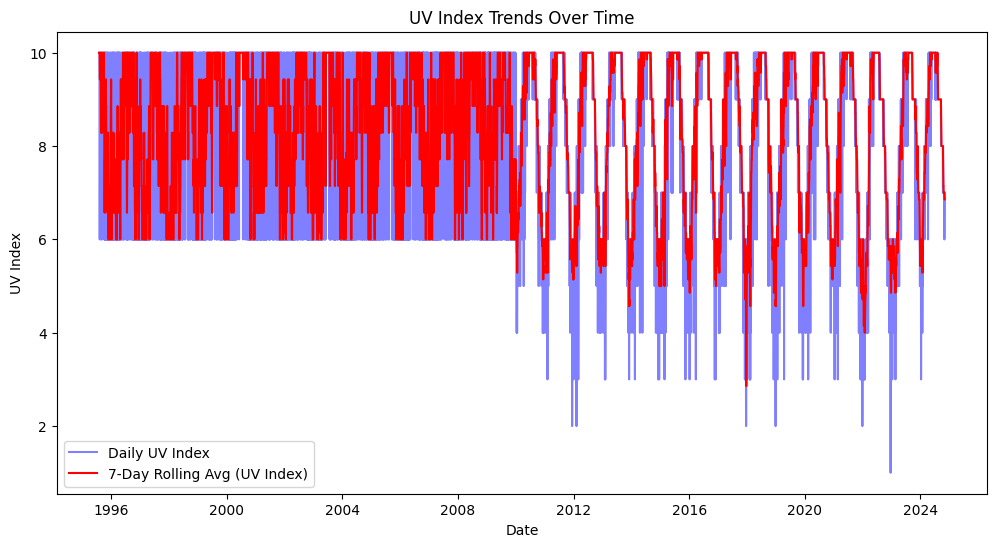

In [63]:


# Line plot for solar radiation trends
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['solarradiation'], label='Daily Solar Radiation', alpha=0.5, color='blue')
plt.plot(df.index, df['solarradiation_7d_avg'], label='7-Day Rolling Avg (Solar Radiation)', color='red')
plt.legend()
plt.title('Solar Radiation Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Solar Radiation (W/m²)')
plt.show()

# Line plot for UV index trends
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['uvindex'], label='Daily UV Index', alpha=0.5, color='blue')
plt.plot(df.index, df['uvindex_7d_avg'], label='7-Day Rolling Avg (UV Index)', color='red')
plt.legend()
plt.title('UV Index Trends Over Time')
plt.xlabel('Date')
plt.ylabel('UV Index')
plt.show()




### Group 5: Temporal and Categorical Columns
**Columns**: `datetime`, `year`, `month`, `day`, `season`, `conditions`, `classification`, `icon`

#### Actions:
1. **Univariate Analysis**:
   - Explore the distribution of weather conditions (`conditions`).
   - Analyze seasonality in `classification` (e.g., `Higher`, `Normal`, `Lower`).
2. **Bivariate Analysis**:
   - Compare weather conditions across months.
   - Explore temperature and precipitation trends by season.
3. **Time-Series Analysis**:
   - Identify annual and seasonal patterns.
   - Highlight unusual weather events.

**Key Visualizations**:
- Pie charts for `conditions`.
- Line plots of weather trends by `month` or `season`.
- Bar charts for `classification` frequencies.

---


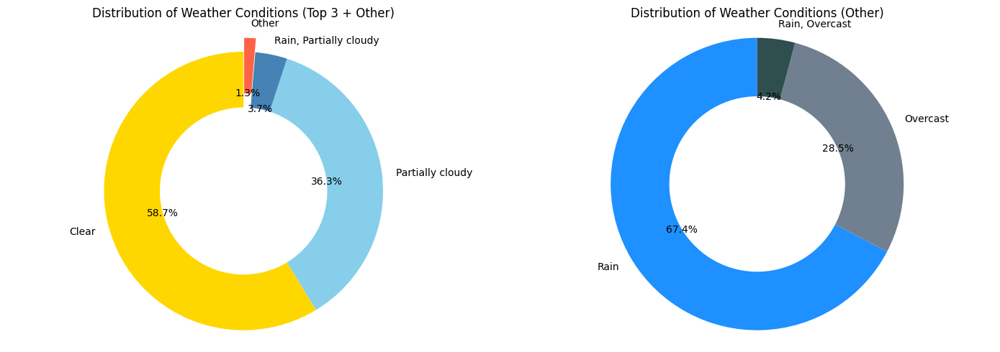

In [64]:
# Count occurrences of each condition
conditions_counts = df['conditions'].value_counts()

# Get the top 3 conditions
top_3_conditions = conditions_counts.nlargest(3)

# Sum the remaining conditions as "Other"
remaining_conditions = conditions_counts.iloc[3:].sum()

# Add "Other" category to the top 3
top_3_conditions['Other'] = remaining_conditions

# Define fixed colors for all conditions, including "Other"
condition_colors = {
    'Clear': '#FFD700',                 # Gold for Clear
    'Partially cloudy': '#87CEEB',      # Sky blue for Partially cloudy
    'Rain, Partially cloudy': '#4682B4',  # Steel blue for Rain and Partially cloudy
    'Rain': '#1E90FF',                  # Dodger blue for Rain
    'Overcast': '#708090',              # Slate gray for Overcast
    'Rain, Overcast': '#2F4F4F',        # Dark slate gray for Rain and Overcast
    'Other': '#FF6347'                  # Tomato for Other
}

# Define explode for highlighting "Other" category in the first pie chart
explode = [0, 0, 0, 0.1]

# Set up subplots for two pie charts
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Pie chart for top 3 conditions + Other
wedges, texts, autotexts = ax1.pie(
    top_3_conditions, 
    labels=top_3_conditions.index, 
    autopct='%1.1f%%', 
    startangle=90, 
    explode=explode, 
    colors=[condition_colors.get(cond, '#000000') for cond in top_3_conditions.index],  # Use fixed colors
    wedgeprops=dict(width=0.4)  # Donut-style pie chart
)

# Equal aspect ratio ensures the pie is drawn as a circle
ax1.axis('equal')
ax1.set_title('Distribution of Weather Conditions (Top 3 + Other)')

# Style the percentage text
for text in autotexts:
    text.set_color('black')  # Set text color to black for better visibility
    text.set_fontsize(10)    # Set font size for percentage labels

# Pie chart for remaining conditions (Other breakdown)
remaining_conditions_counts = conditions_counts.iloc[3:]  # Data for "Other" breakdown

wedges2, texts2, autotexts2 = ax2.pie(
    remaining_conditions_counts, 
    labels=remaining_conditions_counts.index, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=[condition_colors.get(cond, '#000000') for cond in remaining_conditions_counts.index],  # Use fixed colors
    wedgeprops=dict(width=0.4)  # Donut-style pie chart
)

# Equal aspect ratio ensures the pie is drawn as a circle
ax2.axis('equal')
ax2.set_title('Distribution of Weather Conditions (Other)')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


C:\Users\awint\AppData\Local\Temp\ipykernel_23848\3115971434.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='conditions', data=df, palette='Paired', dodge=True)
C:\Users\awint\AppData\Local\Temp\ipykernel_23848\3115971434.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Conditions', bbox_to_anchor=(1.05, 1), loc='upper left')


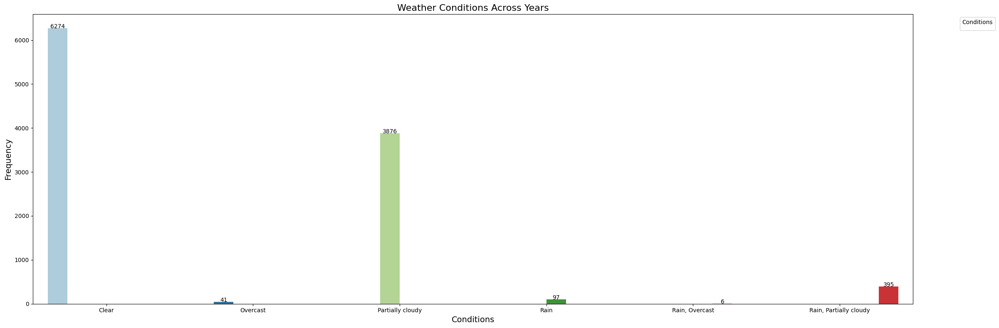

In [65]:
# Set figure size
plt.figure(figsize=(24, 8))

# Create the countplot
ax = sns.countplot(x='conditions', data=df, palette='Paired', dodge=True)

# Add a title and axis labels
plt.title('Weather Conditions Across Years', fontsize=16)
plt.xlabel('Conditions', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Annotate counts above each bar
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',  # Display the height of each bar
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position above the bar
        ha='center', va='baseline', fontsize=10, color='black'  # Text properties
    )

# Improve the legend position
plt.legend(title='Conditions', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

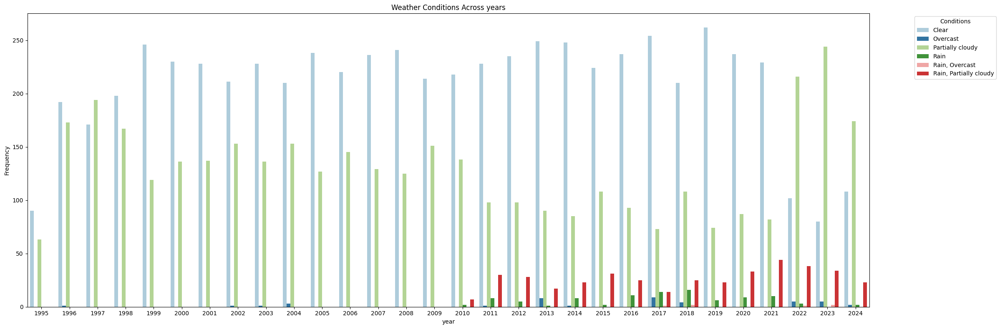

In [66]:
# 2. Bivariate Analysis
# a. Weather conditions across months
plt.figure(figsize=(24, 8))
sns.countplot(x='year', hue='conditions', data=df, palette='Paired', dodge=True)
plt.title('Weather Conditions Across years')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.legend(title='Conditions', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

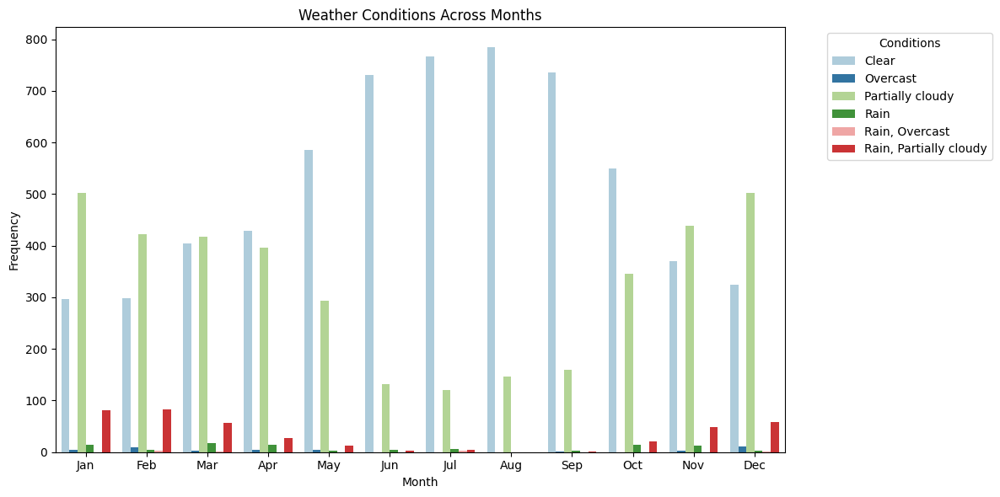

In [67]:


# 2. Bivariate Analysis
# a. Weather conditions across months
plt.figure(figsize=(12, 6))
sns.countplot(x='month', hue='conditions', data=df, palette='Paired', dodge=True)
plt.title('Weather Conditions Across Months')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.xticks(ticks=range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Conditions', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



C:\Users\awint\AppData\Local\Temp\ipykernel_23848\4202489587.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='year', values= c , aggfunc='mean')


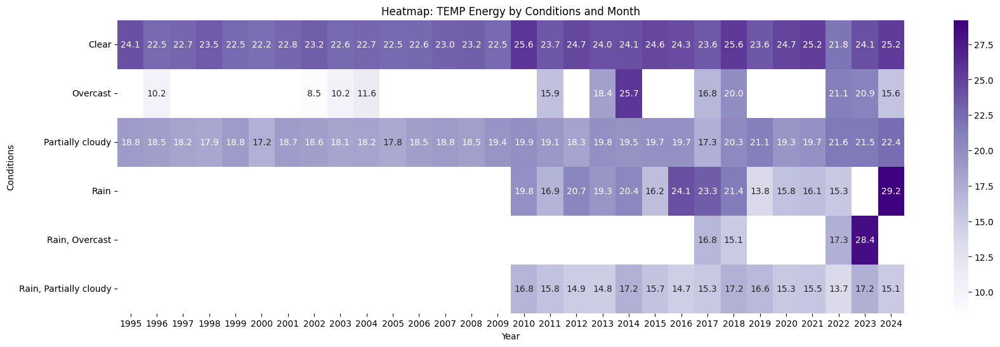

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\4202489587.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='year', values= c , aggfunc='mean')


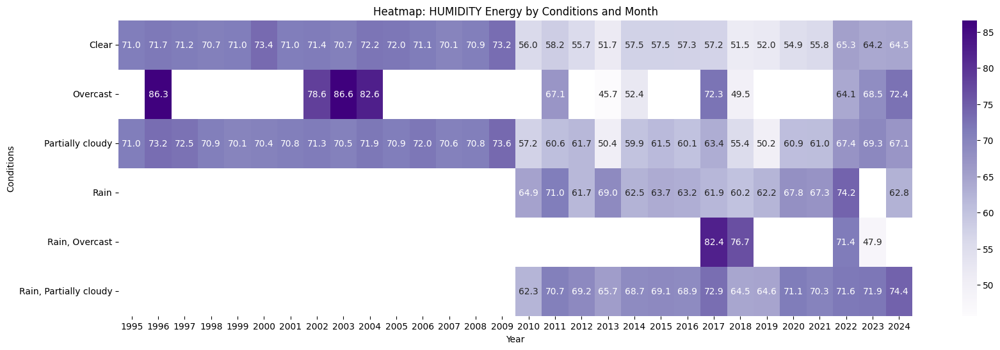

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\4202489587.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='year', values= c , aggfunc='mean')


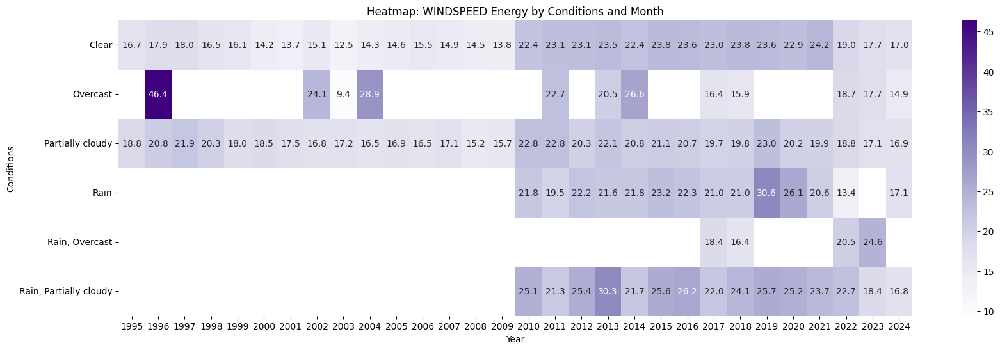

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\4202489587.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='year', values= c , aggfunc='mean')


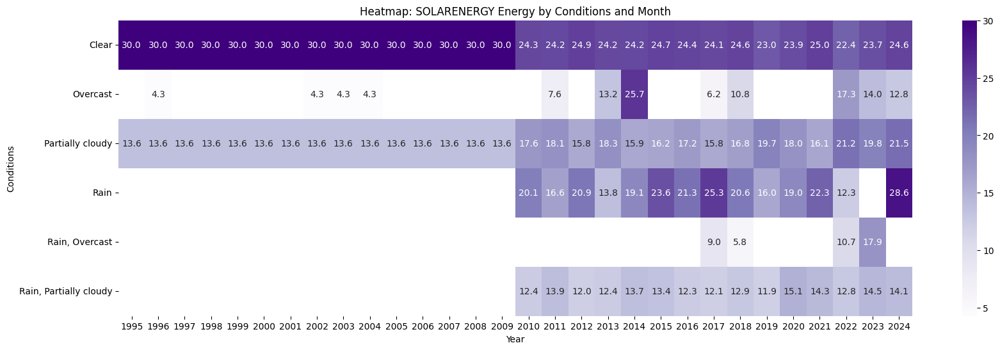

In [103]:
dscolumns = ['temp','humidity','windspeed','solarenergy']
for c in dscolumns:
    # Create a pivot table for the heatmap
    heatmap_data = df.pivot_table(index='conditions', columns='year', values= c , aggfunc='mean')
    plt.figure(figsize=(20, 6))
    sns.heatmap(heatmap_data, cmap='Purples', annot=True, fmt=".1f")
    plt.title(f'Heatmap: {str.upper(c)} Energy by Conditions and Year')
    plt.xlabel('Year')
    plt.ylabel('Conditions')
    plt.show()

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2588313335.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='season', values= c , aggfunc='mean')


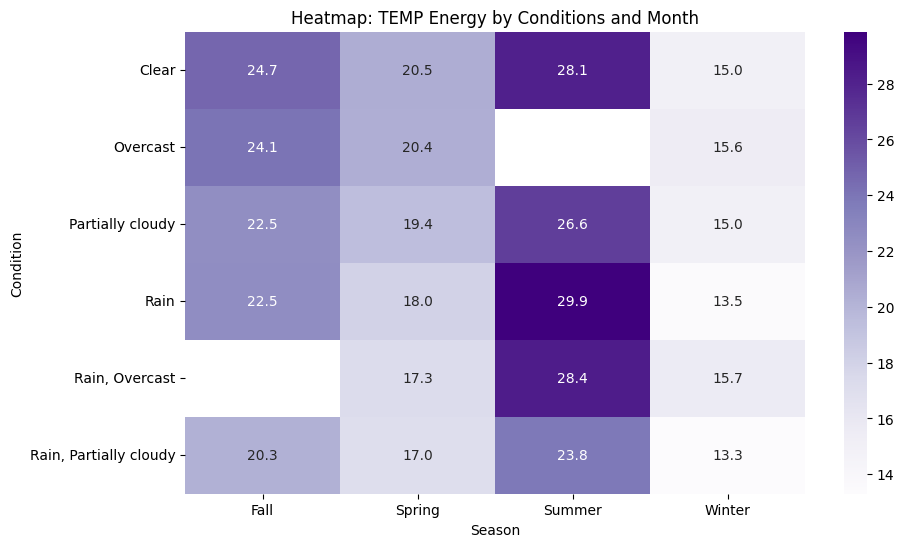

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2588313335.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='season', values= c , aggfunc='mean')


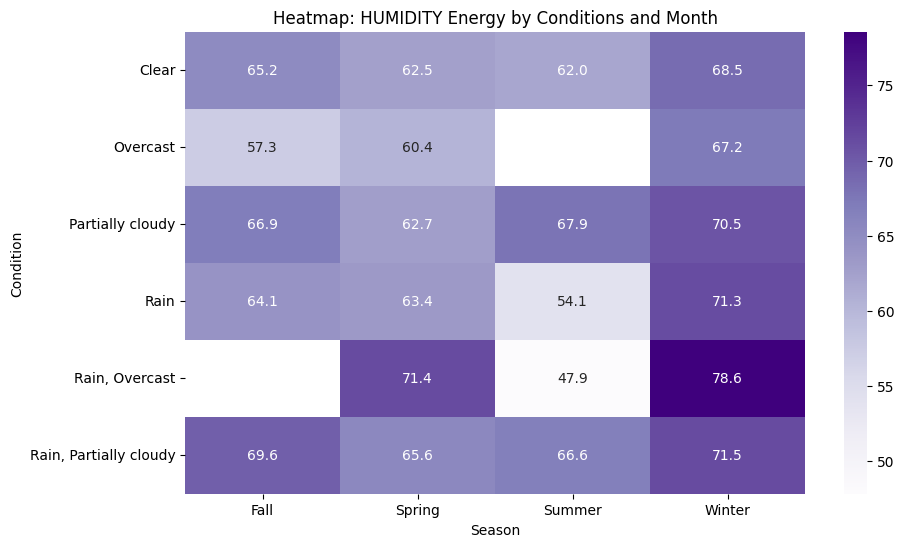

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2588313335.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='season', values= c , aggfunc='mean')


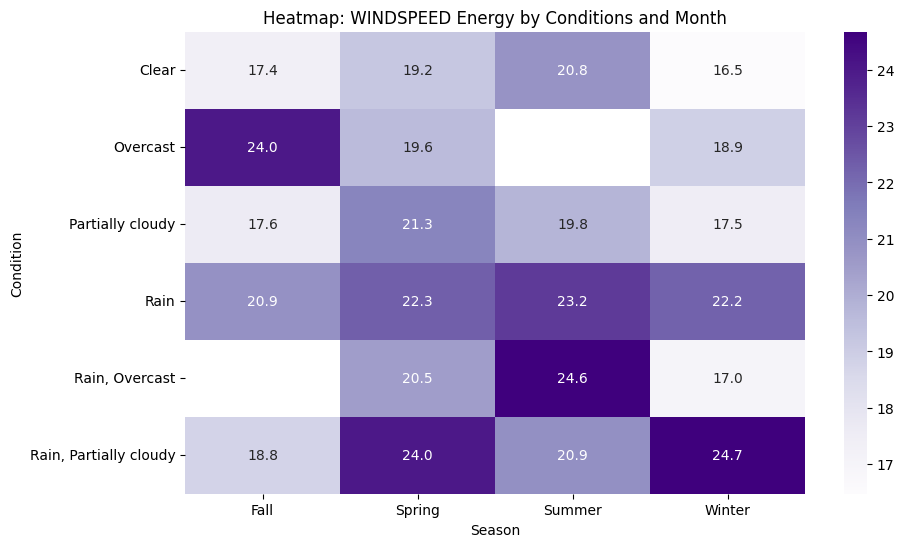

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2588313335.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='season', values= c , aggfunc='mean')


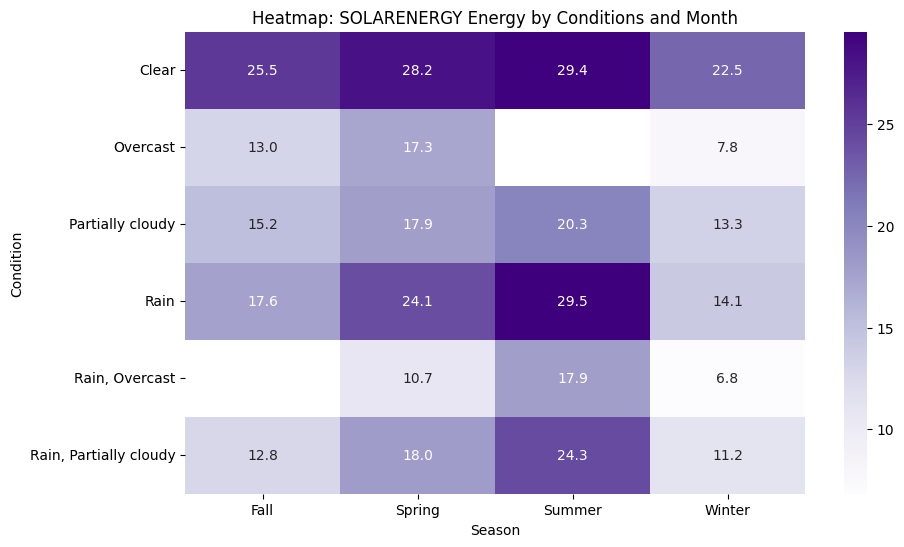

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2588313335.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='season', values= c , aggfunc='mean')


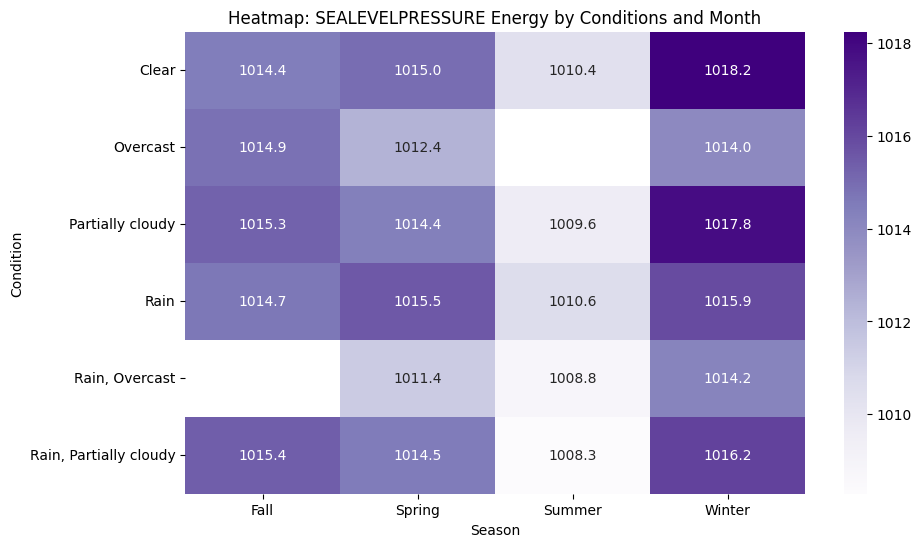

In [109]:
dscolumns = ['temp','humidity','windspeed','solarenergy','sealevelpressure']
for c in dscolumns:
    # Create a pivot table for the heatmap
    heatmap_data = df.pivot_table(index='conditions', columns='season', values= c , aggfunc='mean')
    plt.figure(figsize=(10, 6))
    sns.heatmap(heatmap_data, cmap='Purples', annot=True, fmt=".1f")
    plt.title(f'Heatmap: {str.upper(c)} Energy by Conditions and Season')
    plt.xlabel('Season')
    plt.ylabel('Condition')
    plt.show()

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2368703658.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='month', values= c , aggfunc='mean')


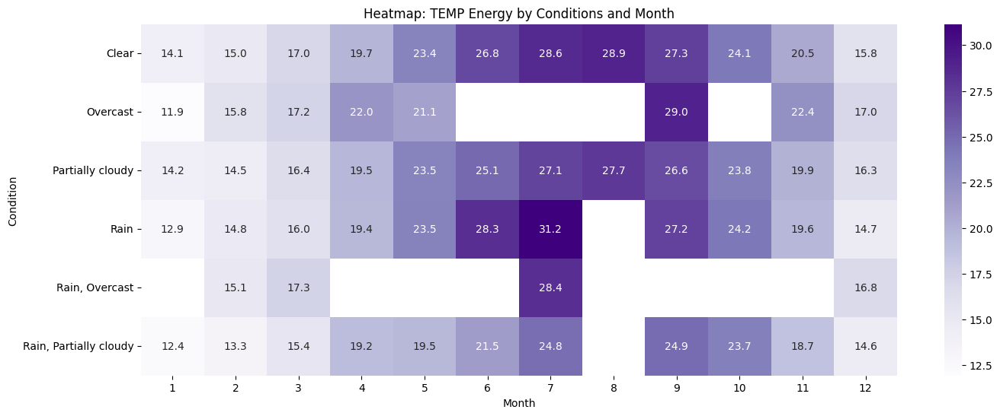

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2368703658.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='month', values= c , aggfunc='mean')


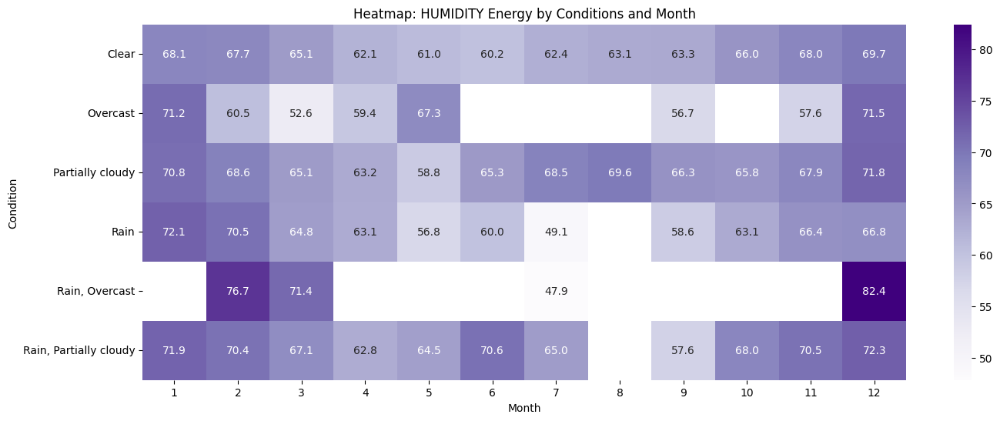

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2368703658.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='month', values= c , aggfunc='mean')


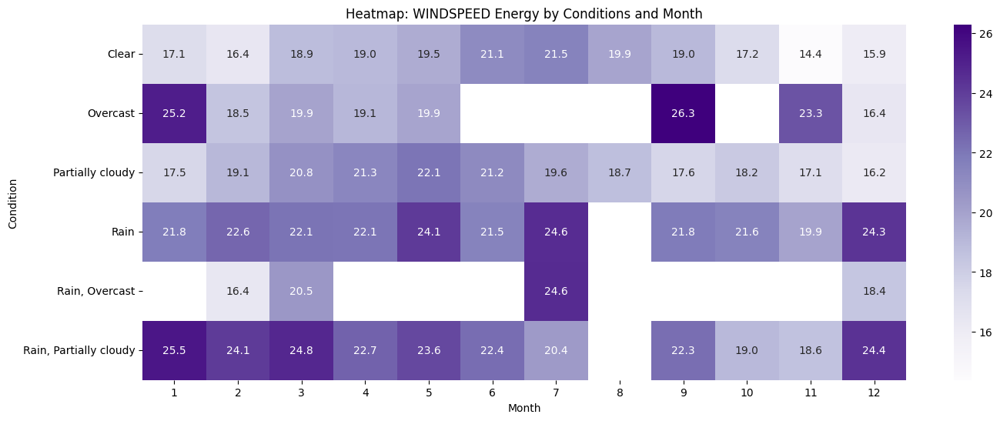

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2368703658.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='month', values= c , aggfunc='mean')


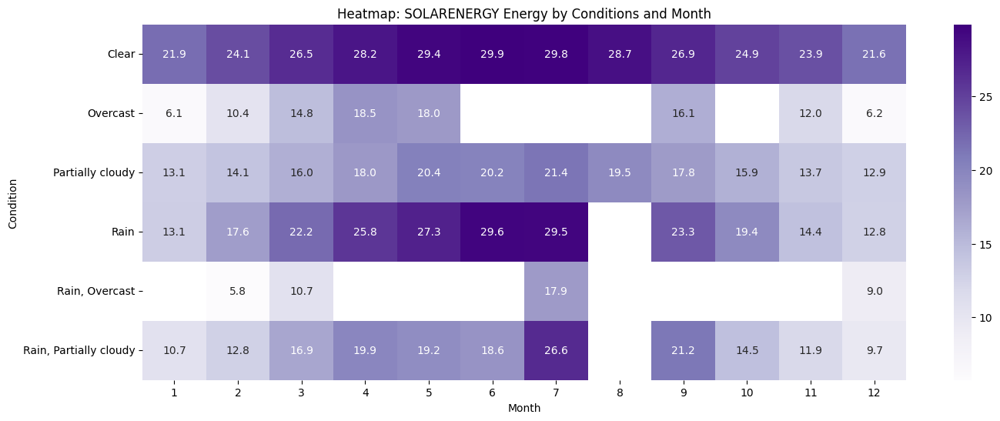

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2368703658.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = df.pivot_table(index='conditions', columns='month', values= c , aggfunc='mean')


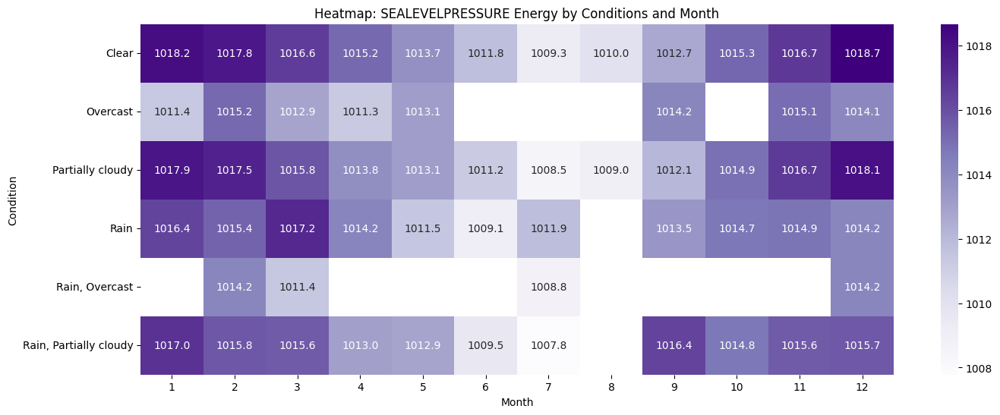

In [106]:
dscolumns = ['temp','humidity','windspeed','solarenergy','sealevelpressure']
for c in dscolumns:
    # Create a pivot table for the heatmap
    heatmap_data = df.pivot_table(index='conditions', columns='month', values= c , aggfunc='mean')
    plt.figure(figsize=(16, 6))
    sns.heatmap(heatmap_data, cmap='Purples', annot=True, fmt=".1f")
    plt.title(f'Heatmap: {str.upper(c)} Energy by Conditions and Month')
    plt.xlabel('Month')
    plt.ylabel('Condition')
    plt.show()

In [110]:
# dscolumns = ['temp','humidity','windspeed','solarenergy','sealevelpressure']
# for c in dscolumns:
#     plt.figure(figsize=(10,8))
#     # pd.factorize(df[0])[0]
#     sns.heatmap(pd.crosstab(df[c], df['conditions']), cmap='Purples')
#     # sns.heatmap(pd.crosstab(pd.cut(df[c], [0,15, 28, 32], labels=['low', 'medium','high']), df['conditions']), cmap='coolwarm')
#     plt.xlabel('conditions')
#     plt.ylabel(str.upper(c))
#     plt.title('Conditions by %s features' % (str.upper(c)))
#     plt.show()
#     plt.savefig('Conditions by %s features.png' % (str.upper(c)))
     

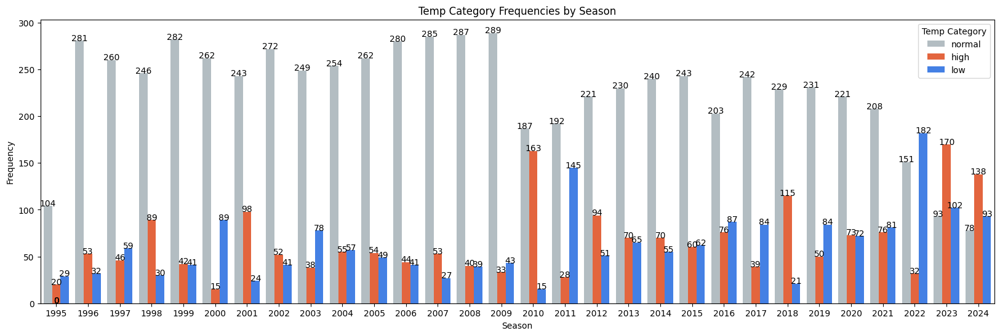

In [70]:
# Define a custom palette for temp_category
temp_category_palette = {
    'normal': '#B0BEC5',  # Neutral gray for normal
    'high': '#FF5722',  # Warm orange for higher temperatures
    'low': '#2979FF'    # Cool blue for lower temperatures
}

# Plot the countplot
plt.figure(figsize=(20, 6))
ax = sns.countplot(x='year', hue='temp_category', data=df, palette=temp_category_palette)

# Add a title and labels
plt.title('Temp Category Frequencies by Season')
plt.xlabel('Season')
plt.ylabel('Frequency')
plt.legend(title='Temp Category')

# Add counts above each bar
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',  # Text to display (bar height)
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position above bar
        ha='center', va='baseline', fontsize=10, color='black'  # Text properties
    )

# Show the plot
plt.show()

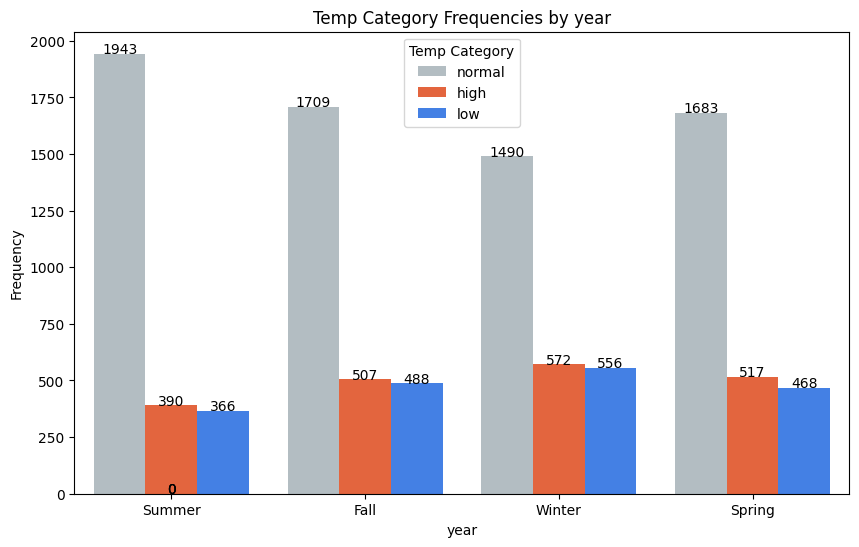

In [71]:
# Define a custom palette for temp_category
temp_category_palette = {
    'normal': '#B0BEC5',  # Neutral gray for normal
    'high': '#FF5722',  # Warm orange for higher temperatures
    'low': '#2979FF'    # Cool blue for lower temperatures
}

# Plot the countplot
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='season', hue='temp_category', data=df, palette=temp_category_palette)

# Add a title and labels
plt.title('Temp Category Frequencies by year')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.legend(title='Temp Category')

# Add counts above each bar
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',  # Text to display (bar height)
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position above bar
        ha='center', va='baseline', fontsize=10, color='black'  # Text properties
    )

# Show the plot
plt.show()

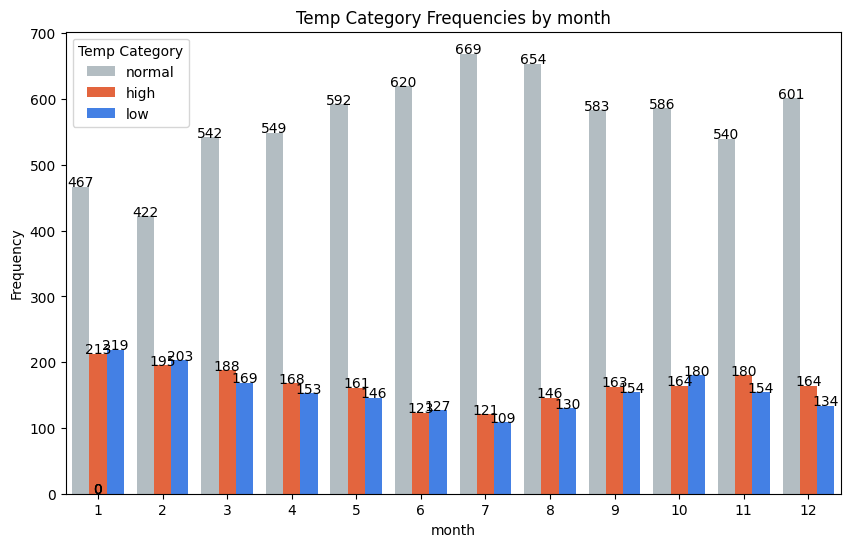

In [72]:
# Define a custom palette for temp_category
temp_category_palette = {
    'normal': '#B0BEC5',  # Neutral gray for normal
    'high': '#FF5722',  # Warm orange for higher temperatures
    'low': '#2979FF'    # Cool blue for lower temperatures
}

# Plot the countplot
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='month', hue='temp_category', data=df, palette=temp_category_palette)

# Add a title and labels
plt.title('Temp Category Frequencies by month')
plt.xlabel('month')
plt.ylabel('Frequency')
plt.legend(title='Temp Category')

# Add counts above each bar
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',  # Text to display (bar height)
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position above bar
        ha='center', va='baseline', fontsize=10, color='black'  # Text properties
    )

# Show the plot
plt.show()


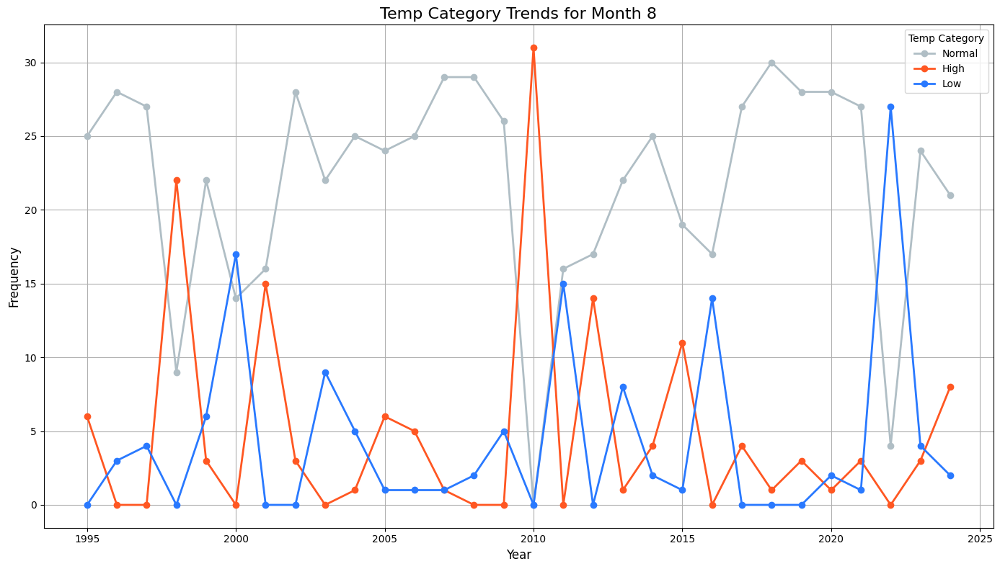

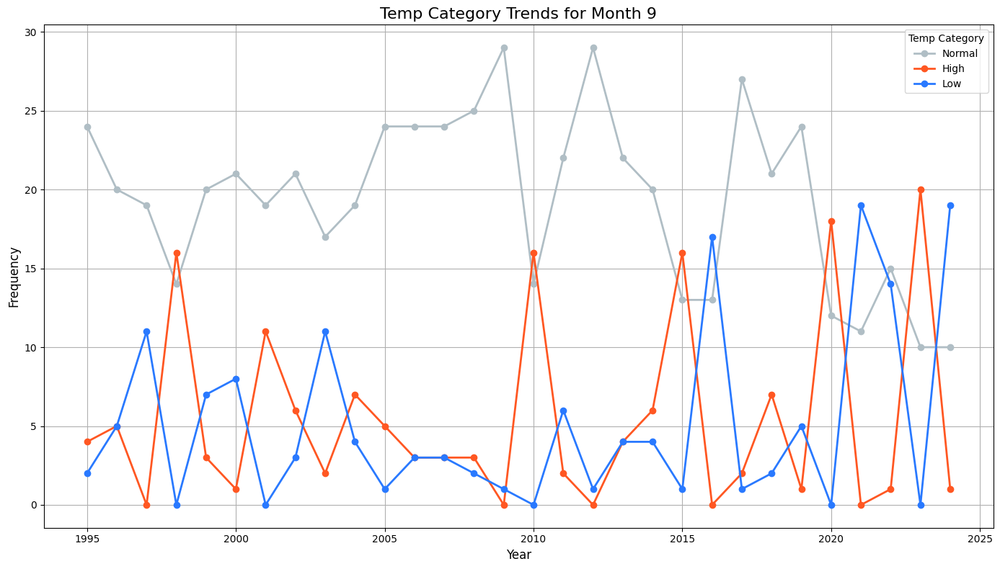

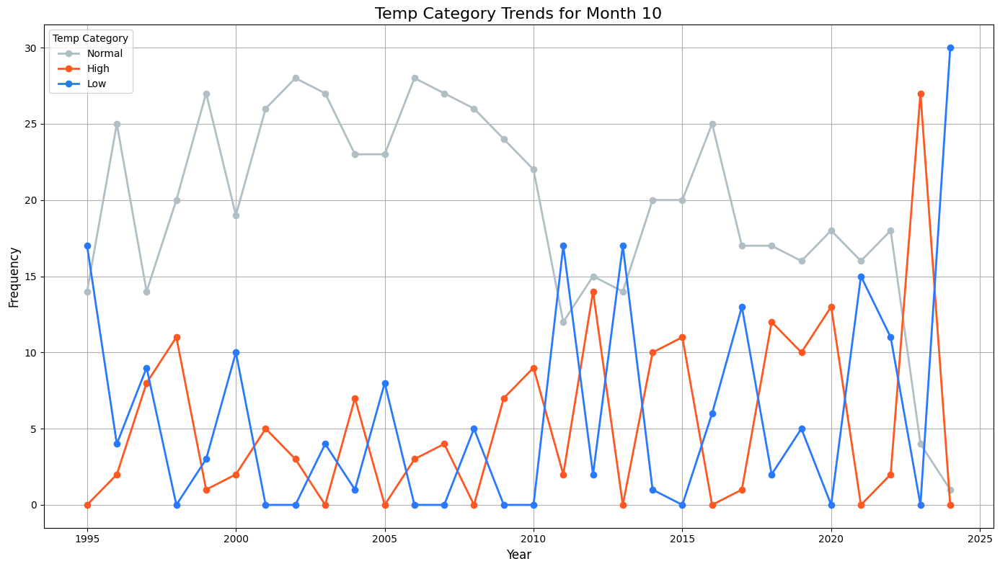

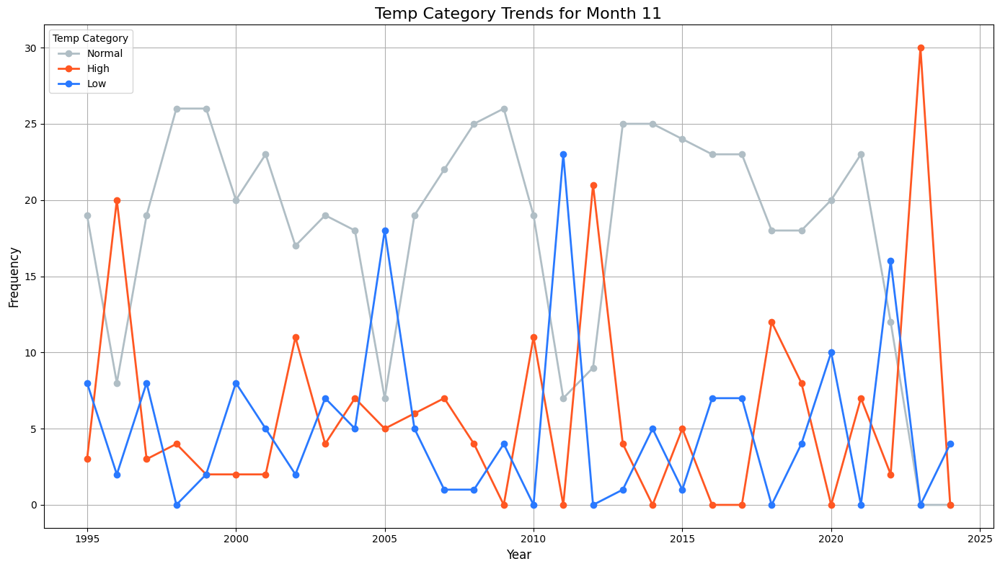

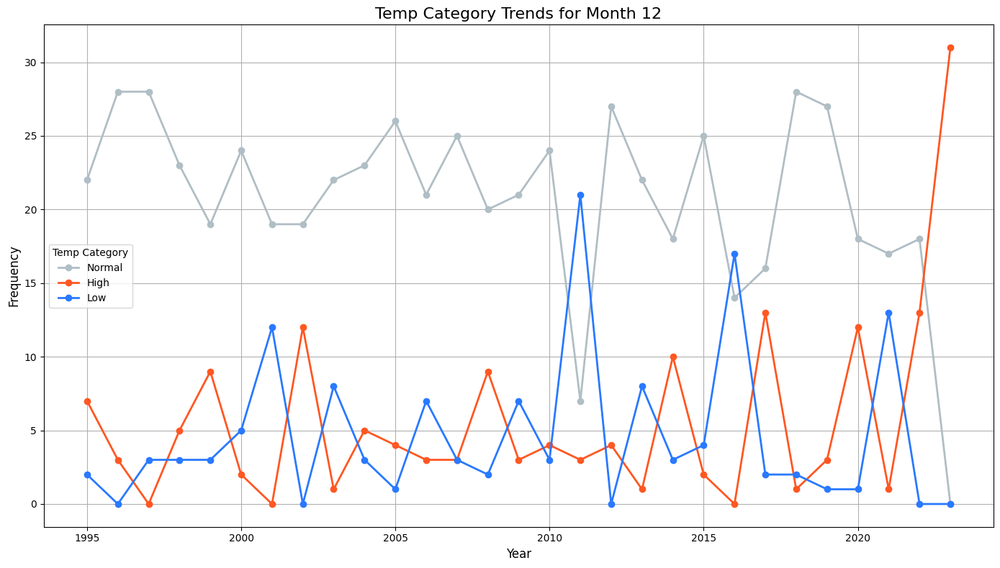

...

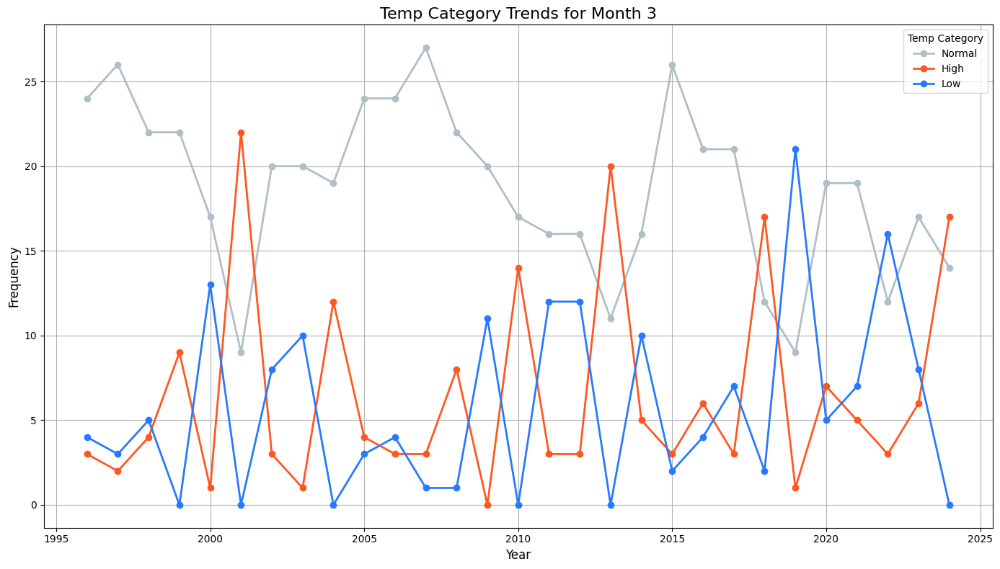

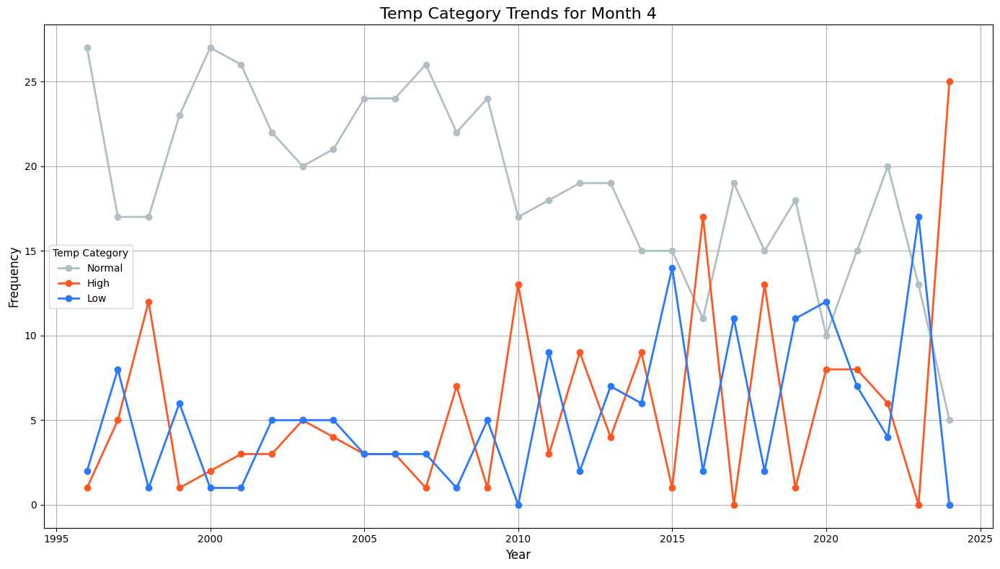

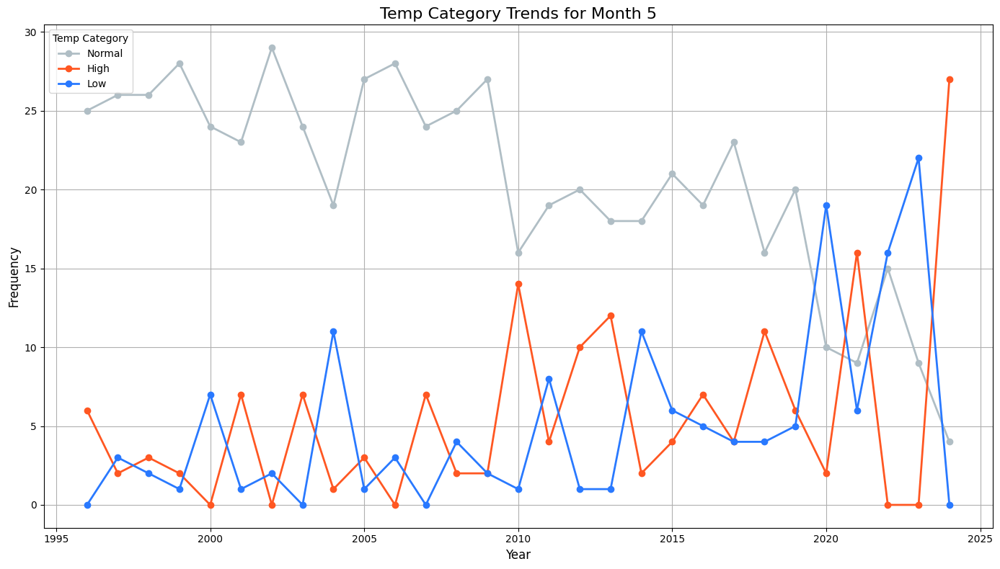

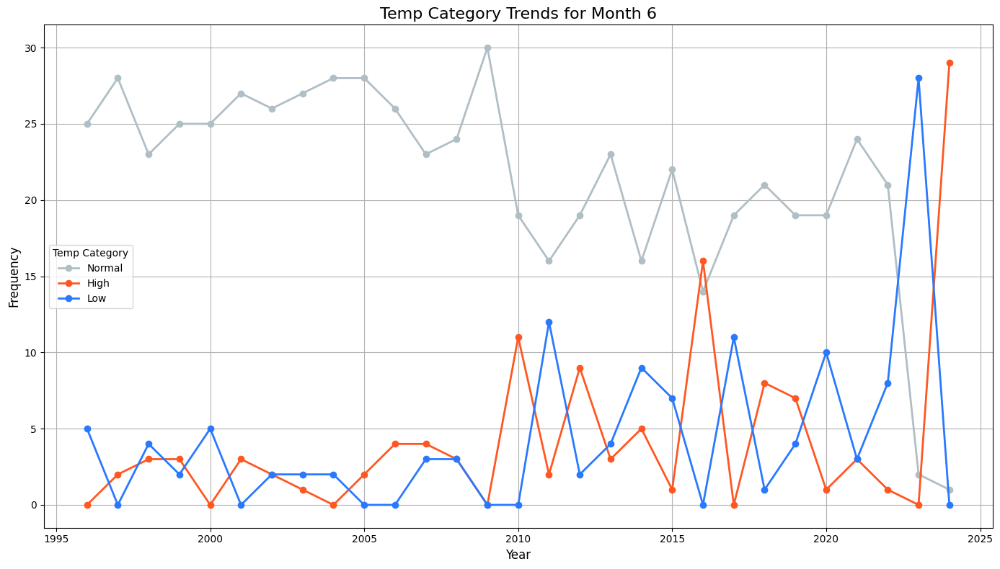

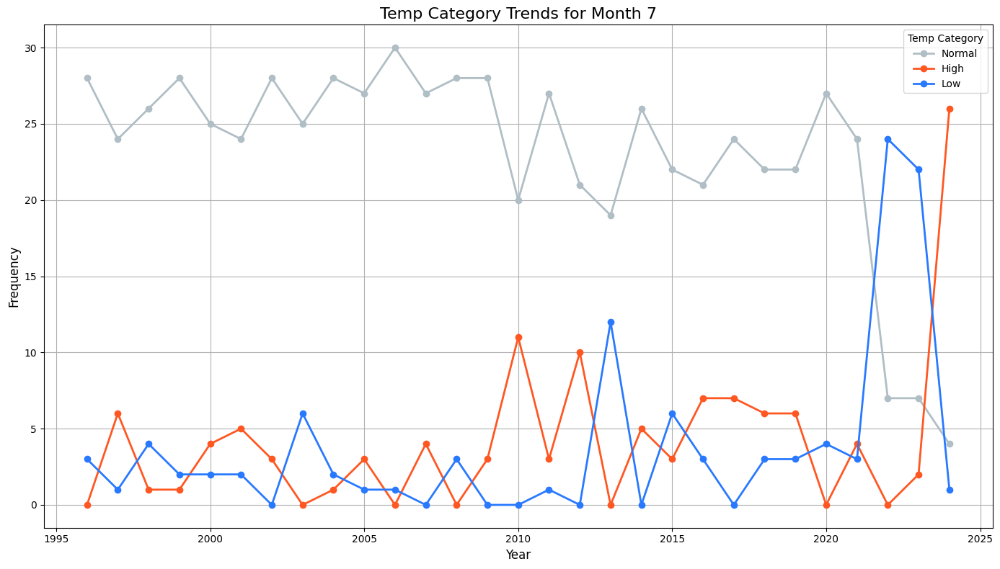

In [73]:

# Define a custom palette for temp_category
temp_category_palette = {
    'normal': '#B0BEC5',  # Neutral gray for normal
    'high': '#FF5722',    # Warm orange for higher temperatures
    'low': '#2979FF'      # Cool blue for lower temperatures
}

# Get unique months
unique_months = df['month'].unique()

# Loop through each month and create a separate plot
for month in unique_months:
    # Filter data for the current month
    monthly_data = df[df['month'] == month]
    
    # Aggregate data for line plot
    line_data = monthly_data.groupby(['year', 'temp_category']).size().reset_index(name='count')
    pivot_line_data = line_data.pivot(index='year', columns='temp_category', values='count').fillna(0)
    
    # Plot the line plot
    plt.figure(figsize=(14, 8))
    for category in ['normal', 'high', 'low']:
        if category in pivot_line_data.columns:
            plt.plot(
                pivot_line_data.index, 
                pivot_line_data[category], 
                marker='o', 
                label=f'{category.capitalize()}', 
                color=temp_category_palette[category],
                linewidth=2
            )
    
    # Add a title and labels
    plt.title(f'Temp Category Trends for Month {month}', fontsize=16)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.legend(title='Temp Category')
    plt.grid(True)
    
    # Show the plot for the current month
    plt.tight_layout()
    plt.show()


In [74]:

# # Define a custom palette for temp_category
# temp_category_palette = {
#     'normal': '#B0BEC5',  # Neutral gray for normal
#     'high': '#FF5722',    # Warm orange for higher temperatures
#     'low': '#2979FF'      # Cool blue for lower temperatures
# }

# # Get unique years
# unique_years = df['year'].unique()

# # Loop through each year and create a separate plot
# for year in unique_years:
#     # Filter data for the current year
#     yearly_data = df[df['year'] == year]
    
#     # Plot the countplot
#     plt.figure(figsize=(14, 8))
#     ax = sns.countplot(x='month', hue='temp_category', data=yearly_data, palette=temp_category_palette)
    
#     # Add a title and labels
#     plt.title(f'Temp Category Frequencies by Month in {year}', fontsize=16)
#     plt.xlabel('Month', fontsize=12)
#     plt.ylabel('Frequency', fontsize=12)
#     plt.legend(title='Temp Category')
    
#     # Add counts above each bar
#     for p in ax.patches:
#         ax.annotate(
#             f'{int(p.get_height())}',  # Text to display (bar height)
#             (p.get_x() + p.get_width() / 2., p.get_height()),  # Position above bar
#             ha='center', va='baseline', fontsize=10, color='black'  # Text properties
#         )
    
#     # Adjust x-axis ticks to show month names
#     ax.set_xticks(range(12))
#     ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
#                         'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    
#     # Show the plot for the current year
#     plt.tight_layout()
#     plt.show()

In [75]:
# Select relevant columns for aggregation
columns_to_aggregate = [
    'tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike', 
    'dew', 'humidity', 'precip', 'precipprob', 'precipcover', 'windspeed', 
    'winddir', 'visibility', 'solarradiation', 'solarenergy', 'uvindex', 
    'prev_year_month_temp_std', 'previous_year_temp', 'temp_change'
]

# Group the data by year and month and aggregate
numerical_aggregations = df.groupby(['year', 'month'])[columns_to_aggregate].mean()

# Handle categorical columns separately
categorical_aggregations = df.groupby(['year', 'month']).agg({
    'conditions': lambda col: col.mode()[0] if not col.mode().empty else None,
    'temp_category': lambda col: col.mode()[0] if not col.mode().empty else None
})

# Combine numerical and categorical aggregations
monthly_data = pd.concat([numerical_aggregations, categorical_aggregations], axis=1).reset_index()



In [76]:
monthly_data.dropna(inplace=True)
print(monthly_data.isna().sum())
print(monthly_data.info())
print(monthly_data.shape)
print(monthly_data[['temp_category']].value_counts())
monthly_data

year                        0
month                       0
tempmax                     0
tempmin                     0
temp                        0
feelslikemax                0
feelslikemin                0
feelslike                   0
dew                         0
humidity                    0
precip                      0
precipprob                  0
precipcover                 0
windspeed                   0
winddir                     0
visibility                  0
solarradiation              0
solarenergy                 0
uvindex                     0
prev_year_month_temp_std    0
previous_year_temp          0
temp_change                 0
conditions                  0
temp_category               0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 352 entries, 0 to 351
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   year                      352 non-null    int

,year,month,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,winddir,visibility,solarradiation,solarenergy,uvindex,prev_year_month_temp_std,previous_year_temp,temp_change,conditions,temp_category
0,1995,8,30.432258,24.577419,27.580645,33.438710,24.577419,29.122581,21.229032,68.954839,...,321.438710,9.851613,321.083871,27.883871,9.483871,1.684401,26.654839,0.925806,Clear,normal
1,1995,9,29.043333,23.246667,26.243333,30.986667,23.246667,27.080000,20.066667,69.750000,...,260.483333,9.676667,327.230000,28.360000,9.600000,1.634209,26.075556,0.167778,Clear,normal
2,1995,10,25.835484,19.948387,22.706452,26.109677,19.948387,22.754839,16.341935,68.319355,...,257.816129,9.838710,245.964516,22.064516,8.064516,2.014450,24.778495,-2.072043,Clear,low
3,1995,11,21.346667,14.543333,17.603333,21.320000,14.543333,17.603333,11.780000,70.140000,...,203.130000,9.733333,207.266667,19.066667,7.333333,2.356186,18.213333,-0.610000,Partially cloudy,normal
4,1995,12,18.945161,12.458065,15.319355,18.945161,12.458065,15.319355,11.270968,77.909677,...,203.806452,8.719355,204.990323,18.890323,7.290323,2.448043,14.198387,1.120968,Partially cloudy,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347,2024,7,38.183871,23.154839,29.316129,40.851613,23.154839,31.409677,21.803226,68.561290,...,285.851613,21.645161,336.132258,27.819355,9.774194,1.886527,25.145161,4.170968,Partially cloudy,high
348,2024,8,37.532258,22.187097,28.770968,39.954839,22.187097,30.561290,21.387097,68.916129,...,313.145161,21.912903,313.261290,25.958065,9.193548,1.684401,27.658065,1.112903,Clear,normal
349,2024,9,35.476667,21.506667,27.373333,36.390000,21.506667,28.196667,19.360000,65.730000,...,295.873333,22.113333,268.306667,22.210000,8.600000,1.634209,29.130000,-1.756667,Partially cloudy,low
350,2024,10,30.922581,17.554839,23.248387,30.519355,17.554839,23.274194,15.464516,65.448387,...,200.225806,22.522581,217.809677,18.041935,7.451613,2.014450,28.012903,-4.764516,Partially cloudy,low


In [77]:
"""
Function to plot temperature changes over a range of years in 5-year batches.

Parameters:
- start_year (int): The starting year of the range
- end_year (int): The ending year of the range
- changes_df (DataFrame): The DataFrame containing temperature data with columns 'year', 'month', 'temp_change', and 'temp_category'

The function:
- Splits the given range of years into 5-year batches
- Plots the temperature change for each batch, highlighting 'High' and 'Low' temperature months
- Uses smooth and visually comfortable colors
"""
def plot_temperature_changes_in_batches(start_year, end_year, changes_df):
    # Split the range of years into 5-year batches
    years_batches = [(y, min(y + 4, end_year)) for y in range(start_year, end_year + 1, 5)]

    # Iterate through each batch of years and create a plot
    for (batch_start_year, batch_end_year) in years_batches:
        # Filter the data for the current batch of years
        batch_data = changes_df[(changes_df['year'] >= batch_start_year) & (changes_df['year'] <= batch_end_year)]

        # Create the plot
        fig, ax = plt.subplots(figsize=(10, 6))

        # Set comfortable colors for high and low temperature changes
        high_color = '#FF5722'  # Light blue color for "High" temperature changes
        low_color = '#2979FF'  # Light red color for "Low" temperature changes

        # Plot bars for "High" temperature months with light blue color
        for _, row in batch_data[batch_data['temp_category'] == 'high'].iterrows():
            ax.bar(row['year'], row['temp_change'], color=high_color, alpha=0.7, width=0.6)
            # Shift the text slightly above the bar to make it clearer
            ax.text(row['year'], row['temp_change'] + 0.2, str(row['month']), ha='center', va='bottom', fontsize=8)

        # Plot bars for "Low" temperature months with light red color
        for _, row in batch_data[batch_data['temp_category'] == 'low'].iterrows():
            ax.bar(row['year'], row['temp_change'], color=low_color, alpha=0.7, width=0.6)
            # Shift the text slightly below the bar to make it clearer
            ax.text(row['year'], row['temp_change'] - 0.2, str(row['month']), ha='center', va='top', fontsize=8)

        # Customize the plot appearance
        ax.set_title(f'Temperature Changes from {batch_start_year} to {batch_end_year}', fontsize=12)
        ax.set_xlabel('Year')
        ax.set_ylabel('Temperature Change')
        ax.axhline(0, color='black', linewidth=0.8)  # Add a horizontal line at y=0
        ax.grid(True, linestyle='--', alpha=0.5)  # Add grid lines for better readability

        # Adjust layout for a better fit
        plt.tight_layout()

        # Display the plot
        plt.show()

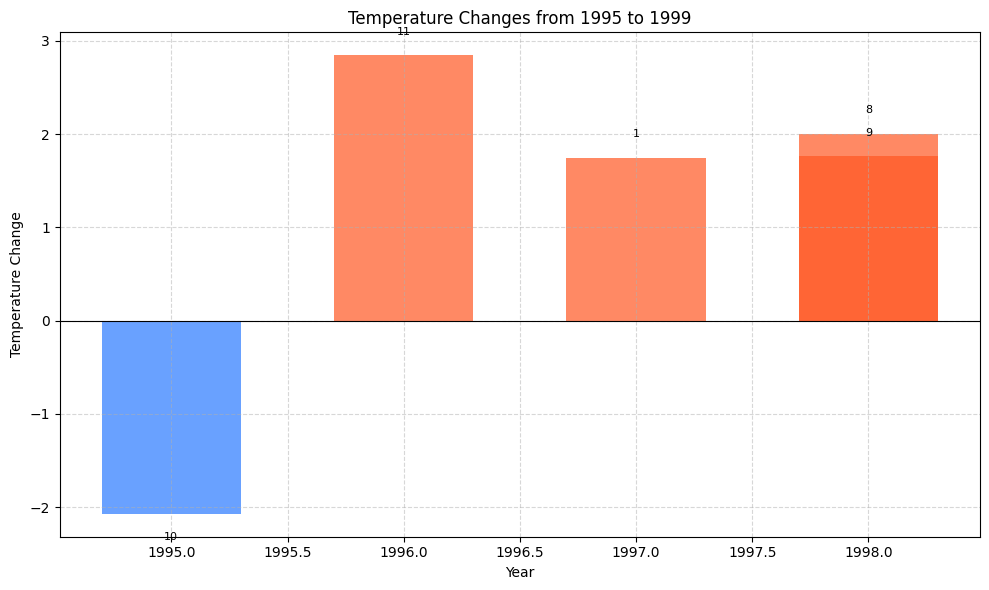

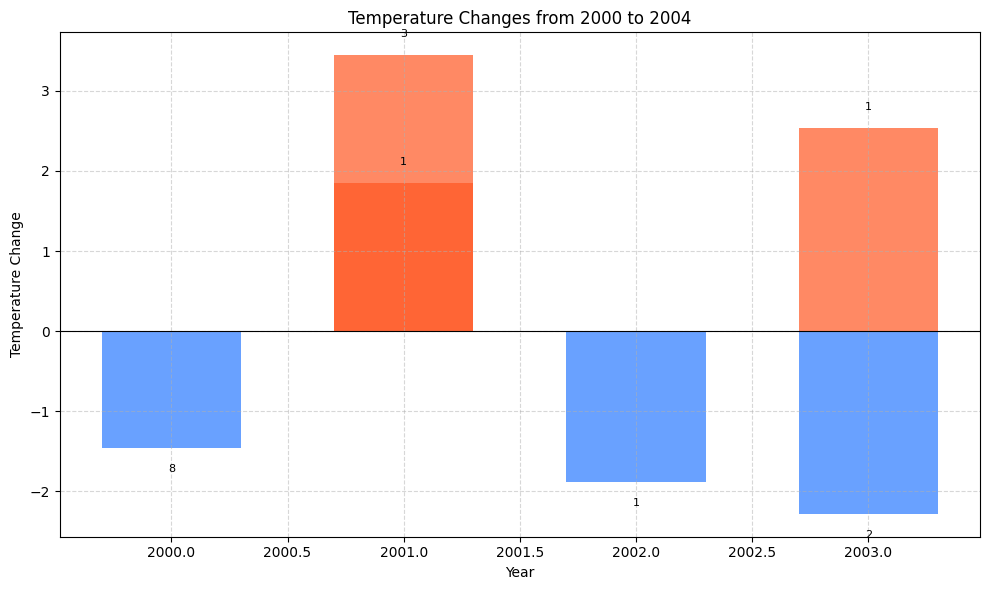

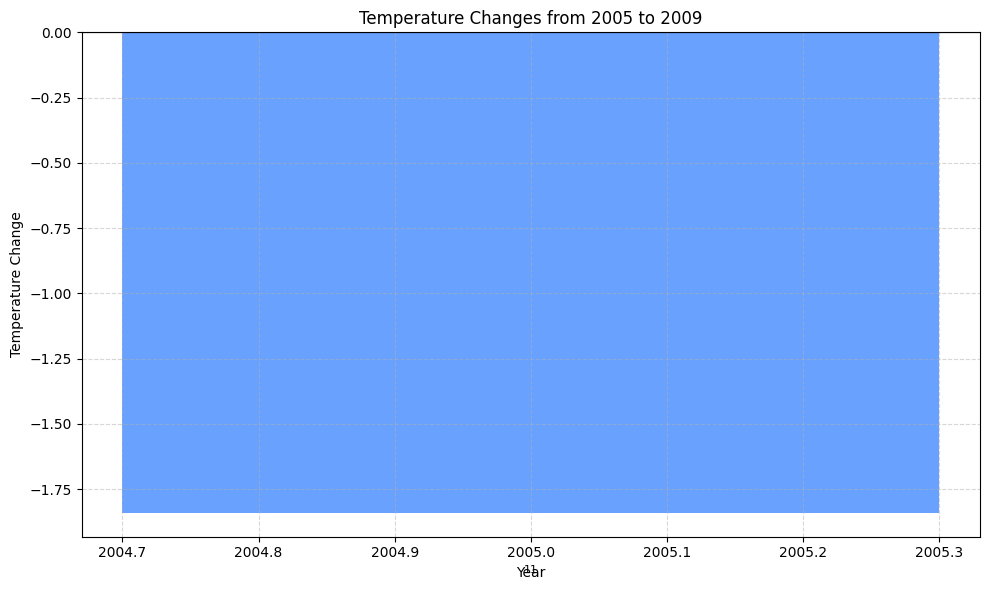

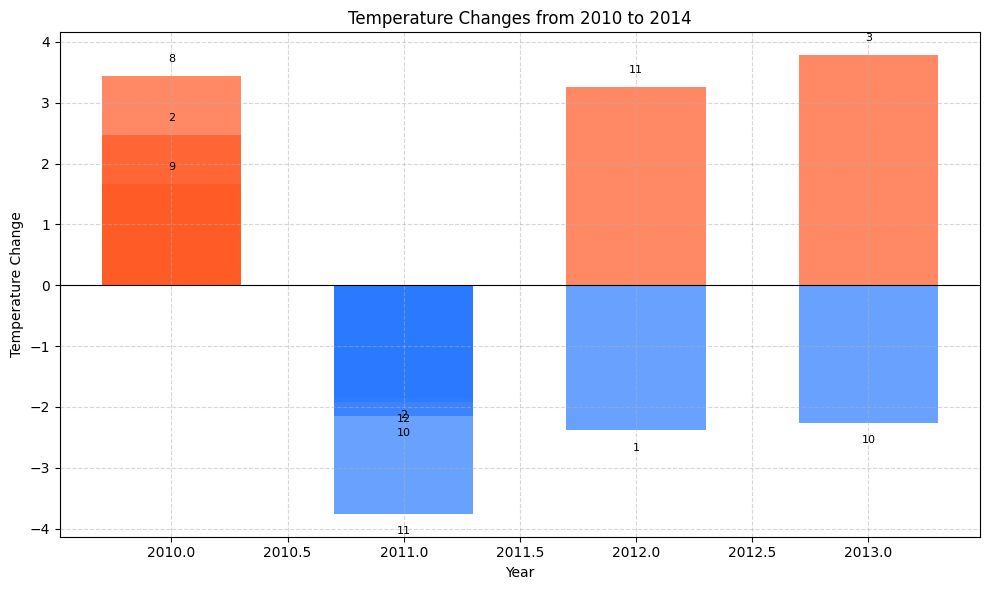

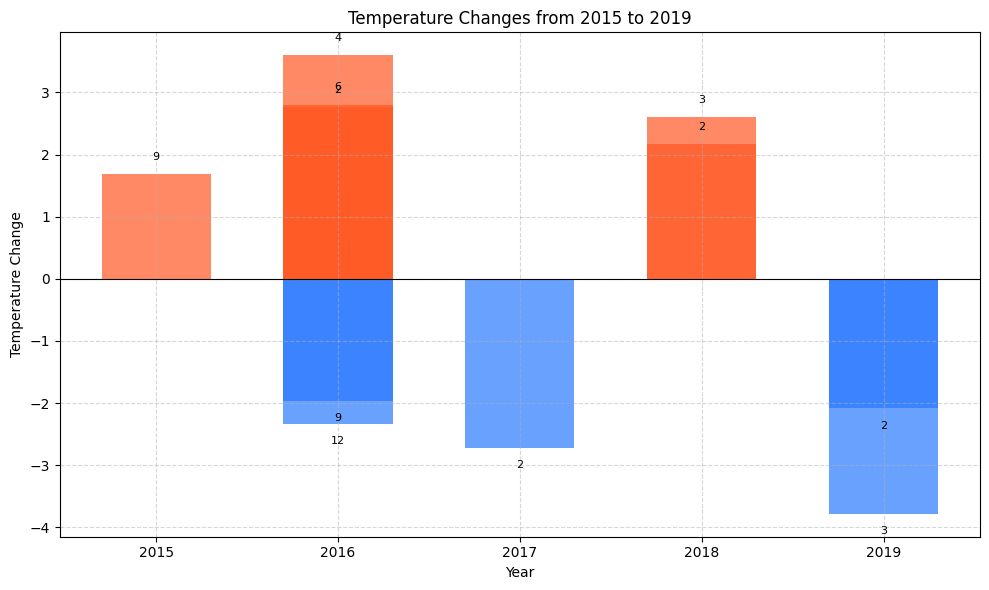

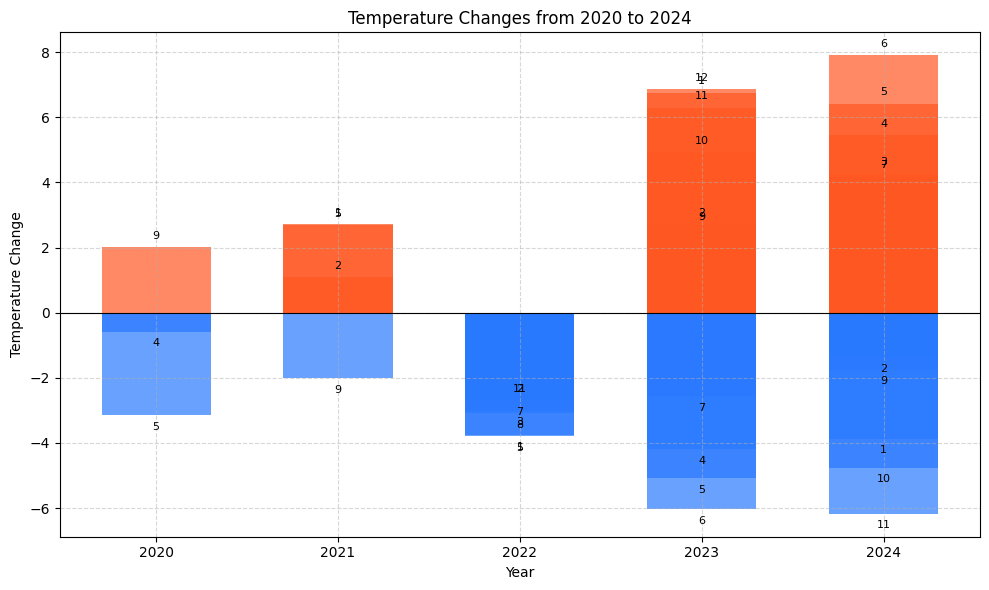

In [78]:
plot_temperature_changes_in_batches(1995, 2024, monthly_data)
# plot_temperature_changes_in_batches(1995, 2024, monthly_data, high_color='dodgerblue', low_color='lightcoral')

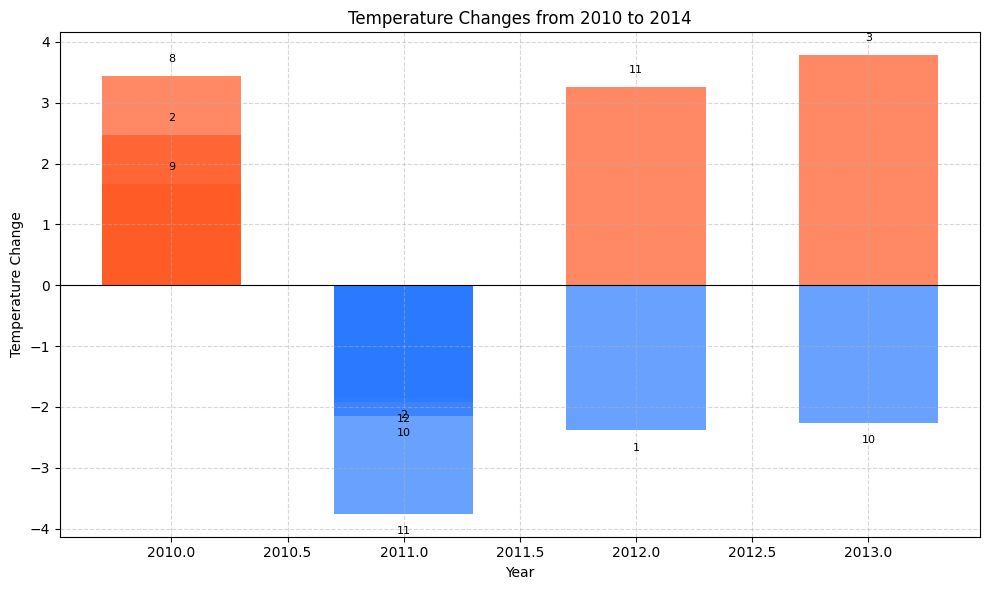

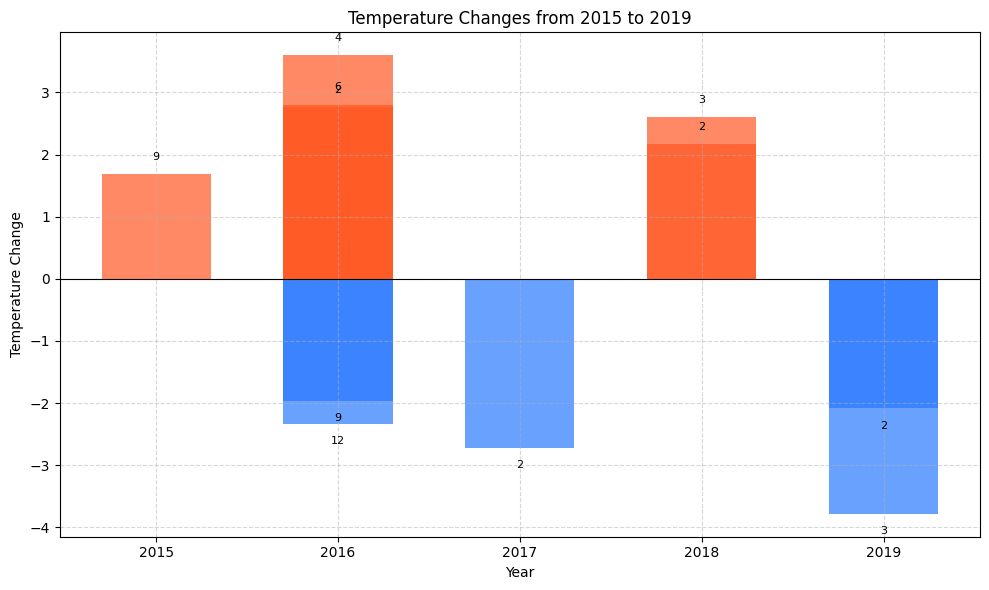

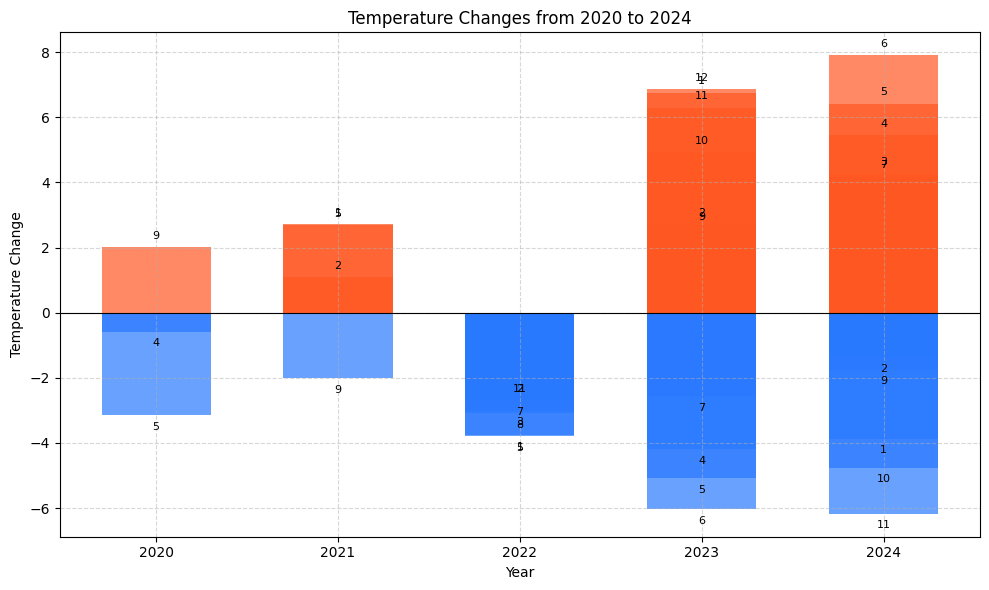

In [79]:
plot_temperature_changes_in_batches(2010, 2024, monthly_data)

In [80]:
"""
Function to plot temperature changes for a given range of years, filtered for each season.

Parameters:
- start_year (int): The starting year of the range
- end_year (int): The ending year of the range
- changes_df (DataFrame): The DataFrame containing temperature data with 'year', 'month', 'temp_change', 'temp_category'
"""
def plot_temperature_changes_by_season(start_year, end_year, changes_df):
    # Define seasons and the corresponding months
    seasons = {
        'Winter': [12, 1, 2],  # December, January, February
        'Spring': [3, 4, 5],   # March, April, May
        'Summer': [6, 7, 8],   # June, July, August
        'Autumn': [9, 10, 11]  # September, October, November
    }

    # Filter data for the specified range of years
    changes_df_filtered = changes_df[(changes_df['year'] >= start_year) & (changes_df['year'] <= end_year)]

    # Loop over each season and create a separate figure for each
    for season, months in seasons.items():
        fig, ax = plt.subplots(figsize=(14, 6))
        
        # Filter data for the current season
        season_data = changes_df_filtered[changes_df_filtered['month'].isin(months)]
        
        # Define the colors for high and low temperature changes
        high_color = '#FF5722'
        low_color = '#2979FF'

        # Loop through each month in the current season
        for i, month in enumerate(months):
            month_data = season_data[season_data['month'] == month]
            
            # X position for the month on the X-axis
            x_pos = i + 1

            # Filter out only 'high' and 'low' temp_category, exclude 'normal'
            high_data = month_data[month_data['temp_category'] == 'high']
            low_data = month_data[month_data['temp_category'] == 'low']

            # Plot high temperature changes
            for j, (index, row) in enumerate(high_data.iterrows()):
                ax.bar(x_pos, row['temp_change'], color=high_color, width=0.6, alpha=0.7)
                ax.text(
                    x_pos, row['temp_change'] + 0.1, str(row['year']),
                    ha='center', va='bottom', fontsize=8
                )

            # Plot low temperature changes
            for j, (index, row) in enumerate(low_data.iterrows()):
                ax.bar(x_pos, row['temp_change'], color=low_color, width=0.6, alpha=0.7)
                ax.text(
                    x_pos, row['temp_change'] - 0.1, str(row['year']),
                    ha='center', va='top', fontsize=8
                )

        # Set labels and title for the season
        ax.set_xticks(range(1, len(months) + 1))
        ax.set_xticklabels([f'Month {month}' for month in months])
        ax.set_xlabel('Month')
        ax.set_ylabel('Temperature Change')
        ax.set_title(f'Temperature Changes in {season} from {start_year} to {end_year}')
        
        # Add grid for clarity
        ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.7)
        
        # Display the plot
        plt.tight_layout()
        plt.show()


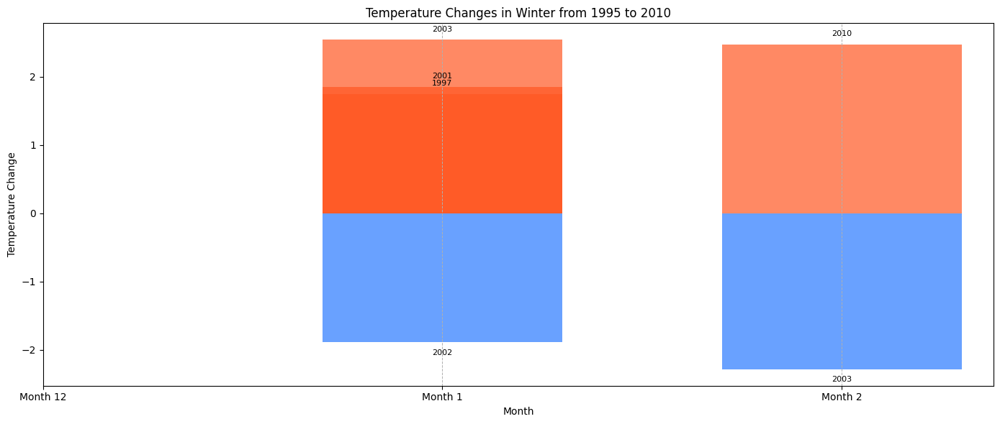

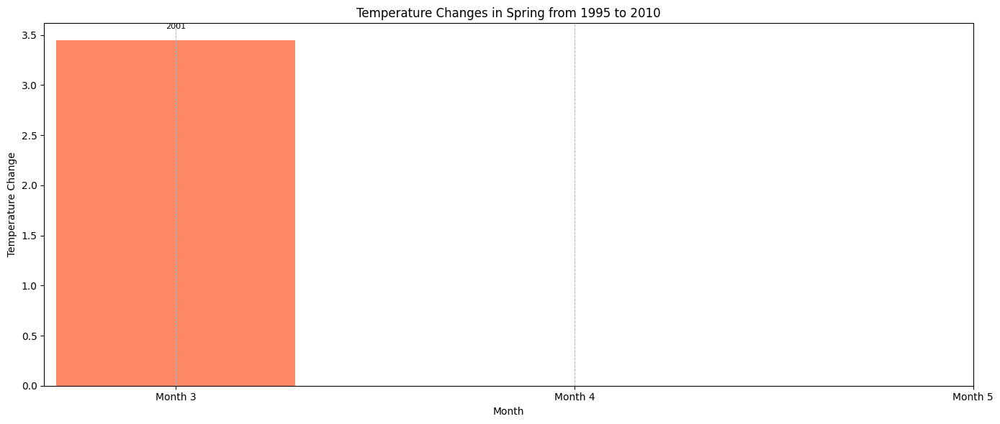

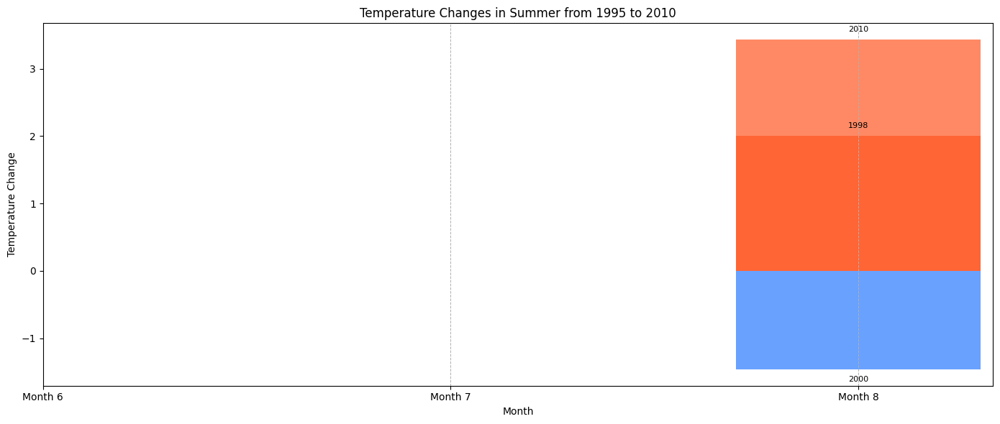

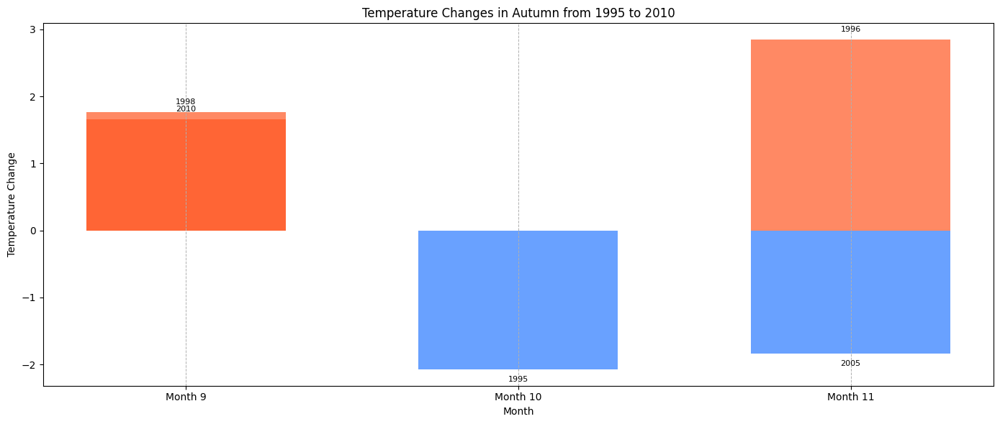

In [81]:
plot_temperature_changes_by_season(1995, 2010, monthly_data)

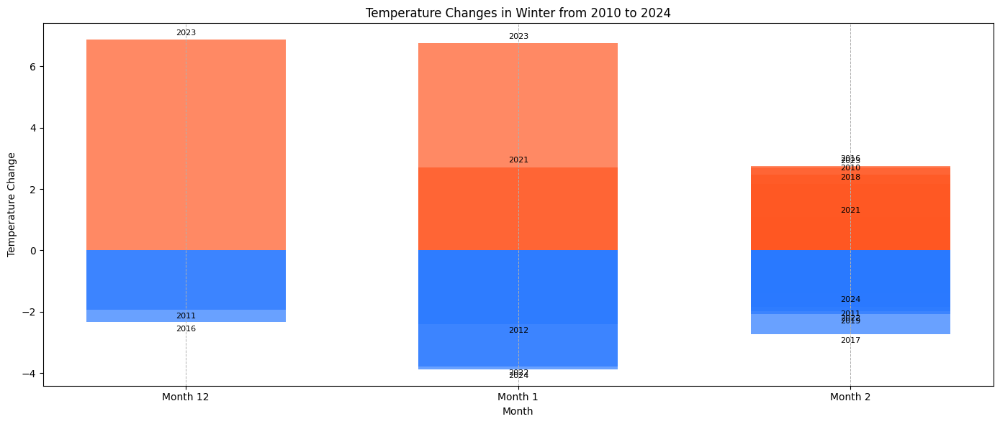

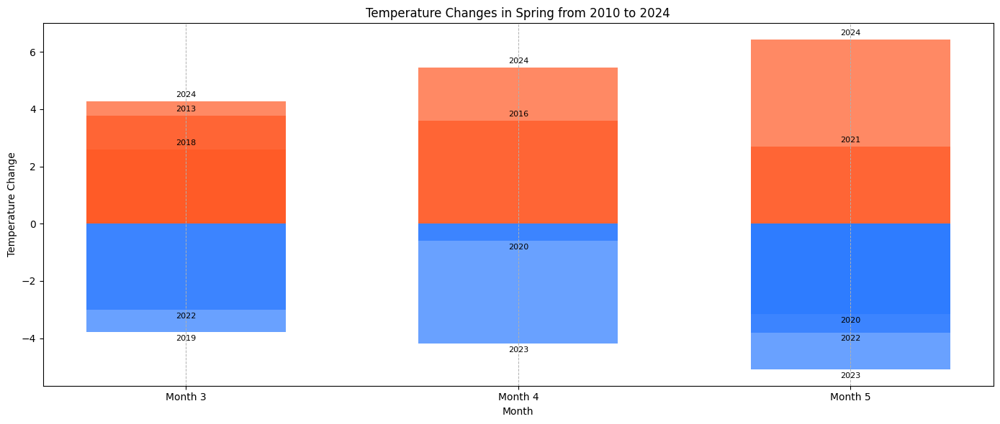

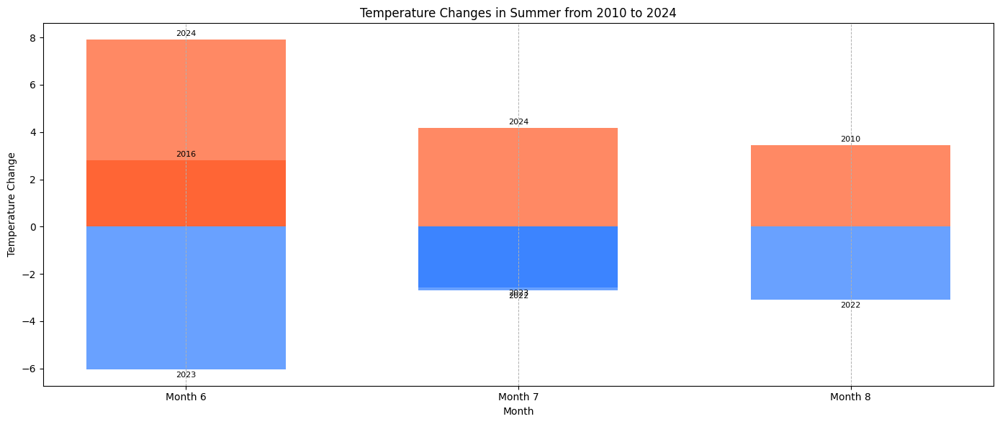

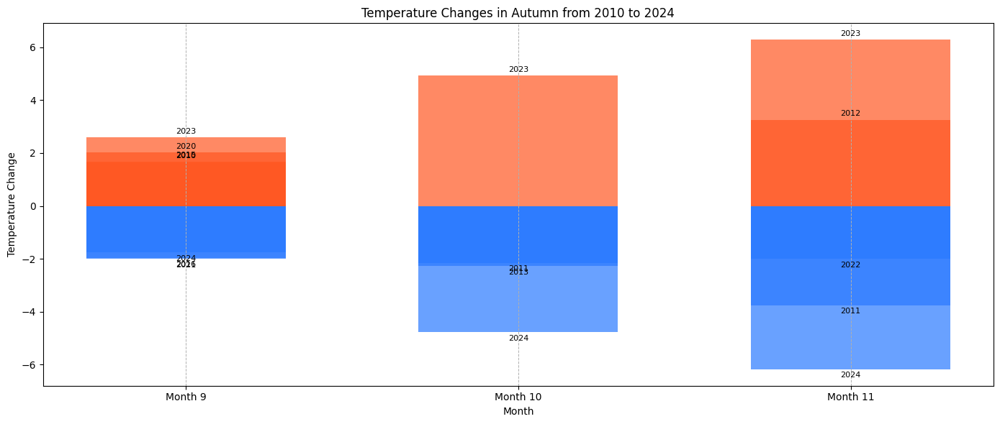

In [82]:
plot_temperature_changes_by_season(2010, 2024, monthly_data)

In [83]:
"""
Function to plot temperature changes by season, filtered for a given range of years.

Parameters:
- start_year (int): The starting year for filtering the data.
- end_year (int): The ending year for filtering the data.
- changes_df (DataFrame): The DataFrame containing temperature data with 'year', 'month', 'temp_change', 'temp_category'.
"""
def plot_temperature_changes_by_season(start_year, end_year, changes_df):
    # Define seasons and the corresponding months
    seasons = {
        'Winter': [12, 1, 2],  # December, January, February
        'Spring': [3, 4, 5],   # March, April, May
        'Summer': [6, 7, 8],   # June, July, August
        'Autumn': [9, 10, 11]  # September, October, November
    }

    # Filter the data based on the specified years
    changes_df_filtered = changes_df[(changes_df['year'] >= start_year) & (changes_df['year'] <= end_year)]

    # Prepare figure for plotting
    fig, ax = plt.subplots(figsize=(10, 6))

    # Loop over each season and calculate the necessary data
    for i, (season, months) in enumerate(seasons.items()):
        # Filter data for the current season
        season_data = changes_df_filtered[changes_df_filtered['month'].isin(months)]
        
        # Count the number of high and low changes for the current season
        high_count = season_data[season_data['temp_category'] == 'high']['year'].nunique()
        low_count = season_data[season_data['temp_category'] == 'low']['year'].nunique()
        
        # Calculate the average change for high and low
        high_avg_change = season_data[season_data['temp_category'] == 'high']['temp_change'].mean() if high_count > 0 else 0
        low_avg_change = season_data[season_data['temp_category'] == 'low']['temp_change'].mean() if low_count > 0 else 0
        
        # Plot a bar for high changes (number of years) and add the average change on top
        ax.bar(i + 1 - 0.2, high_count, width=0.4, color='#FF5722', label='High Changes' if i == 0 else "")
        ax.text(i + 1 - 0.2, high_count + 0.2, f"{high_count} years", ha='center', va='bottom', fontsize=9, rotation=10)
        ax.text(i + 1 - 0.2, high_count + 0.6, f"Avg: {high_avg_change:.2f}", ha='center', va='bottom', fontsize=8, color='black', rotation=10)
        
        # Plot a bar for low changes (number of years) and add the average change on top
        ax.bar(i + 1 + 0.2, low_count, width=0.4, color='#2979FF', label='Low Changes' if i == 0 else "")
        ax.text(i + 1 + 0.2, low_count + 0.2, f"{low_count} years", ha='center', va='bottom', fontsize=9, rotation=10)
        ax.text(i + 1 + 0.2, low_count + 0.6, f"Avg: {low_avg_change:.2f}", ha='center', va='bottom', fontsize=8, color='black', rotation=10)

    # Set labels and title for the season
    ax.set_xticks(range(1, len(seasons) + 1))
    ax.set_xticklabels(seasons.keys())
    ax.set_xlabel('Season')
    ax.set_ylabel('Number of Years / Avg Change')
    ax.set_title(f'Temperature Changes by Season ({start_year} - {end_year})')

    # Add legend
    ax.legend()

    # Add grid for clarity
    ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.7)

    # Display the plot
    plt.tight_layout()
    plt.show()



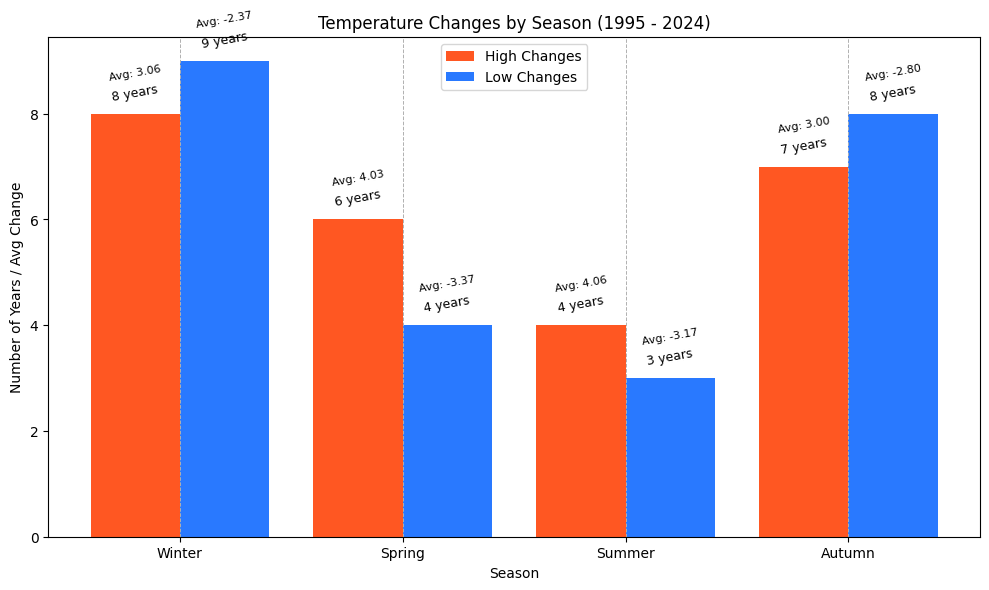

In [84]:
# Example usage with your DataFrame and desired year range
plot_temperature_changes_by_season(1995, 2024,  monthly_data)

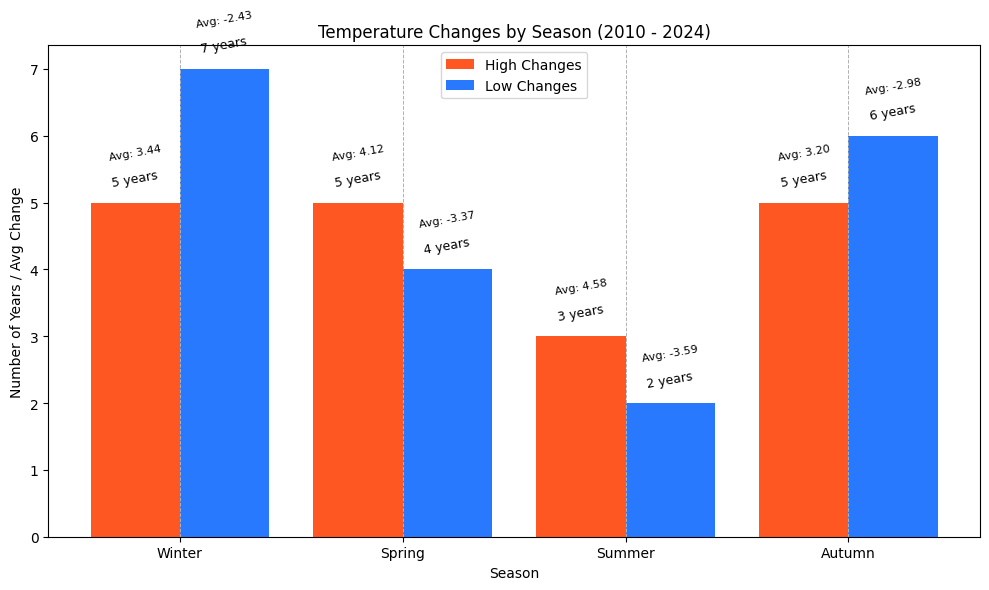

In [85]:
# Example usage with your DataFrame and desired year range
plot_temperature_changes_by_season(2010, 2024,  monthly_data)

In [86]:
"""
This function plots the temperature changes for each season, filtered by a given range of years.

Parameters:
- start_year (int): The starting year for filtering the data.
- end_year (int): The ending year for filtering the data.
- changes_df (DataFrame): The DataFrame containing temperature data with 'year', 'month', 'temp_change', 'temp_category'.
"""
def plot_temperature_changes_per_season(start_year, end_year, changes_df):

    # Define seasons and the corresponding months
    seasons = {
        'Winter': [12, 1, 2],  # December, January, February
        'Spring': [3, 4, 5],   # March, April, May
        'Summer': [6, 7, 8],   # June, July, August
        'Autumn': [9, 10, 11]  # September, October, November
    }

    # Filter the data based on the specified years
    changes_df_filtered = changes_df[(changes_df['year'] >= start_year) & (changes_df['year'] <= end_year)]

    # Loop over each season and create a separate figure for each
    for season, months in seasons.items():
        fig, ax = plt.subplots(figsize=(10, 6))
        
        # Filter data for the current season
        season_data = changes_df_filtered[changes_df_filtered['month'].isin(months)]
        
        # Loop through each month in the current season
        for i, month in enumerate(months):
            month_data = season_data[season_data['month'] == month]
            
            # Count the number of high and low changes for the current month
            high_count = month_data[month_data['temp_category'] == 'high']['year'].nunique()
            low_count = month_data[month_data['temp_category'] == 'low']['year'].nunique()
            
            # Calculate the average change for high and low
            high_avg_change = month_data[month_data['temp_category'] == 'high']['temp_change'].mean() if high_count > 0 else 0
            low_avg_change = month_data[month_data['temp_category'] == 'low']['temp_change'].mean() if low_count > 0 else 0
            
            # Plot a bar for high changes (number of years) and add the average change on top
            ax.bar(i + 1 - 0.2, high_count, width=0.4, color='#FF5722', label='High Changes' if i == 0 else "")
            ax.text(i + 1 - 0.2, high_count + 0.1, f"{high_count} years", ha='center', va='bottom', fontsize=10)
            ax.text(i + 1 - 0.2, high_count + 0.5, f"Avg: {high_avg_change:.2f}", ha='center', va='bottom', fontsize=8, color='black')
            
            # Plot a bar for low changes (number of years) and add the average change on top
            ax.bar(i + 1 + 0.2, low_count, width=0.4, color='#2979FF', label='Low Changes' if i == 0 else "")
            ax.text(i + 1 + 0.2, low_count + 0.1, f"{low_count} years", ha='center', va='bottom', fontsize=10)
            ax.text(i + 1 + 0.2, low_count + 0.5, f"Avg: {low_avg_change:.2f}", ha='center', va='bottom', fontsize=8, color='black')

        # Set labels and title for the season
        ax.set_xticks(range(1, len(months) + 1))
        ax.set_xticklabels([f'Month {month}' for month in months])
        ax.set_xlabel('Month')
        ax.set_ylabel('Number of Years / Avg Change')
        ax.set_title(f'Temperature Changes in {season} from {start_year} to {end_year}')
        
        # Add legend
        ax.legend()
        
        # Add grid for clarity
        ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.7)
        
        # Display the plot
        plt.tight_layout()
        plt.show()

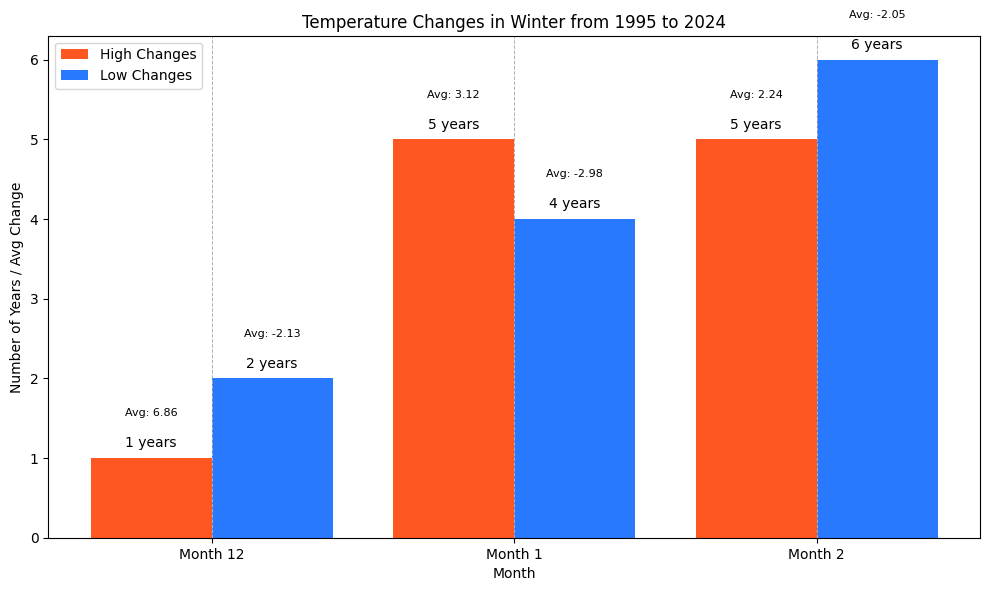

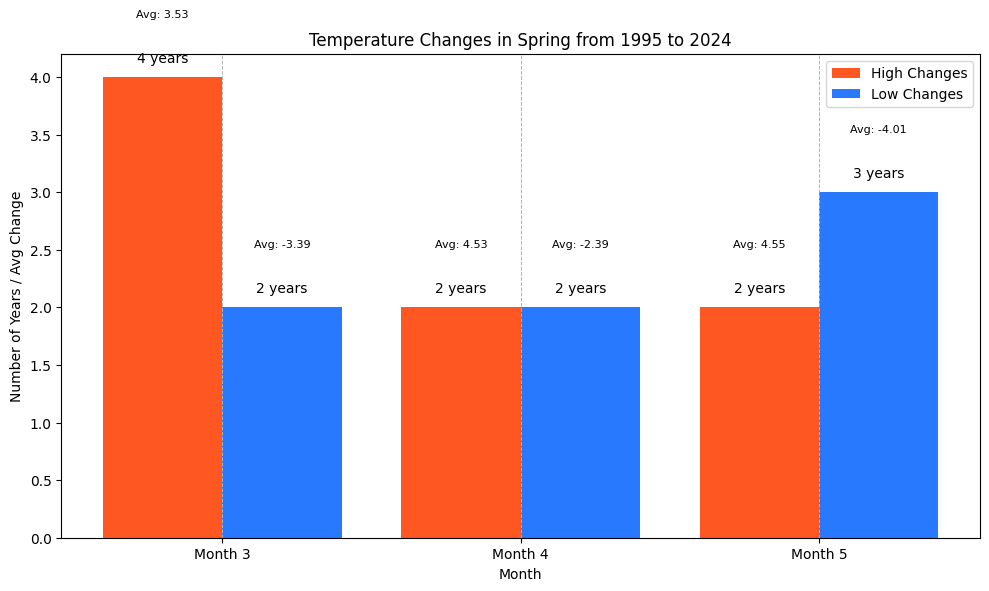

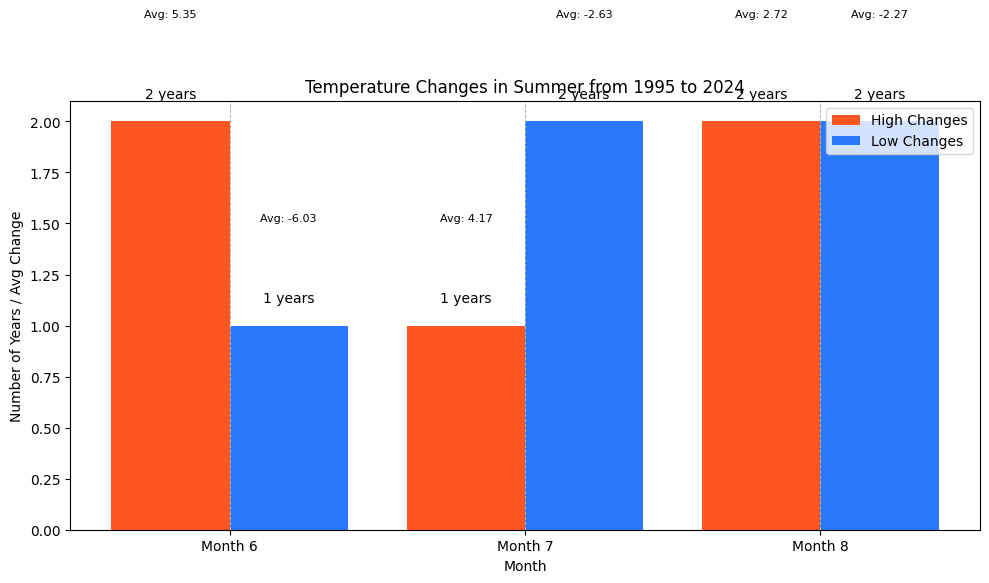

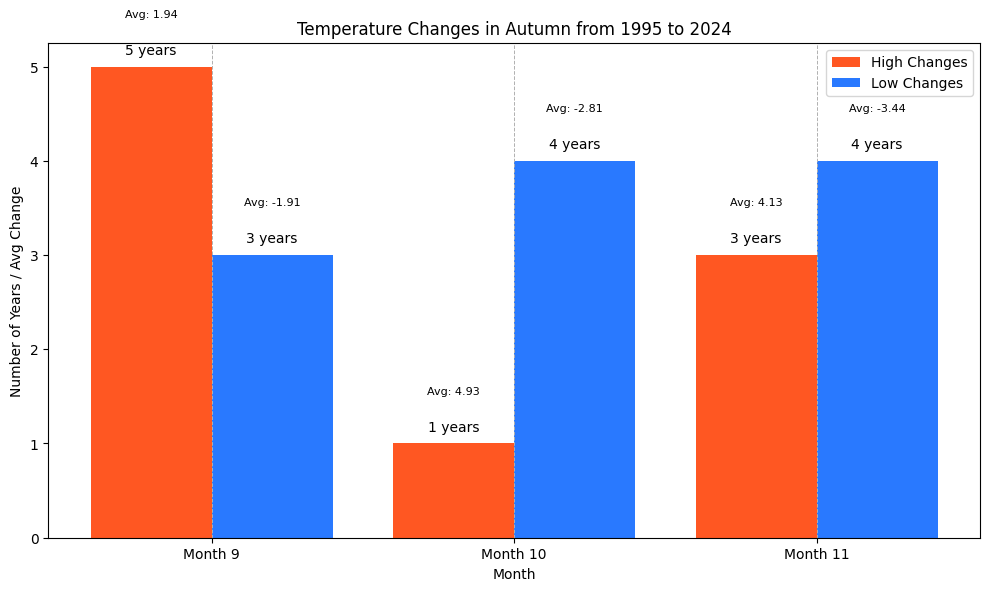

In [87]:
# Example usage with your DataFrame and desired year range
plot_temperature_changes_per_season(1995, 2024, monthly_data)

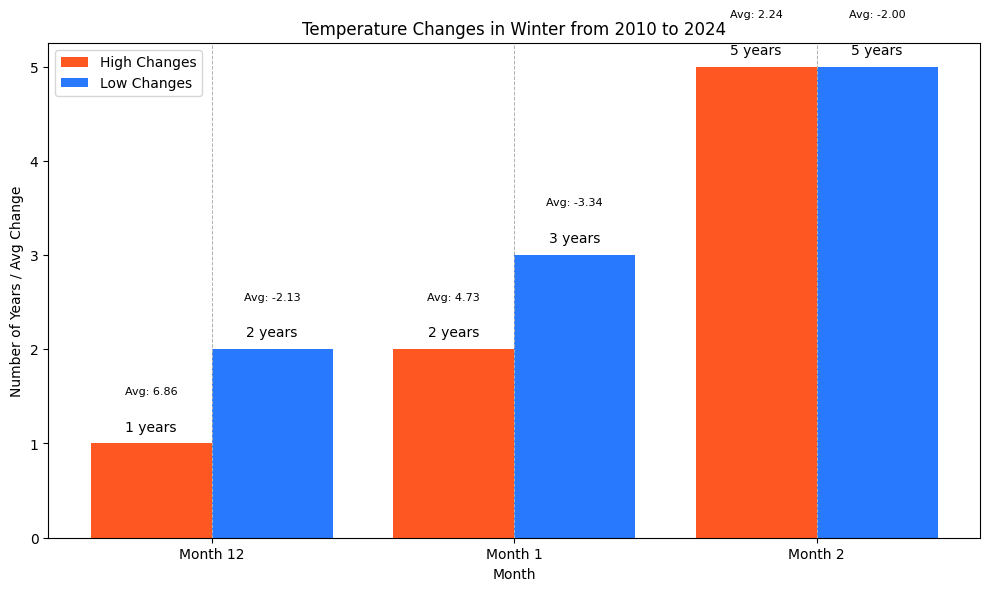

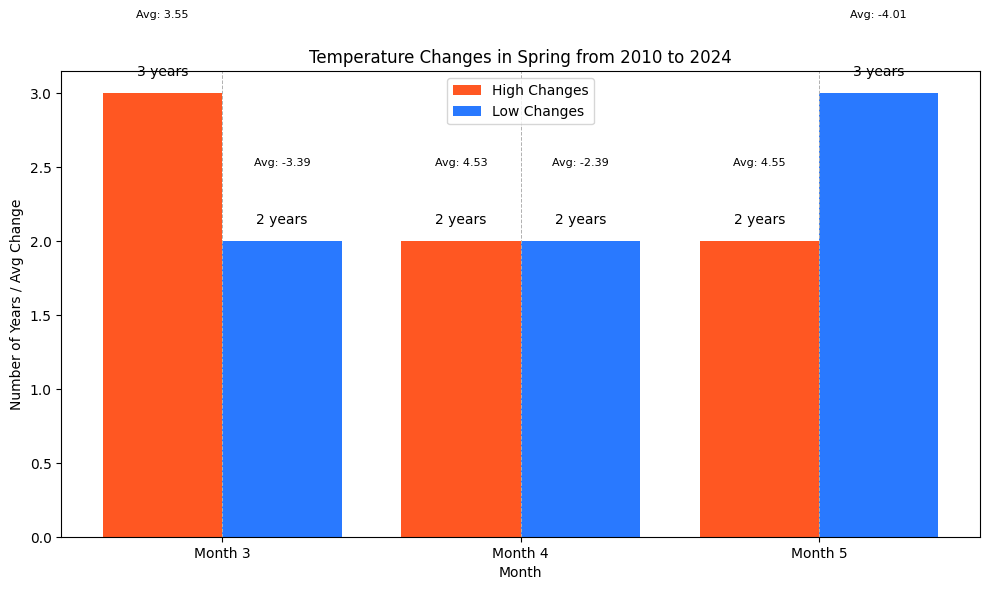

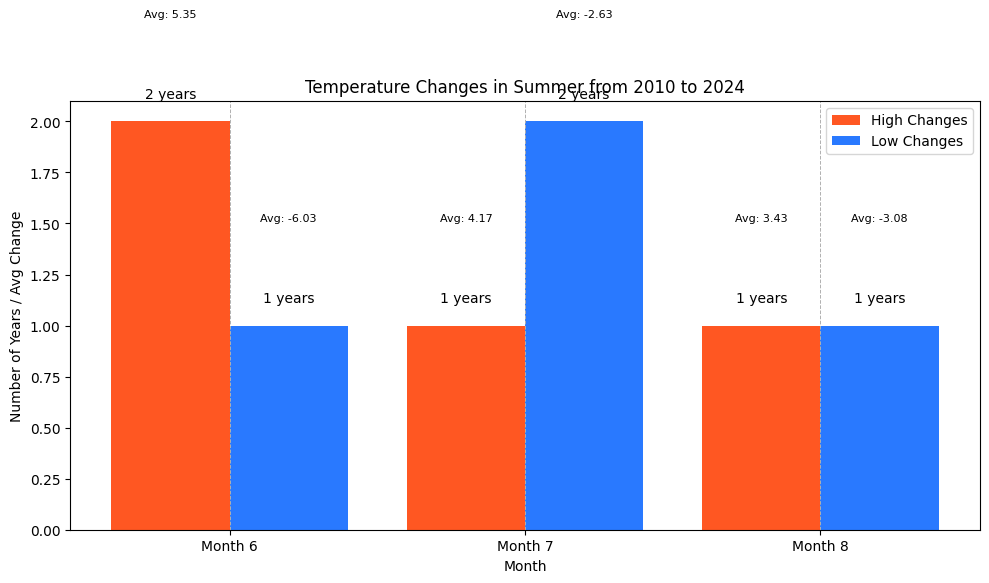

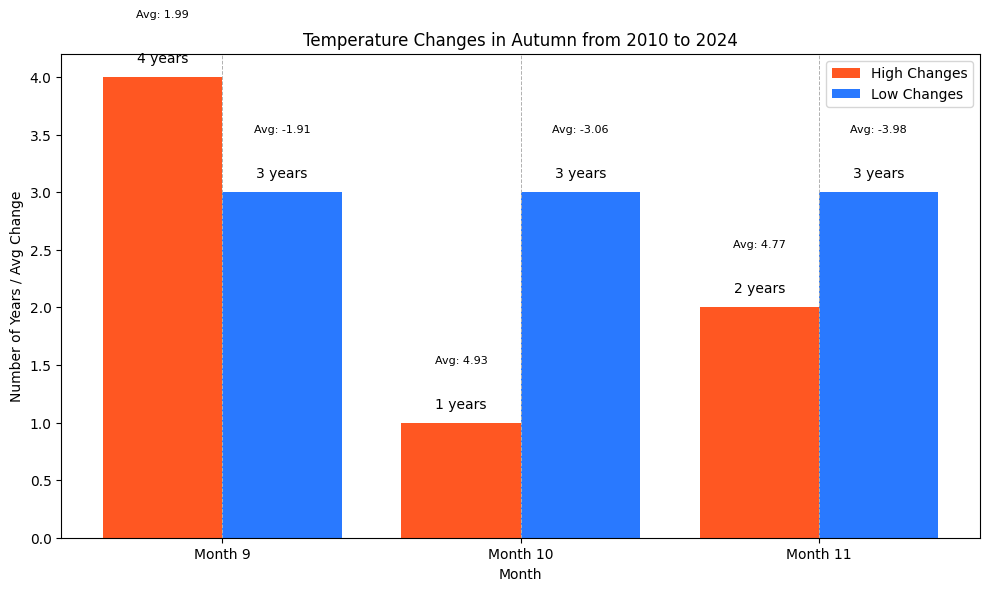

In [88]:
plot_temperature_changes_per_season(2010, 2024, monthly_data)


In [111]:
df.columns

Index(['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin',
       'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'moonphase', 'conditions',
       'year', 'month', 'week_number', 'day', 'season', 'temp_range',
       'temp_7d_avg', 'temp_30d_avg', 'humidity_7d_avg', 'precip_7d_avg',
       'solarradiation_7d_avg', 'uvindex_7d_avg', 'wind_30d_avg',
       'previous_year_temp', 'temp_change', 'prev_year_month_temp_std',
       'temp_category'],
      dtype='object')

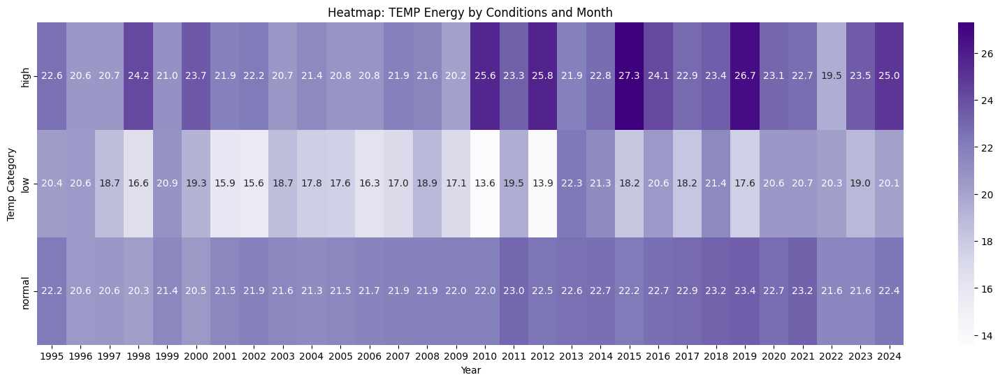

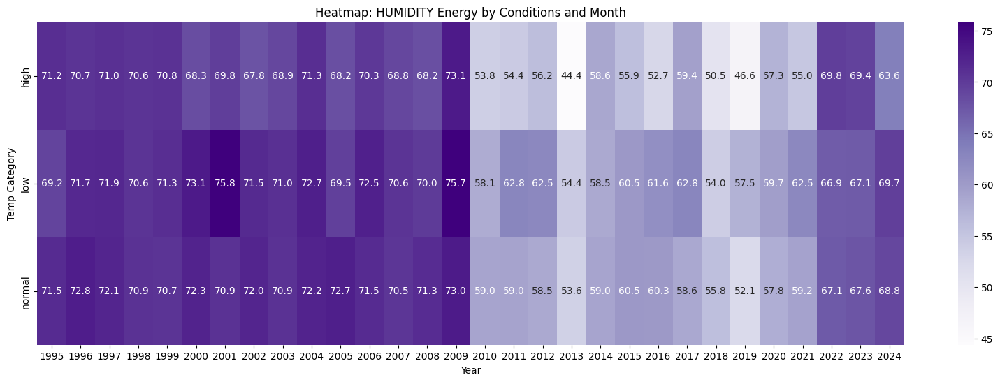

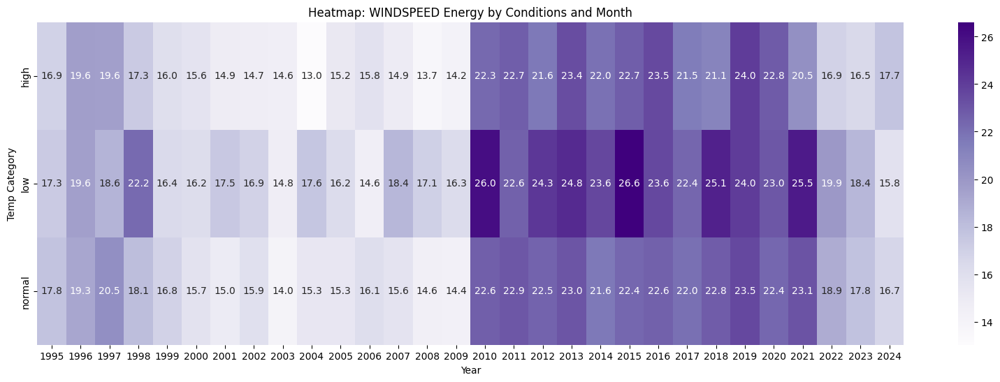

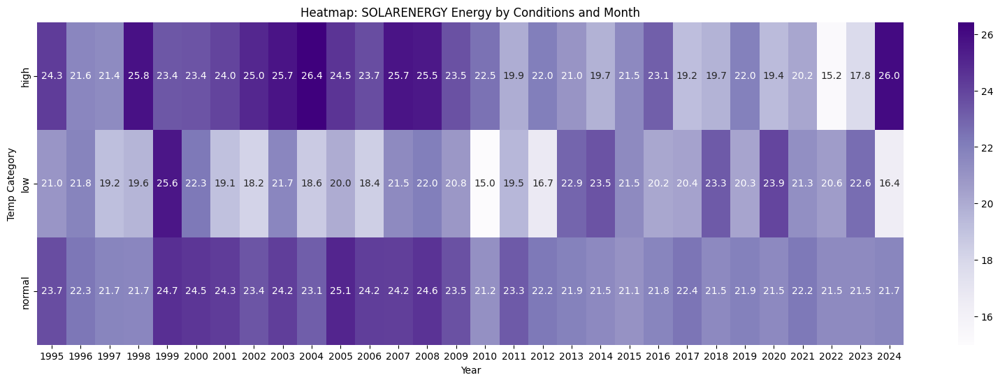

In [112]:
dscolumns = ['temp','humidity','windspeed','solarenergy']
for c in dscolumns:
    # Create a pivot table for the heatmap
    heatmap_data = df.pivot_table(index='temp_category', columns='year', values= c , aggfunc='mean')
    plt.figure(figsize=(20, 6))
    sns.heatmap(heatmap_data, cmap='Purples', annot=True, fmt=".1f")
    plt.title(f'Heatmap: {str.upper(c)} Energy by Temp Category and Year')
    plt.xlabel('Year')
    plt.ylabel('Temp Category')
    plt.show()

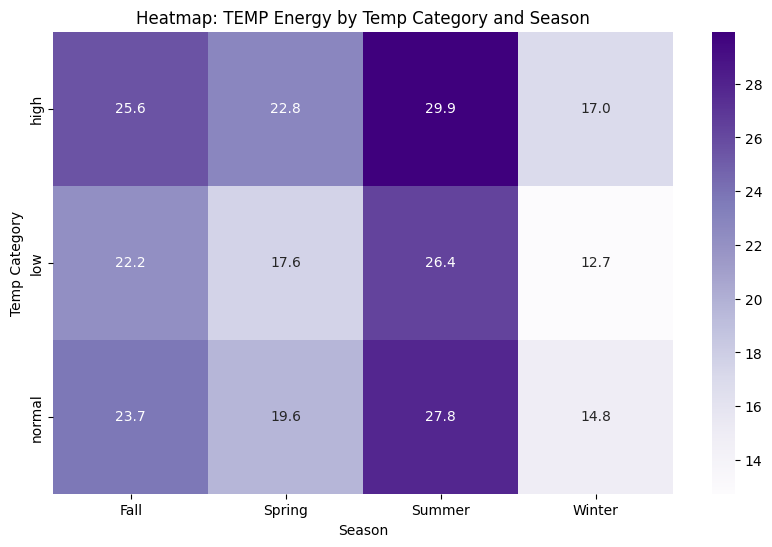

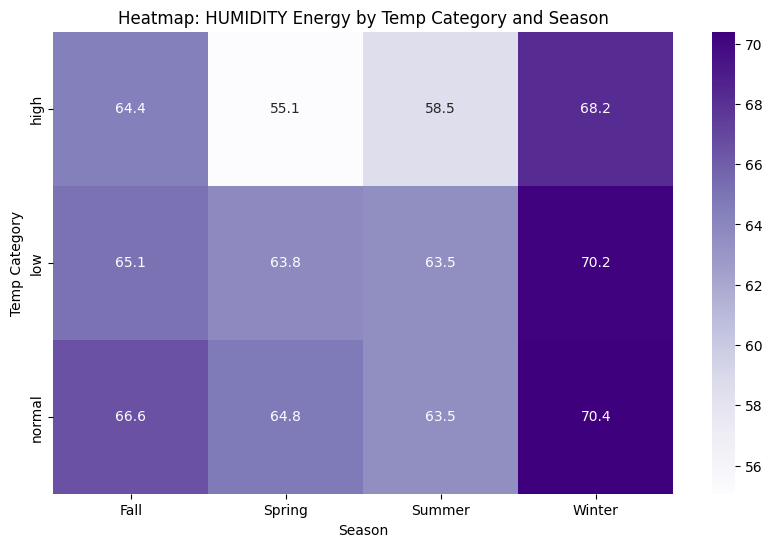

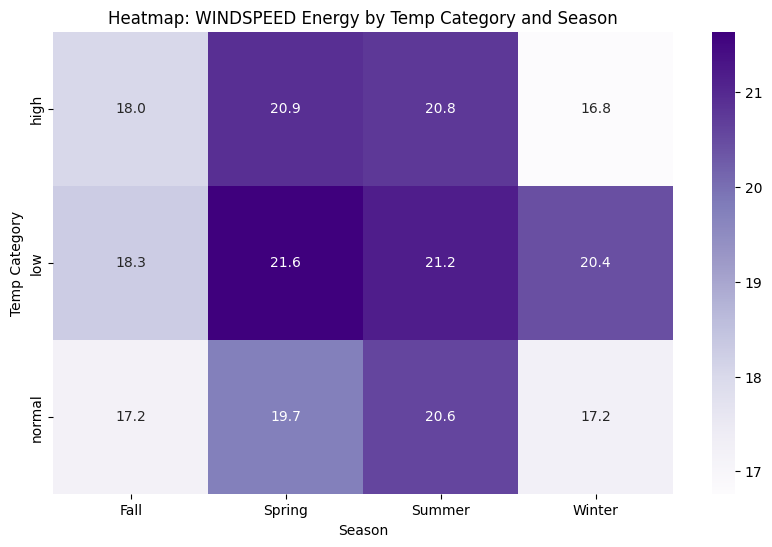

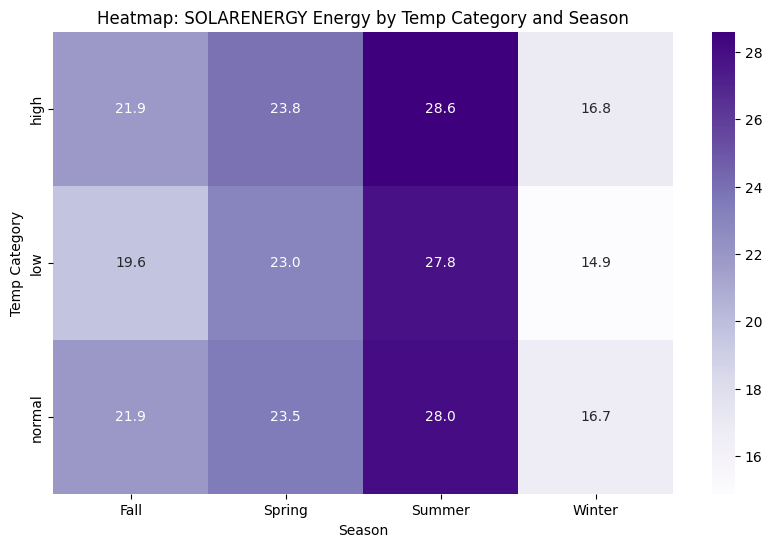

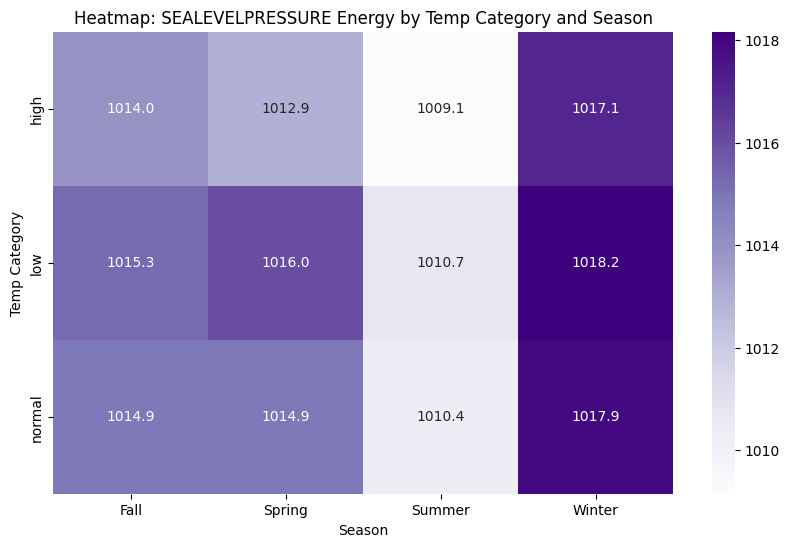

In [113]:
dscolumns = ['temp','humidity','windspeed','solarenergy','sealevelpressure']
for c in dscolumns:
    # Create a pivot table for the heatmap
    heatmap_data = df.pivot_table(index='temp_category', columns='season', values= c , aggfunc='mean')
    plt.figure(figsize=(10, 6))
    sns.heatmap(heatmap_data, cmap='Purples', annot=True, fmt=".1f")
    plt.title(f'Heatmap: {str.upper(c)} Energy by Temp Category and Season')
    plt.xlabel('Season')
    plt.ylabel('Temp Category')
    plt.show()

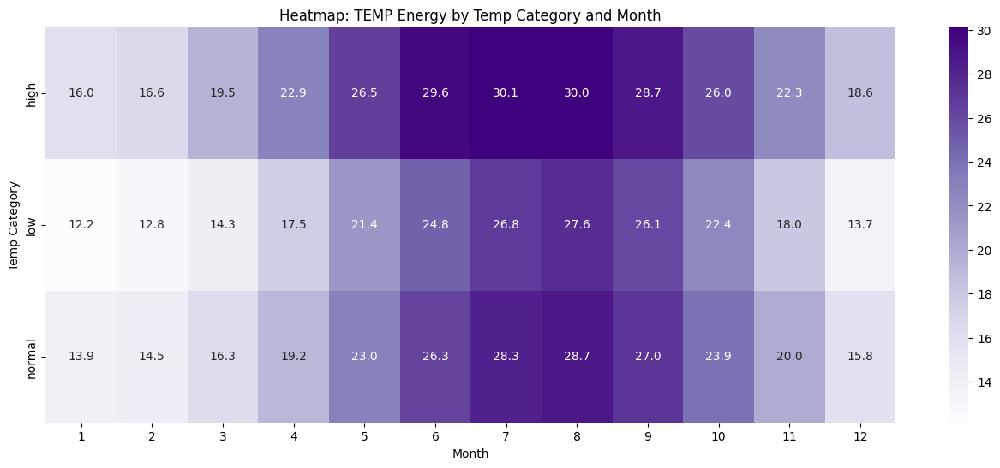

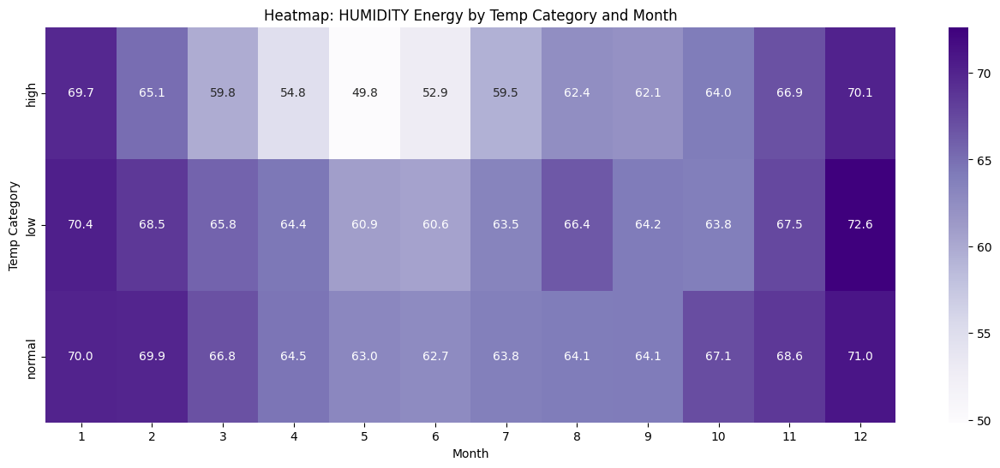

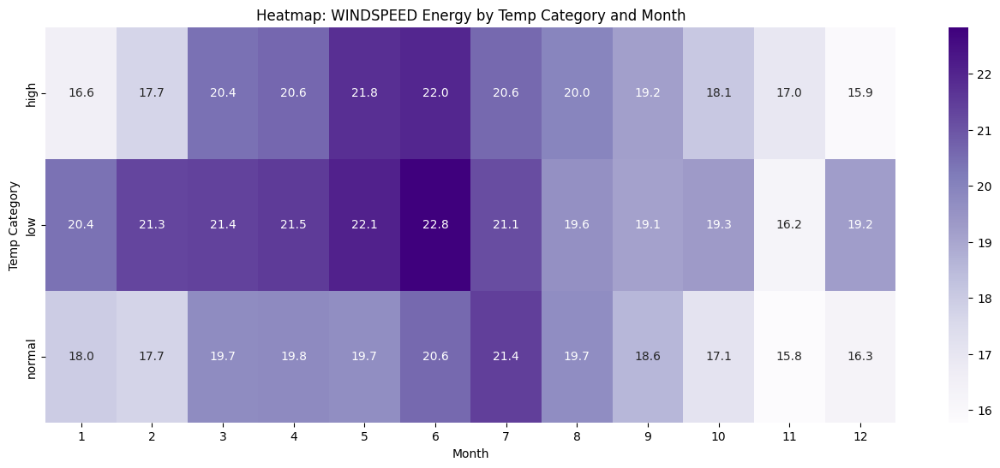

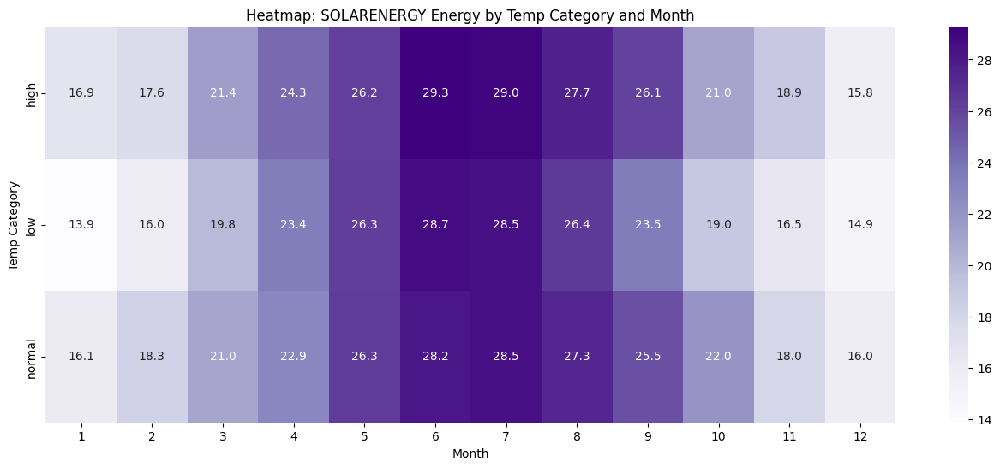

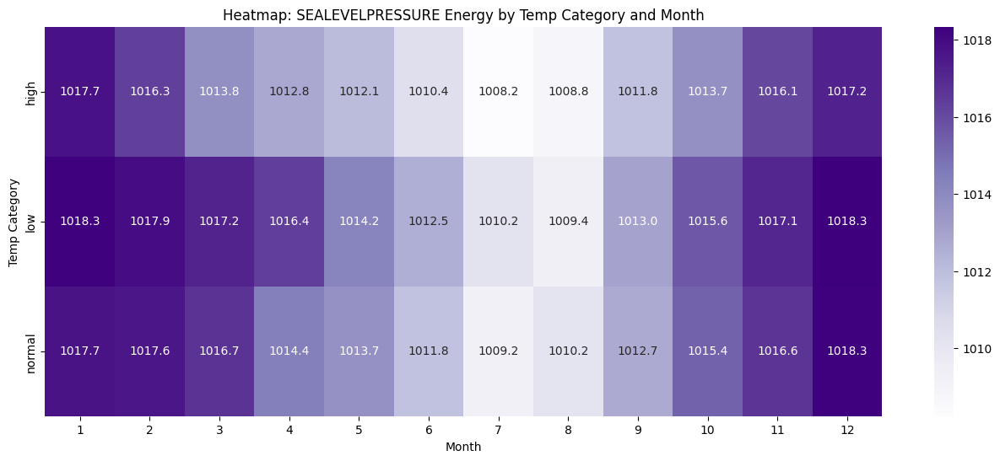

In [114]:
dscolumns = ['temp','humidity','windspeed','solarenergy','sealevelpressure']
for c in dscolumns:
    # Create a pivot table for the heatmap
    heatmap_data = df.pivot_table(index='temp_category', columns='month', values= c , aggfunc='mean')
    plt.figure(figsize=(16, 6))
    sns.heatmap(heatmap_data, cmap='Purples', annot=True, fmt=".1f")
    plt.title(f'Heatmap: {str.upper(c)} Energy by Temp Category and Month')
    plt.xlabel('Month')
    plt.ylabel('Temp Category')
    plt.show()

### **Insights and Observations**

"Insights and observations summarize the key findings from EDA and other steps in the data preprocessing. This section provides actionable insights, which are crucial for decision-making, modeling, and further analysis."

#### **Numerical Insights:**
- **Temperature:**  
  - "Maximum temperatures (`tempmax`) show a clear seasonal pattern, peaking in summer months and dipping in winter."
  - "The spread of daily temperature (`temp`) is relatively even, though some outliers reflect extreme heat events during certain summers."
  
- **Humidity:**  
  - "Humidity levels tend to decrease in higher temperature ranges, with peaks occurring during rainy seasons."

#### **Categorical Insights:**
- **Conditions:**  
  - "The majority of days are categorized as `Clear` in `conditions`, with `Rainy` being the second most common."
  - "A relatively small percentage of days are classified as `Stormy` or `Foggy`, pointing to rare but impactful weather events."
  
- **Classification of Temperature Changes:**  
  - "The `classification` column shows that `Normal` temperatures dominate, indicating typical weather conditions for the region."

#### **Bivariate Relationships:**
- **Temperature vs. Humidity:**  
  - "Higher temperatures (`temp`) are strongly correlated with lower humidity (`humidity`), indicating drier conditions during hot days."
  
- **Wind Gusts and Temperature:**  
  - "There is no significant correlation between `tempmax` and `windgust`, suggesting that temperature doesn't drive gusty conditions."

#### **Temporal Patterns and Seasonal Insights:**
- **Seasonal Variations:**  
  - "There is a distinct peak in `temp` during the summer months, while the coldest temperatures occur in December and January."
  
- **Anomalies in Precipitation:**  
  - "Unusual spikes in `precip` are linked to storm systems, as confirmed by historical weather events during specific months."

---

### **Conclusion**

"The **Exploratory Data Analysis (EDA)** phase of this project has provided valuable insights into the dataset, helping to understand its structure, patterns, and key relationships. Key findings have been extracted that will influence feature engineering, model selection, and decision-making moving forward. The next steps will focus on preparing the data for modeling, potentially using the insights gathered here to guide feature selection and engineering."

---



## **Data Preparation for Modeling**
This section will focus on preparing the data for the modeling phase. The steps include:
- Refining feature engineering based on insights gathered during the EDA process.
- Splitting the data into training and testing sets.
- Handling imbalanced data (if needed) through techniques like oversampling or undersampling.


In [89]:
# Generate descriptive statistics
summary_stats = df.describe(include="all").T
print(summary_stats)

# Check for missing values
missing_values = df.isnull().sum() # Percentage of missing values
print("Missing Values (%):\n", missing_values)

# Check for duplicate records
duplicate_count = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")

                            count unique              top   freq  \
name                        10689      1  Mansoura, Egypt  10689   
tempmax                   10689.0    NaN              NaN    NaN   
tempmin                   10689.0    NaN              NaN    NaN   
temp                      10689.0    NaN              NaN    NaN   
feelslikemax              10689.0    NaN              NaN    NaN   
feelslikemin              10689.0    NaN              NaN    NaN   
feelslike                 10689.0    NaN              NaN    NaN   
dew                       10689.0    NaN              NaN    NaN   
humidity                  10689.0    NaN              NaN    NaN   
precip                    10689.0    NaN              NaN    NaN   
precipprob                10689.0    NaN              NaN    NaN   
precipcover               10689.0    NaN              NaN    NaN   
windspeed                 10689.0    NaN              NaN    NaN   
winddir                   10689.0    NaN        

In [90]:
exclude_columns = ['name', 'Original_Date', 'new_date', 'sunrise', 'sunset']
df = df.drop(exclude_columns,axis=1)


In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10689 entries, 1995-08-01 to 2024-11-04
Data columns (total 38 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   tempmax                   10689 non-null  float64 
 1   tempmin                   10689 non-null  float64 
 2   temp                      10689 non-null  float64 
 3   feelslikemax              10689 non-null  float64 
 4   feelslikemin              10689 non-null  float64 
 5   feelslike                 10689 non-null  float64 
 6   dew                       10689 non-null  float64 
 7   humidity                  10689 non-null  float64 
 8   precip                    10689 non-null  float64 
 9   precipprob                10689 non-null  float64 
 10  precipcover               10689 non-null  float64 
 11  windspeed                 10689 non-null  float64 
 12  winddir                   10689 non-null  float64 
 13  sealevelpressure          106

In [92]:



# Copying the data to ensure the original dataset is not modified
data = df.copy() 
mapping = {
    'low': 0,
    'normal': 1,
    'high': 2
}
data['temp_category'] = data['temp_category'].map(mapping)
# 1. Apply Min-Max Scaling to numerical columns
# Selecting numerical columns
numeric_columns = data.select_dtypes(include=['float64', 'int32', 'UInt32']).columns

# Using Min-Max Scaler
scaler = MinMaxScaler()
data[numeric_columns] = scaler.fit_transform(data[numeric_columns])

# 2. Encode categorical and object columns using LabelEncoder
# Selecting categorical and object columns
categorical_columns = data.select_dtypes(include=['object', 'category']).columns

# Applying Label Encoding
encoder = LabelEncoder()
for col in categorical_columns:
    data[col] = encoder.fit_transform(data[col])

# Display the first few rows of the prepared dataset
data.head()

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,...,temp_30d_avg,humidity_7d_avg,precip_7d_avg,solarradiation_7d_avg,uvindex_7d_avg,wind_30d_avg,previous_year_temp,temp_change,prev_year_month_temp_std,temp_category
datetime,,,,,,,,,,,,,,,,,,,,,
1995-08-01,0.564033,0.809353,0.732342,0.543820,0.767123,0.783871,0.878788,0.724619,0.0,0.0,...,0.770650,0.743952,0.0,0.924895,1.0,0.795365,0.687732,0.565836,0.033573,1
1995-08-02,0.585831,0.838129,0.747212,0.546067,0.789041,0.787097,0.848485,0.652284,0.0,0.0,...,0.772935,0.734123,0.0,0.924895,1.0,0.787443,0.654275,0.612100,0.033573,2
1995-08-03,0.577657,0.845324,0.750929,0.561798,0.794521,0.793548,0.875421,0.690355,0.0,0.0,...,0.775220,0.737651,0.0,0.924895,1.0,0.790084,0.676580,0.594306,0.033573,2
1995-08-04,0.583106,0.809353,0.736059,0.561798,0.767123,0.774194,0.872054,0.710660,0.0,0.0,...,0.777995,0.730595,0.0,0.924895,1.0,0.773801,0.687732,0.569395,0.033573,1
1995-08-05,0.558583,0.845324,0.717472,0.532584,0.794521,0.758065,0.865320,0.714467,0.0,0.0,...,0.776690,0.736643,0.0,0.924895,1.0,0.781722,0.669145,0.569395,0.033573,1


In [93]:
df['temp_category'].value_counts()

temp_category
normal    6825
high      1986
low       1878
Name: count, dtype: int64

## **Model Building**
In this phase, the focus will be on selecting and building the model. The steps are:
- Choosing suitable machine learning models based on the task (regression or classification).
- Training the model using the preprocessed training data.

## **Model Evaluation**
This section will involve evaluating the trained models to ensure their performance is adequate. The steps include:
- Using appropriate evaluation metrics (MAE, MSE, accuracy, precision, recall).
- Performing cross-validation and hyperparameter tuning to improve model performance.

### Regression

In [ ]:
reg_data = data.copy()

exclude_columns = ['temp_30d_avg','temp_7d_avg','temp_range','tempmax', 'tempmin','feelslikemax', 'feelslikemin','feelslike', 'previous_year_temp','temp_change']
reg_data = reg_data.drop(exclude_columns,axis=1)

In [ ]:
reg_data.columns

In [145]:
train_data = reg_data[reg_data.index.year < 2023]
test_data = reg_data[reg_data.index.year >= 2023]
train_data.shape,test_data.shape

((10015, 24), (674, 24))

In [146]:
X_train = train_data.drop('temp',axis=1)
y_train = train_data['temp']
X_test = test_data.drop('temp',axis=1)
y_test = test_data['temp']

In [147]:
from sklearn.linear_model import LinearRegression,SGDRegressor,Lasso,Ridge
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,median_absolute_error ,r2_score

LinearRegressionModel = LinearRegression(fit_intercept=True,copy_X=True,n_jobs=-1)
SGDRegressionModel = SGDRegressor(alpha=0.1,random_state=33,penalty='l2',loss = 'huber')
LassoRegressionModel = Lasso(alpha=1.0,random_state=33)
RidgeRegressionModel = Ridge(alpha=1.0,random_state=33)
RandomForestRegressorModel = RandomForestRegressor(n_estimators=1000,max_depth=8, random_state=33)
GBRModel = GradientBoostingRegressor(n_estimators=500,max_depth=7,learning_rate = 1.5 ,random_state=33)
SVRModel = SVR(C = 1.0 ,epsilon=0.1,kernel = 'rbf') 
DecisionTreeRegressorModel = DecisionTreeRegressor( max_depth=3,random_state=33)
KNeighborsRegressorModel = KNeighborsRegressor(n_neighbors = 5, weights='uniform',algorithm = 'auto')    


Models = [LinearRegressionModel,SGDRegressionModel,LassoRegressionModel,RidgeRegressionModel,RandomForestRegressorModel,
          GBRModel,SVRModel,DecisionTreeRegressorModel,KNeighborsRegressorModel]





for Model in Models : 
    print(f'for Model {str(Model).split("(")[0]}')
    Model.fit(X_train, y_train)
    print(f'Train Score is : {Model.score(X_train, y_train)}')
    print(f'Test Score is : {Model.score(X_test, y_test)}')
    y_pred = Model.predict(X_test)
    print(f'MAE value is  : {mean_absolute_error(y_test, y_pred)}')
    print(f'MSE value is  : {mean_squared_error(y_test, y_pred)}')
    print(f'MdSE value is  : {median_absolute_error(y_test, y_pred)}')
    print('R2 Score : ',r2_score(y_test,y_pred)*100)
    print('=================================================')
    




for Model LinearRegression
Train Score is : 0.9823307576569588
Test Score is : 0.9827536694176912
MAE value is  : 0.021865178271424895
MSE value is  : 0.000784892630536892
MdSE value is  : 0.01826580978598638
R2 Score :  98.27536694176912
for Model SGDRegressor
Train Score is : 0.5803842086493884
Test Score is : 0.6526890755898827
MAE value is  : 0.1030079263801079
MSE value is  : 0.015806364361013077
MdSE value is  : 0.0962674745826444
R2 Score :  65.26890755898826
for Model Lasso
Train Score is : 0.0
Test Score is : -0.01160404159388806
MAE value is  : 0.18952765572169472
MSE value is  : 0.04603881118241218
MdSE value is  : 0.2053681559445219
R2 Score :  -1.160404159388806
for Model Ridge
Train Score is : 0.9821653682417592
Test Score is : 0.9833330400048531
MAE value is  : 0.021677128693767853
MSE value is  : 0.0007585250677650328
MdSE value is  : 0.017929973384027187
R2 Score :  98.33330400048531
for Model RandomForestRegressor
Train Score is : 0.9897199365892332
Test Score is : 0.

In [150]:
RL_model = LinearRegression(fit_intercept=True,copy_X=True,n_jobs=-1)
RL_model.fit(X_train, y_train)


print(f'Train Score is : {RL_model.score(X_train, y_train)}')
print(f'Test Score is : {RL_model.score(X_test, y_test)}')
y_pred = RL_model.predict(X_test)
print(f'MAE value is  : {mean_absolute_error(y_test, y_pred)}')
print(f'MSE value is  : {mean_squared_error(y_test, y_pred)}')
print(f'MdSE value is  : {median_absolute_error(y_test, y_pred)}')
print('R2 Score : ',r2_score(y_test,y_pred)*100)


Train Score is : 0.9823307576569588
Test Score is : 0.9827536694176912
MAE value is  : 0.021865178271424895
MSE value is  : 0.000784892630536892
MdSE value is  : 0.01826580978598638
R2 Score :  98.27536694176912


In [153]:
feature_importance = pd.DataFrame({ 'feature': reg_data.drop('temp',axis=1).columns,'importance': abs(RL_model.coef_)  })
feature_importance = feature_importance.sort_values('importance', ascending=False)
print(feature_importance)

                     feature  importance
0                        dew    1.116064
1                   humidity    0.891208
11               solarenergy    0.316797
10            solarradiation    0.292759
20              wind_30d_avg    0.088380
5                  windspeed    0.068972
15                      year    0.055438
9                 visibility    0.046636
7           sealevelpressure    0.045334
12                   uvindex    0.044241
3                 precipprob    0.024100
4                precipcover    0.017784
6                    winddir    0.013424
22             temp_category    0.012526
8                 cloudcover    0.012399
17               week_number    0.009271
16                     month    0.006858
14                conditions    0.004963
2                     precip    0.003709
19                    season    0.002449
21  prev_year_month_temp_std    0.002057
13                 moonphase    0.001375
18                       day    0.001179


In [202]:
def aggregate_data(data, freq):
    return {
        'min': data.resample(freq).min(),
        'max': data.resample(freq).max(),
        'mode': data.resample(freq).agg(lambda x: x.value_counts().index[0])
    }

# 5. Function to test the model
def test_model(data, name, freq_name):
    X_test = data.drop('temp',axis=1)
    y_test = data['temp']
    
    predictions = RL_model.predict(X_test)
    
    mse = mean_squared_error(y_test, predictions)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, predictions)*100
    
    print(f"{freq_name.capitalize()} Test Results ({name}):")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"R-squared: {r2}")
    print("---")
    
    # # Display actual vs predicted values
    # results = pd.DataFrame({'Actual': y_test, 'Predicted': predictions}, index=data.index)
    # print(results)
    # print("---")


# 7. Aggregate the data based on weekly, monthly, and seasonal frequencies
frequencies = {
    'weekly': 'W',
    'monthly': 'M',
    'seasonal': 'Q'  # Seasonal based on March-February cycle
}

for freq_name, freq in frequencies.items():
    aggregated_data = aggregate_data(reg_data, freq)
    
    # Test the model on each type of aggregated data
    test_model(aggregated_data['min'], "Minimum", freq_name)
    test_model(aggregated_data['max'], "Maximum", freq_name)
    test_model(aggregated_data['mode'], "Mode", freq_name)
    mode = aggregated_data['mode']
    print(mode)


Weekly Test Results (Minimum):
MSE: 0.006231770808529018
RMSE: 0.0789415657846297
R-squared: 86.81321244644634
---
Weekly Test Results (Maximum):
MSE: 0.007159360514897423
RMSE: 0.08461300440769978
R-squared: 83.18759871797036
---
Weekly Test Results (Mode):
MSE: 0.003805339186228148
RMSE: 0.06168743134730241
R-squared: 91.44372754876355
---
                temp       dew  humidity    precip  precipprob  precipcover  \
datetime                                                                      
1995-08-06  0.732342  0.878788  0.724619  0.000000         0.0       0.0000   
1995-08-13  0.710037  0.865320  0.676396  0.000000         0.0       0.0000   
1995-08-20  0.717472  0.814815  0.631980  0.000000         0.0       0.0000   
1995-08-27  0.721190  0.865320  0.734772  0.000000         0.0       0.0000   
1995-09-03  0.739777  0.811448  0.722081  0.000000         0.0       0.0000   
...              ...       ...       ...       ...         ...          ...   
2024-10-13  0.613383  0.

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2958803354.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  'min': data.resample(freq).min(),
C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2958803354.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  'max': data.resample(freq).max(),
C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2958803354.py:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  'mode': data.resample(freq).agg(lambda x: x.value_counts().index[0])


Monthly Test Results (Minimum):
MSE: 0.014920697643491939
RMSE: 0.12215030758656295
R-squared: 70.20052476734267
---
Monthly Test Results (Maximum):
MSE: 0.01830379402157999
RMSE: 0.1352915149652039
R-squared: 51.529467339457646
---
Monthly Test Results (Mode):
MSE: 0.007783065613961002
RMSE: 0.08822168448834448
R-squared: 81.64104409729339
---
                temp       dew  humidity  precip  precipprob  precipcover  \
datetime                                                                    
1995-08-31  0.739777  0.865320  0.714467     0.0         0.0       0.0000   
1995-09-30  0.657993  0.821549  0.664975     0.0         0.0       0.0000   
1995-10-31  0.550186  0.727273  0.710660     0.0         0.0       0.0000   
1995-11-30  0.431227  0.582492  0.661168     0.0         0.0       0.0000   
1995-12-31  0.271375  0.562290  0.795685     0.0         0.0       0.0000   
...              ...       ...       ...     ...         ...          ...   
2024-07-31  0.773234  0.882155  0.703

C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2958803354.py:3: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  'min': data.resample(freq).min(),
C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2958803354.py:4: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  'max': data.resample(freq).max(),
C:\Users\awint\AppData\Local\Temp\ipykernel_23848\2958803354.py:5: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  'mode': data.resample(freq).agg(lambda x: x.value_counts().index[0])


Seasonal Test Results (Minimum):
MSE: 0.031313663312600284
RMSE: 0.1769566707208301
R-squared: 32.81449659459278
---
Seasonal Test Results (Maximum):
MSE: 0.03457537692696892
RMSE: 0.18594455336731142
R-squared: -48.778814791979144
---
Seasonal Test Results (Mode):
MSE: 0.015874084807110396
RMSE: 0.12599239979899737
R-squared: 64.09908989024564
---
                temp       dew  humidity  precip  precipprob  precipcover  \
datetime                                                                    
1995-09-30  0.739777  0.865320  0.714467     0.0         0.0          0.0   
1995-12-31  0.271375  0.562290  0.710660     0.0         0.0          0.0   
1996-03-31  0.263941  0.488215  0.767766     0.0         0.0          0.0   
1996-06-30  0.620818  0.720539  0.730964     0.0         0.0          0.0   
1996-09-30  0.680297  0.848485  0.715736     0.0         0.0          0.0   
...              ...       ...       ...     ...         ...          ...   
2023-12-31  0.721190  0.784512  0

In [ ]:

# inst_sample = [[33.5, 23.9, 15.0, 75, 1.2,100,4.15,30.0,357.2,24.1,349.7,19.5,9.0]]
# rf_model.predict(inst_sample)

In [ ]:
df['temp'].u

### classification

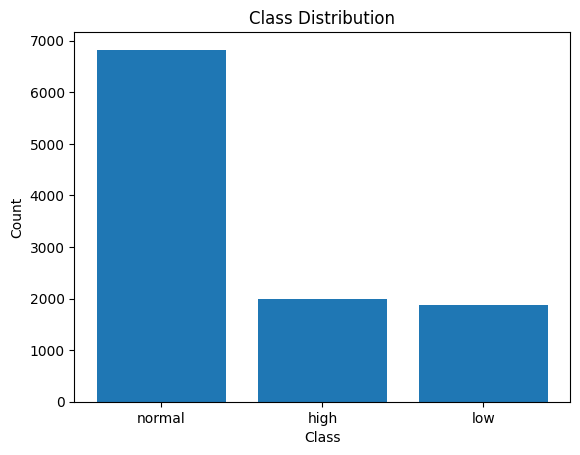

In [203]:
x=df.drop(["temp_category"],axis=1)
y=df["temp_category"]

count_class = y.value_counts() # Count the occurrences of each class
plt.bar(count_class.index, count_class.values)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.xticks(count_class.index, ['normal', 'high','low'])
plt.show()

In [ ]:
class_data = data.copy()

># exclude_columns = ['uvindex_7d_avg','solarradiation_7d_avg','precip_7d_avg','humidity_7d_avg','temp_30d_avg',
#                    'temp_7d_avg','temp_range','tempmax', 'tempmin','feelslikemax', 'feelslikemin','feelslike',
#                    'previous_year_temp','temp_change']
# class_data = class_data.drop(exclude_columns,axis=1)

In [194]:
train_data = class_data[(class_data.index.year < 2020)]

test_data = class_data[(class_data.index.year >= 2020)]
train_data.shape , test_data.shape

((8919, 38), (1770, 38))

In [195]:
train_data.columns

Index(['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin',
       'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'moonphase', 'conditions',
       'year', 'month', 'week_number', 'day', 'season', 'temp_range',
       'temp_7d_avg', 'temp_30d_avg', 'humidity_7d_avg', 'precip_7d_avg',
       'solarradiation_7d_avg', 'uvindex_7d_avg', 'wind_30d_avg',
       'previous_year_temp', 'temp_change', 'prev_year_month_temp_std',
       'temp_category'],
      dtype='object')

In [196]:
df[(df.index.year == 2020)]['temp_category'].value_counts()

temp_category
normal    221
high       73
low        72
Name: count, dtype: int64

In [197]:
X_train = train_data.drop('temp_category',axis=1)
y_train = train_data['temp_category']
X_test = test_data.drop('temp_category',axis=1)
y_test = test_data['temp_category']

In [198]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

###########################################

GaussianNBModel = GaussianNB()
BernoulliNBModel = BernoulliNB(alpha=1.0,binarize=1)
LogisticRegressionModel = LogisticRegression(penalty='l2',solver='sag',C=1.0,random_state=33)
RandomForestClassifierModel = RandomForestClassifier(criterion='gini', n_estimators=300, max_depth=7, random_state=33, class_weight='balanced') 
GBCModel = GradientBoostingClassifier(n_estimators=100,max_depth=3,random_state=33) 

SVCModel = SVC(kernel= 'rbf',max_iter=100,C=1.0,gamma='auto')
DecisionTreeClassifierModel = DecisionTreeClassifier(criterion='gini',max_depth=3,random_state=33)
KNNClassifierModel = KNeighborsClassifier(n_neighbors= 5,weights ='uniform',algorithm='auto') 

Models = [GaussianNBModel,KNNClassifierModel,
          BernoulliNBModel,LogisticRegressionModel,RandomForestClassifierModel,
          GBCModel,DecisionTreeClassifierModel]


###########################################


ModelsScore = {}
for Model in Models : 
    print(f'for Model {str(Model).split("(")[0]}')
    Model.fit(X_train, y_train)
    print(f'Train Score is : {Model.score(X_train, y_train)}')
    print(f'Test Score is : {Model.score(X_test, y_test)}')
    y_pred = Model.predict(X_test)
    
    ClassificationReport = classification_report(y_test,y_pred)
    print('Classification Report is : \n', ClassificationReport )
    print(f'Precision value is  : {ClassificationReport.split()[24]}')
    print(f'Recall value is  : {ClassificationReport.split()[25]}')
    print(f'F1 Score value is  : {ClassificationReport.split()[26]}')
    ModelsScore[str(Model).split("(")[0]] = [ClassificationReport.split()[24],
                                             ClassificationReport.split()[25],ClassificationReport.split()[26]]
    print('=================================================')    

for Model GaussianNB
Train Score is : 0.7503083305303285
Test Score is : 0.4350282485875706
Classification Report is : 
               precision    recall  f1-score   support

           0       0.37      0.87      0.51       530
           1       0.72      0.25      0.37       751
           2       0.50      0.25      0.33       489

    accuracy                           0.44      1770
   macro avg       0.53      0.46      0.41      1770
weighted avg       0.55      0.44      0.40      1770

Precision value is  : 0.53
Recall value is  : 0.46
F1 Score value is  : 0.41
for Model KNeighborsClassifier
Train Score is : 0.8421347684718018
Test Score is : 0.5440677966101695
Classification Report is : 
               precision    recall  f1-score   support

           0       0.63      0.35      0.45       530
           1       0.50      0.81      0.62       751
           2       0.65      0.35      0.46       489

    accuracy                           0.54      1770
   macro avg      

c:\Users\awint\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\awint\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\awint\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Train Score is : 0.9362036102702097
Test Score is : 0.9293785310734464
Classification Report is : 
               precision    recall  f1-score   support

           0       1.00      0.87      0.93       530
           1       0.86      0.99      0.92       751
           2       1.00      0.90      0.94       489

    accuracy                           0.93      1770
   macro avg       0.95      0.92      0.93      1770
weighted avg       0.94      0.93      0.93      1770

Precision value is  : 0.95
Recall value is  : 0.92
F1 Score value is  : 0.93
for Model RandomForestClassifier
Train Score is : 0.9490974324475838
Test Score is : 0.9322033898305084
Classification Report is : 
               precision    recall  f1-score   support

           0       0.90      1.00      0.95       530
           1       1.00      0.84      0.91       751
           2       0.89      1.00      0.94       489

    accuracy                           0.93      1770
   macro avg       0.93      0.95    

In [200]:
GBCModel = GradientBoostingClassifier(n_estimators=100,max_depth=3,random_state=33) 
GBCModel.fit(X_train, y_train)


print(f'Train Score is : {GBCModel.score(X_train, y_train)}')
print(f'Test Score is : {GBCModel.score(X_test, y_test)}')
y_pred = GBCModel.predict(X_test)

ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : \n', ClassificationReport )
print(f'Precision value is  : {ClassificationReport.split()[24]}')
print(f'Recall value is  : {ClassificationReport.split()[25]}')
print(f'F1 Score value is  : {ClassificationReport.split()[26]}')


feature_importance = pd.DataFrame({ 'feature': class_data.drop('temp_category',axis=1).columns,'importance':GBCModel.feature_importances_  })
feature_importance = feature_importance.sort_values('importance', ascending=False)
print(feature_importance)

Train Score is : 1.0
Test Score is : 1.0
Classification Report is : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       530
           1       1.00      1.00      1.00       751
           2       1.00      1.00      1.00       489

    accuracy                           1.00      1770
   macro avg       1.00      1.00      1.00      1770
weighted avg       1.00      1.00      1.00      1770

Precision value is  : 1.00
Recall value is  : 1.00
F1 Score value is  : 1.00
                     feature    importance
35               temp_change  8.814289e-01
36  prev_year_month_temp_std  1.171847e-01
22                     month  2.911244e-04
2                       temp  2.620468e-04
34        previous_year_temp  1.920491e-04
5                  feelslike  1.578210e-04
1                    tempmin  1.092907e-04
11                 windspeed  5.335115e-05
3               feelslikemax  4.242434e-05
23               week_number  3.421102e-05